# Coursework Part 2 - Individual Task

This section of the coursework implements an RL algorithm of choice to a game on the Atari Learning Environment - using RL-Lib. 

RL-Lib is an open source library for reinforcement learning that:

*   Enables highly distributed learning
*   Supports a variety of algorithms, ranging from gradient-based to derivative-free algorithms
*   Has a flexible API allowing for ease of use in various programming environments

The algorithm of choice will be the Deep Q-network. Improvements will also be added, including:

*   Double Deep Q-networks - involves decoupling of action evaluation and selection in max operator of target values in order to prevent Q-value overestimation. 
*   Dueling Deep Q-networks - involves two different estimators: state value functions and advantage functions, which are combined to approximate Q-values. Allows for examination of valuable states, without considering actions
*   Prioritized Experience Replay - extends experience replay to add priority to important experiences. Rather than randomly sampling from memory, high priority transitions will have a greater probablility of being sampled. This high priority is determined by changes in the TD error. High changes correspond to important memories. This improvement results in faster training. 

An ablation study will be conducted in order to ascertain the extent to which the improvements above increase/decrease performance. 

The environment of choice from the Atari Learning Environment is Breakout. It includes a wall of bricks, bat and ball. Upon hitting a block, a reward is received, and the block is removed. The bat has to be moved to prevent the ball from going out of play - which will cause the agent to lose a life. 

The agent's actions correspond to movement along a horizontal axis at the bottom of the screen. 

In the Atari learning environment, two versions of this game are provided:

* Observations provided as pixels
* Observations provided as positions in RAM - version of choice

Breakout was chosen as experiments in the existing literature showed marginal improvement in performance for double deep Q-networks and *decreased* performance for dueling deep Q-networks. The ablation study will investigate performance on combining the two, as well as the effects of Prioritized Experience Replay.


















In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installing dependencies required for Breakout
!pip install gym[atari,accept-rom-license]==0.21.0

     |████████████████████████████████| 1.5 MB 5.2 MB/s 
     |████████████████████████████████| 1.6 MB 34.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616822 sha256=2faf06bae2050129ae120917fdca04b543bf8e051a51933fa1db4e8809a3a3ea
  Stored in directory: /root/.cache/pip/wheels/76/ee/9c/36bfe3e079df99acf5ae57f4e3464ff2771b34447d6d2f2148
  Created wheel for AutoROM.accept-rom-license: filename=AutoROM.accept_rom_license-0.4.2-py3-none-any.whl size=441027 sha256=603290177fb01f81ce17d679a9d87378eb06a4f9b942a743e7d7518186a91fcc
  Stored in directory: /root/.cache/pip/wheels/87/67/2e/6147e7912fe37f5408b80d07527dab807c1d25f5c403a9538a
Successfully built gym AutoROM.accept-rom-license
  Attempting uninstall: gym
    Found existing installation: gym 0.17.3
    Uninstalling gym-0.17.3:
      Successfully uninstalled gym-0.17.3


In [ ]:
!pip install 'ray[rllib]'==1.6

     |████████████████████████████████| 49.6 MB 25 kB/s 
     |████████████████████████████████| 226 kB 40.8 MB/s 
     |████████████████████████████████| 1.2 MB 62.3 MB/s 
     |████████████████████████████████| 125 kB 59.6 MB/s 


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import ray
from ray import tune
from ray.tune import grid_search
import ray.rllib.agents.dqn as dqn 
from IPython.display import Image

## Hyperparameter tuning for Breakout

An ablation study will now be performed in tandem with hyperparameter tuning. The ray tune function in the RL-Lib facilitates a simple implementation of these tasks. For the purpose of this study, we will examine the Vanilla DQN, and examine the changes in performance when adding the improvements of the Double and Dueling DQN architecture. Therefore, the following combinations of algorithms will be examined:


*   DQN + PER
*   DDQN + PER
*   Dueling DQN + PER
*   Dueling Double DQN + PER

The study of hyperparameters will include the learning rate and discount factor. We will be limited to 2 values for each, and 100 iterations per combination above. Whilst this is not ideal for thorough analysis, computational restrains limit a broader study. 





In [ ]:
# Definition of an objective function 
# NOTE: This code has been adapted from Lab 09 of the INM707 Deep Reinforcement Learning course at City, University of London
def objective_fn(config):
  trainer = dqn.DQNTrainer(config=config)
  for i in range(100):
    result = trainer.train()
    avg_score = result["episode_reward_mean"]
    tune.report(iterations = i, mean_reward=avg_score)

In [ ]:
# Implementation of hyperparameter tuning - choice of neural network architecture inspired by Zynkowski
ray.init()
config = dqn.DEFAULT_CONFIG.copy()
config["env"] = 'Breakout-ramDeterministic-v4'
config["framework"] = "torch"
config["dueling"] = tune.grid_search([True, False])
config["double_q"] = tune.grid_search([True, False])
config["lr"] = tune.grid_search([0.00001, 0.0001])
config["model"] = {
    "fcnet_hiddens": [64, 64],
    "fcnet_activation": "relu"
}
config["gamma"] = tune.grid_search([0.9, 1.0])

/usr/local/lib/python3.7/dist-packages/ray/_private/services.py:238: UserWarning: Not all Ray Dashboard dependencies were found. To use the dashboard please install Ray using `pip install ray[default]`. To disable this message, set RAY_DISABLE_IMPORT_WARNING env var to '1'.
  warnings.warn(warning_message)


In [ ]:
analysis = tune.run(
    objective_fn,
    metric = 'mean_reward',
    mode="max",
    num_samples=1,
    config=config
)

2022-04-24 05:14:56,067	WARNING function_runner.py:559 -- Function checkpointing is disabled. This may result in unexpected behavior when using checkpointing features or certain schedulers. To enable, set the train function arguments to be `func(config, checkpoint_dir=None)`.


Trial name,status,loc,double_q,dueling,gamma,lr
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,,True,True,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,PENDING,,False,True,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001


Trial name,status,loc,double_q,dueling,gamma,lr
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,,True,True,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,,False,True,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001


(pid=433) 2022-04-24 05:15:09,029	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=433) 2022-04-24 05:15:09,063	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=433) 2022-04-24 05:15:09,063	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=433) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=433) [Powered by Stella]
(pid=434) 2022-04-24 05:15:09,526	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=434) 2022-04-24 05:15:09,751	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=434) 2022-04-24 05:15:09,752	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log

Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-14
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 2.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64285714285714
    ram_util_percent: 21.485714285714288
  pid: 434
  time_since_restore: 4.848747491836548
  time_this_iter_s: 4.848747491836548
  time_total_s: 4.848747491836548
  timestamp: 1650777314
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00001
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,,True,True,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,1,4.84875,0,2.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-14
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 0.3333333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.775
    ram_util_percent: 21.4625
  pid: 433
  time_since_restore: 5.4931864738464355
  time_this_iter_s: 5.4931864738464355
  time_total_s: 5.4931864738464355
  timestamp: 1650777314
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-22
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30833333333334
    ram_util_percent: 21.59166666666667
  pid: 434
  time_since_restore: 13.229294061660767
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,1,5.49319,0,0.333333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,2,13.2293,1,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-23
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 0.8181818181818182
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 21.6
  pid: 433
  time_since_restore: 14.063894510269165
  time_this_iter_s: 8.57070803642273
  time_total_s: 14.063894510269165
  timestamp: 1650777323
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-31
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 2.4615384615384617
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.676923076923075
  pid: 434
  time_since_restore: 21.78526663780212

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,2,14.0639,1,0.818182
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,3,21.7853,2,2.46154
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-31
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.125
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 21.683333333333326
  pid: 433
  time_since_restore: 22.671497344970703
  time_this_iter_s: 8.607602834701538
  time_total_s: 22.671497344970703
  timestamp: 1650777331
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-39
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 2.2222222222222223
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.750000000000004
  pid: 434
  time_since_restore: 30.312127828598

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,3,22.6715,2,1.125
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,4,30.3121,3,2.22222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-40
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 21.758333333333336
  pid: 433
  time_since_restore: 31.282650232315063
  time_this_iter_s: 8.61115288734436
  time_total_s: 31.282650232315063
  timestamp: 1650777340
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-48
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 2.3333333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.81818181818182
  pid: 434
  time_since_restore: 38.566246032714844

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,4,31.2827,3,1.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,5,38.5662,4,2.33333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-48
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 21.825000000000003
  pid: 433
  time_since_restore: 39.958203077316284
  time_this_iter_s: 8.67555284500122
  time_total_s: 39.958203077316284
  timestamp: 1650777348
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-15-56
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 2.423076923076923
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.9
  pid: 434
  time_since_restore: 47.056092977523804
  time_this_i

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,5,39.9582,4,1.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,6,47.0561,5,2.42308
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-15-57
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.4838709677419355
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692306
    ram_util_percent: 21.9
  pid: 433
  time_since_restore: 48.539742946624756
  time_this_iter_s: 8.581539869308472
  time_total_s: 48.539742946624756
  timestamp: 1650777357
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-05
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 2.466666666666667
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.925
  pid: 434
  time_since_restore: 55.63583707809448
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,6,48.5397,5,1.48387
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,7,55.6358,6,2.46667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-06
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.3611111111111112
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.933333333333334
  pid: 433
  time_since_restore: 57.12800931930542
  time_this_iter_s: 8.588266372680664
  time_total_s: 57.12800931930542
  timestamp: 1650777366
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-13
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 2.3714285714285714
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.008333333333336
  pid: 434
  time_since_restore: 63.9951601028442

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,7,57.128,6,1.36111
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,8,63.9952,7,2.37143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-14
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.2380952380952381
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73333333333333
    ram_util_percent: 22.016666666666666
  pid: 433
  time_since_restore: 65.80689907073975
  time_this_iter_s: 8.678889751434326
  time_total_s: 65.80689907073975
  timestamp: 1650777374
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-22
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 2.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.108333333333334
  pid: 434
  time_since_restore: 72.60832357406616


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,8,65.8069,7,1.2381
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,9,72.6083,8,2.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-23
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.0833333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53076923076924
    ram_util_percent: 22.1
  pid: 433
  time_since_restore: 74.50914931297302
  time_this_iter_s: 8.702250242233276
  time_total_s: 74.50914931297302
  timestamp: 1650777383
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-30
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.2857142857142856
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.174999999999997
  pid: 434
  time_since_restore: 81.10869717597961

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,9,74.5091,8,1.08333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,10,81.1087,9,2.28571
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-33
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.1296296296296295
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78571428571429
    ram_util_percent: 22.242857142857137
  pid: 433
  time_since_restore: 84.66778802871704
  time_this_iter_s: 10.158638715744019
  time_total_s: 84.66778802871704
  timestamp: 1650777393
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-40
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 2.2666666666666666
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.97857142857143
    ram_util_percent: 22.592857142857138
  pid: 434
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,10,84.6678,9,1.12963
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,11,91.2392,10,2.26667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-42
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.1551724137931034
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.05384615384615
    ram_util_percent: 22.692307692307686
  pid: 433
  time_since_restore: 93.82364106178284
  time_this_iter_s: 9.155853033065796
  time_total_s: 93.82364106178284
  timestamp: 1650777402
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-49
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 2.2291666666666665
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.03333333333335
    ram_util_percent: 22.750000000000004
  pid: 434
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,11,93.8236,10,1.15517
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,12,99.6137,11,2.22917
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-16-51
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.0615384615384615
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.3923076923077
    ram_util_percent: 22.78461538461539
  pid: 433
  time_since_restore: 102.49663472175598
  time_this_iter_s: 8.672993659973145
  time_total_s: 102.49663472175598
  timestamp: 1650777411
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-16-58
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.235294117647059
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.592307692307692
  pid: 434
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,12,102.497,11,1.06154
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,13,108.67,12,2.23529
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-00
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 0.9722222222222222
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 22.5
  pid: 433
  time_since_restore: 111.78105187416077
  time_this_iter_s: 9.284417152404785
  time_total_s: 111.78105187416077
  timestamp: 1650777420
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-06
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.185185185185185
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.553846153846152
  pid: 434
  time_since_restore: 117.25396943

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,13,111.781,12,0.972222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,14,117.254,13,2.18519
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-09
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 0.9113924050632911
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.875
    ram_util_percent: 22.583333333333332
  pid: 433
  time_since_restore: 120.58905339241028
  time_this_iter_s: 8.808001518249512
  time_total_s: 120.58905339241028
  timestamp: 1650777429
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-15
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.125
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.16666666666667
    ram_util_percent: 22.63333333333333
  pid: 434
  time_since_restore: 125.824924

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,14,120.589,13,0.911392
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,15,125.825,14,2.125
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-18
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 0.9294117647058824
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53076923076924
    ram_util_percent: 22.66153846153846
  pid: 433
  time_since_restore: 129.52448272705078
  time_this_iter_s: 8.935429334640503
  time_total_s: 129.52448272705078
  timestamp: 1650777438
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-23
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 2.103448275862069
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.7
  pid: 434
  time_since_restore: 134.422443628

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,15,129.524,14,0.929412
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,16,134.422,15,2.10345
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-27
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 1.0888888888888888
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076922
    ram_util_percent: 22.73076923076923
  pid: 433
  time_since_restore: 138.33267784118652
  time_this_iter_s: 8.808195114135742
  time_total_s: 138.33267784118652
  timestamp: 1650777447
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-33
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 2.1639344262295084
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 22.723076923076924
  pid: 434
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,16,138.333,15,1.08889
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,17,143.625,16,2.16393
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-36
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 1.105263157894737
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65384615384616
    ram_util_percent: 22.615384615384617
  pid: 433
  time_since_restore: 147.54253768920898
  time_this_iter_s: 9.209859848022461
  time_total_s: 147.54253768920898
  timestamp: 1650777456
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-41
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 2.0615384615384613
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.25
    ram_util_percent: 22.541666666666668
  pid: 434
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,17,147.543,16,1.10526
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,18,152.429,17,2.06154
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-45
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.57692307692308
    ram_util_percent: 22.584615384615386
  pid: 433
  time_since_restore: 156.6698215007782
  time_this_iter_s: 9.127283811569214
  time_total_s: 156.6698215007782
  timestamp: 1650777465
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-50
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.9710144927536233
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 22.62307692307692
  pid: 434
  time_since_restore: 16

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,18,156.67,17,1.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,19,161.082,18,1.97101
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-17-54
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 22.66666666666666
  pid: 433
  time_since_restore: 165.41813850402832
  time_this_iter_s: 8.748317003250122
  time_total_s: 165.41813850402832
  timestamp: 1650777474
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-17-59
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 1.9583333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.7
  pid: 434
  time_since_restore: 169.85104608535767
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,19,165.418,18,1.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,20,169.851,19,1.95833
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-03
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 1.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83076923076922
    ram_util_percent: 22.707692307692305
  pid: 433
  time_since_restore: 174.2638201713562
  time_this_iter_s: 8.84568166732788
  time_total_s: 174.2638201713562
  timestamp: 1650777483
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-07
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 1.9324324324324325
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 22.76666666666667
  pid: 434
  time_since_restore: 178.39703464508

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,20,174.264,19,1.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,21,178.397,20,1.93243
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-12
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 1.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 22.8
  pid: 433
  time_since_restore: 183.2394359111786
  time_this_iter_s: 8.975615739822388
  time_total_s: 183.2394359111786
  timestamp: 1650777492
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-16
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 1.9230769230769231
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65384615384616
    ram_util_percent: 22.838461538461537
  pid: 434
  time_since_restore: 187.09470868110

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,21,183.239,20,1.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,22,187.095,21,1.92308
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-21
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 1.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82307692307693
    ram_util_percent: 22.876923076923074
  pid: 433
  time_since_restore: 192.15453791618347
  time_this_iter_s: 8.915102005004883
  time_total_s: 192.15453791618347
  timestamp: 1650777501
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-25
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 1.9876543209876543
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 22.891666666666666
  pid: 434
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,22,192.155,21,1.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,23,195.781,22,1.98765
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-29
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 1.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 22.90833333333333
  pid: 433
  time_since_restore: 200.7929949760437
  time_this_iter_s: 8.63845705986023
  time_total_s: 200.7929949760437
  timestamp: 1650777509
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-33
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 22.958333333333332
  pid: 434
  time_since_restore: 204.39802622795105

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,23,200.793,22,1.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,24,204.398,23,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-38
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 1.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.91538461538462
    ram_util_percent: 23.0
  pid: 433
  time_since_restore: 209.62070679664612
  time_this_iter_s: 8.827711820602417
  time_total_s: 209.62070679664612
  timestamp: 1650777518
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-42
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 2.046511627906977
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.030769230769234
  pid: 434
  time_since_restore: 213.18376231193542
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,24,209.621,23,1.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,25,213.184,24,2.04651
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-47
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 1.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 23.083333333333332
  pid: 433
  time_since_restore: 218.30597519874573
  time_this_iter_s: 8.68526840209961
  time_total_s: 218.30597519874573
  timestamp: 1650777527
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-18-51
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.0555555555555554
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 23.099999999999998
  pid: 434
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,25,218.306,24,1.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,26,221.814,25,2.05556
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-18-56
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 1.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74615384615385
    ram_util_percent: 23.1
  pid: 433
  time_since_restore: 227.01886224746704
  time_this_iter_s: 8.712887048721313
  time_total_s: 227.01886224746704
  timestamp: 1650777536
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-00
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 2.031578947368421
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 23.138461538461534
  pid: 434
  time_since_restore: 230.5767087936

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,26,227.019,25,1.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,27,230.577,26,2.03158
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-04
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 1.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 23.191666666666663
  pid: 433
  time_since_restore: 235.77961540222168
  time_this_iter_s: 8.760753154754639
  time_total_s: 235.77961540222168
  timestamp: 1650777544
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-08
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 2.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85000000000001
    ram_util_percent: 23.2
  pid: 434
  time_since_restore: 239.2916760444641
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,27,235.78,26,1.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,28,239.292,27,2.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-13
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 1.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74615384615385
    ram_util_percent: 23.24615384615385
  pid: 433
  time_since_restore: 244.68507075309753
  time_this_iter_s: 8.905455350875854
  time_total_s: 244.68507075309753
  timestamp: 1650777553
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-17
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 2.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85000000000001
    ram_util_percent: 23.283333333333335
  pid: 434
  time_since_restore: 247.8766484260

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,28,244.685,27,1.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,29,247.877,28,2.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-22
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 1.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.625
    ram_util_percent: 23.316666666666666
  pid: 433
  time_since_restore: 253.33962678909302
  time_this_iter_s: 8.654556035995483
  time_total_s: 253.33962678909302
  timestamp: 1650777562
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-25
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 2.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55
    ram_util_percent: 23.366666666666664
  pid: 434
  time_since_restore: 256.3966658115387
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,29,253.34,28,1.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,30,256.397,29,2.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-31
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 1.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64615384615385
    ram_util_percent: 23.407692307692304
  pid: 433
  time_since_restore: 261.99713015556335
  time_this_iter_s: 8.657503366470337
  time_total_s: 261.99713015556335
  timestamp: 1650777571
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00000
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,30,261.997,29,1.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,30,256.397,29,2.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-34
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 2.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76153846153846
    ram_util_percent: 23.430769230769233
  pid: 434
  time_since_restore: 264.9759945869446
  time_this_iter_s: 8.579328775405884
  time_total_s: 264.9759945869446
  timestamp: 1650777574
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-39
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 2.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.483333333333334
  pid: 433
  time_since_restore: 270.83753180503845
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,31,270.838,30,2.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,31,264.976,30,2.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-42
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 2.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 23.5
  pid: 434
  time_since_restore: 273.41903591156006
  time_this_iter_s: 8.443041324615479
  time_total_s: 273.41903591156006
  timestamp: 1650777582
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-48
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 2.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 23.56153846153847
  pid: 433
  time_since_restore: 279.51226902008057
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,32,279.512,31,2.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,32,273.419,31,2.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-19-51
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 2.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 23.600000000000005
  pid: 434
  time_since_restore: 281.9114496707916
  time_this_iter_s: 8.492413759231567
  time_total_s: 281.9114496707916
  timestamp: 1650777591
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-19-57
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 2.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 23.63333333333333
  pid: 433
  time_since_restore: 288.195333480834

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,33,288.195,32,2.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,33,281.911,32,2.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-00
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 2.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 23.66666666666666
  pid: 434
  time_since_restore: 290.54250049591064
  time_this_iter_s: 8.631050825119019
  time_total_s: 290.54250049591064
  timestamp: 1650777600
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-05
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 2.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78333333333335
    ram_util_percent: 23.708333333333332
  pid: 433
  time_since_restore: 296.9651350975

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,34,296.965,33,2.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,34,290.543,33,2.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-08
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 2.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78333333333335
    ram_util_percent: 23.74166666666667
  pid: 434
  time_since_restore: 299.05126905441284
  time_this_iter_s: 8.508768558502197
  time_total_s: 299.05126905441284
  timestamp: 1650777608
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-14
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 2.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8076923076923
    ram_util_percent: 23.800000000000004
  pid: 433
  time_since_restore: 305.62215828895

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,35,305.622,34,2.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,35,299.051,34,2.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-16
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 2.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.816666666666666
  pid: 434
  time_since_restore: 307.459130525589
  time_this_iter_s: 8.407861471176147
  time_total_s: 307.459130525589
  timestamp: 1650777616
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-23
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 2.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78333333333335
    ram_util_percent: 23.891666666666666
  pid: 433
  time_since_restore: 314.2620596885681
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,36,314.262,35,2.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,36,307.459,35,2.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-25
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 2.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 23.899999999999995
  pid: 434
  time_since_restore: 316.3629148006439
  time_this_iter_s: 8.903784275054932
  time_total_s: 316.3629148006439
  timestamp: 1650777625
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-32
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 2.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70000000000002
    ram_util_percent: 23.95384615384615
  pid: 433
  time_since_restore: 323.026524066925

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,37,323.027,36,2.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,37,316.363,36,2.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-34
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 3.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72499999999998
    ram_util_percent: 23.983333333333334
  pid: 434
  time_since_restore: 324.84173798561096
  time_this_iter_s: 8.478823184967041
  time_total_s: 324.84173798561096
  timestamp: 1650777634
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-40
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 2.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67500000000001
    ram_util_percent: 24.025000000000002
  pid: 433
  time_since_restore: 331.868036270

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,38,331.868,37,2.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,38,324.842,37,3.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-42
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 3.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333333
    ram_util_percent: 24.05
  pid: 434
  time_since_restore: 333.4388470649719
  time_this_iter_s: 8.597109079360962
  time_total_s: 333.4388470649719
  timestamp: 1650777642
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-49
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 2.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.9
    ram_util_percent: 24.100000000000005
  pid: 433
  time_since_restore: 340.8741261959076
  time_this_iter_s: 9.0

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,39,340.874,38,2.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,39,333.439,38,3.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-51
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 3.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54166666666667
    ram_util_percent: 24.116666666666664
  pid: 434
  time_since_restore: 342.0034604072571
  time_this_iter_s: 8.564613342285156
  time_total_s: 342.0034604072571
  timestamp: 1650777651
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-20-58
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 2.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54615384615384
    ram_util_percent: 24.199999999999996
  pid: 433
  time_since_restore: 349.75996208190

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,40,349.76,39,2.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,40,342.003,39,3.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-20-59
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 3.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 24.2
  pid: 434
  time_since_restore: 350.42039704322815
  time_this_iter_s: 8.41693663597107
  time_total_s: 350.42039704322815
  timestamp: 1650777659
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-07
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 2.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.275000000000006
  pid: 433
  time_since_restore: 358.60258054733276
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,41,358.603,40,2.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,41,350.42,40,3.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-08
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 3.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666668
    ram_util_percent: 24.283333333333335
  pid: 434
  time_since_restore: 358.91700863838196
  time_this_iter_s: 8.496611595153809
  time_total_s: 358.91700863838196
  timestamp: 1650777668
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-16
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 3.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.338461538461537
  pid: 433
  time_since_restore: 367.4013352394104
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,42,367.401,41,3.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,42,358.917,41,3.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-16
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 4.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72500000000001
    ram_util_percent: 24.341666666666665
  pid: 434
  time_since_restore: 367.4468626976013
  time_this_iter_s: 8.52985405921936
  time_total_s: 367.4468626976013
  timestamp: 1650777676
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-25
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 3.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.423076923076923
  pid: 433
  time_since_restore: 376.37351179122925
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,43,376.374,42,3.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,43,367.447,42,4.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-25
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 4.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83076923076925
    ram_util_percent: 24.423076923076923
  pid: 434
  time_since_restore: 376.0898206233978
  time_this_iter_s: 8.642957925796509
  time_total_s: 376.0898206233978
  timestamp: 1650777685
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-34
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 4.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 24.508333333333336
  pid: 434
  time_since_restore: 384.71185517311

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,43,376.374,42,3.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,45,384.712,44,4.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-34
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 3.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24166666666667
    ram_util_percent: 24.508333333333336
  pid: 433
  time_since_restore: 385.3816149234772
  time_this_iter_s: 9.008103132247925
  time_total_s: 385.3816149234772
  timestamp: 1650777694
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-42
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 4.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333333
    ram_util_percent: 24.58333333333334
  pid: 434
  time_since_restore: 393.312957286834

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,44,385.382,43,3.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,46,393.313,45,4.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-43
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 3.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.9076923076923
    ram_util_percent: 24.58461538461539
  pid: 433
  time_since_restore: 394.20290756225586
  time_this_iter_s: 8.821292638778687
  time_total_s: 394.20290756225586
  timestamp: 1650777703
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-21-51
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 5.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.4076923076923
    ram_util_percent: 24.65384615384615
  pid: 434
  time_since_restore: 401.9957084655762

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,45,394.203,44,3.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,47,401.996,46,5.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-21-51
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 3.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.65833333333333
  pid: 433
  time_since_restore: 402.9577462673187
  time_this_iter_s: 8.754838705062866
  time_total_s: 402.9577462673187
  timestamp: 1650777711
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-00
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 5.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54166666666667
    ram_util_percent: 24.758333333333336
  pid: 434
  time_since_restore: 410.74003171920776
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,46,402.958,45,3.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,48,410.74,47,5.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-00
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 3.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.761538461538464
  pid: 433
  time_since_restore: 411.69508385658264
  time_this_iter_s: 8.737337589263916
  time_total_s: 411.69508385658264
  timestamp: 1650777720
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-08
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 5.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.91538461538462
    ram_util_percent: 24.823076923076922
  pid: 434
  time_since_restore: 419.4603099822998
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,47,411.695,46,3.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,49,419.46,48,5.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-09
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 3.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.825
  pid: 433
  time_since_restore: 420.1636140346527
  time_this_iter_s: 8.468530178070068
  time_total_s: 420.1636140346527
  timestamp: 1650777729
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-17
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 3.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.90833333333333
  pid: 433
  time_since_restore: 428.5721101760864
  time_this_iter_s: 8.408496141433

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,49,428.572,48,3.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,49,419.46,48,5.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-17
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 5.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 24.90833333333333
  pid: 434
  time_since_restore: 428.2842044830322
  time_this_iter_s: 8.823894500732422
  time_total_s: 428.2842044830322
  timestamp: 1650777737
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-26
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 3.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 437.41459822654724
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,50,437.415,49,3.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,50,428.284,49,5.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-26
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 6.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66153846153847
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 437.01903533935547
  time_this_iter_s: 8.734830856323242
  time_total_s: 437.01903533935547
  timestamp: 1650777746
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-35
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 6.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 445.5878674983978
  time_this_iter_s: 8.5

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,50,437.415,49,3.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,52,445.588,51,6.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-35
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 3.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 446.09466004371643
  time_this_iter_s: 8.68006181716919
  time_total_s: 446.09466004371643
  timestamp: 1650777755
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-43
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 6.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54166666666667
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 454.29380679130554
  time_this_iter_s: 8.7059392929077

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,51,446.095,50,3.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,53,454.294,52,6.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-43
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 3.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.68333333333334
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 454.9351222515106
  time_this_iter_s: 8.84046220779419
  time_total_s: 454.9351222515106
  timestamp: 1650777763
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-22-52
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 6.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666668
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 462.85729026794434
  time_this_iter_s: 8.563

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,52,454.935,51,3.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,54,462.857,53,6.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-22-52
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 3.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.4
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 463.5762400627136
  time_this_iter_s: 8.641117811203003
  time_total_s: 463.5762400627136
  timestamp: 1650777772
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-00
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 7.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74615384615385
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 471.35136890411377
  time_this_iter_s: 8.494078636169434

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,53,463.576,52,3.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,55,471.351,54,7.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-01
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 472.2669882774353
  time_this_iter_s: 8.69074821472168
  time_total_s: 472.2669882774353
  timestamp: 1650777781
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-09
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 7.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.45
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 479.93113470077515
  time_this_iter_s: 8.579765796661377


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,54,472.267,53,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,56,479.931,55,7.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-10
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 3.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.315384615384616
  pid: 433
  time_since_restore: 481.12903690338135
  time_this_iter_s: 8.862048625946045
  time_total_s: 481.12903690338135
  timestamp: 1650777790
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-19
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 7.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55333333333333
    ram_util_percent: 40.666666666666664
  pid: 434
  time_since_restore: 490.4166991710663
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,55,481.129,54,3.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,57,490.417,56,7.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-20
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 3.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64666666666668
    ram_util_percent: 40.38666666666667
  pid: 433
  time_since_restore: 491.9430854320526
  time_this_iter_s: 10.814048528671265
  time_total_s: 491.9430854320526
  timestamp: 1650777800
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-28
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 7.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 499.13658142089844
  time_this_iter_s: 8.71

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,56,491.943,55,3.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,58,499.137,57,7.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-29
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 3.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5923076923077
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 500.84089612960815
  time_this_iter_s: 8.897810697555542
  time_total_s: 500.84089612960815
  timestamp: 1650777809
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-37
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 8.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 507.92976570129395
  time_this_iter_s: 8.7

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,57,500.841,56,3.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,59,507.93,58,8.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-38
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 3.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54615384615384
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 509.79443073272705
  time_this_iter_s: 8.953534603118896
  time_total_s: 509.79443073272705
  timestamp: 1650777818
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-46
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 8.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39999999999999
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 516.5598063468933
  time_this_iter_s: 8.6

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,58,509.794,57,3.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,60,516.56,59,8.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-47
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 3.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.14166666666667
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 518.4755976200104
  time_this_iter_s: 8.681166887283325
  time_total_s: 518.4755976200104
  timestamp: 1650777827
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-23-54
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 8.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39999999999999
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 525.2195072174072
  time_this_iter_s: 8.659

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,59,518.476,58,3.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,61,525.22,60,8.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-23-56
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 3.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.66153846153846
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 527.3724727630615
  time_this_iter_s: 8.896875143051147
  time_total_s: 527.3724727630615
  timestamp: 1650777836
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-03
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 8.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 533.7019152641296
  time_this_iter_s: 8.482408046722412


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,60,527.372,59,3.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,62,533.702,61,8.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-05
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 3.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 536.0653302669525
  time_this_iter_s: 8.692857503890991
  time_total_s: 536.0653302669525
  timestamp: 1650777845
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-12
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 8.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 542.7474596500397
  time_this_iter_s: 9.045544385910034


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,61,536.065,60,3.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,63,542.747,62,8.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-13
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 3.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 544.6038234233856
  time_this_iter_s: 8.538493156433105
  time_total_s: 544.6038234233856
  timestamp: 1650777853
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-20
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 8.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 551.2715106010437
  time_this_iter_s: 8.524050951004028
  time_tota

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,62,544.604,61,3.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,64,551.272,63,8.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-22
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 3.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.99166666666667
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 553.1507616043091
  time_this_iter_s: 8.546938180923462
  time_total_s: 553.1507616043091
  timestamp: 1650777862
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-29
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 9.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.03846153846153
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 559.8836886882782
  time_this_iter_s: 8.612

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,63,553.151,62,3.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,65,559.884,64,9.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-31
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 3.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 561.9765620231628
  time_this_iter_s: 8.82580041885376
  time_total_s: 561.9765620231628
  timestamp: 1650777871
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-37
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 9.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 568.3553283214569
  time_this_iter_s: 8.471639633178711
  time_total

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,64,561.977,63,3.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,66,568.355,65,9.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-40
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.925
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 571.0782427787781
  time_this_iter_s: 9.101680755615234
  time_total_s: 571.0782427787781
  timestamp: 1650777880
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-46
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 9.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 577.046139717102
  time_this_iter_s: 8.690811395645142
  time_total

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,65,571.078,64,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,67,577.046,66,9.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-48
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 3.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 579.5460817813873
  time_this_iter_s: 8.467839002609253
  time_total_s: 579.5460817813873
  timestamp: 1650777888
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-24-55
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 9.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.3076923076923
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 586.4059946537018
  time_this_iter_s: 9.3598

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,66,579.546,65,3.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,68,586.406,67,9.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-24-58
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 3.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.48461538461538
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 589.0910792350769
  time_this_iter_s: 9.544997453689575
  time_total_s: 589.0910792350769
  timestamp: 1650777898
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-04
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 9.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 595.0684299468994
  time_this_iter_s: 8.662

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,67,589.091,66,3.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,69,595.068,68,9.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-06
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 3.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.14615384615384
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 597.9032361507416
  time_this_iter_s: 8.812156915664673
  time_total_s: 597.9032361507416
  timestamp: 1650777906
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-13
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 9.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 603.5832815170288
  time_this_iter_s: 8.514851570129395

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,68,597.903,67,3.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,70,603.583,69,9.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-15
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 3.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 606.5512034893036
  time_this_iter_s: 8.647967338562012
  time_total_s: 606.5512034893036
  timestamp: 1650777915
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-21
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 9.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.25384615384615
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 612.0433468818665
  time_this_iter_s: 8.460

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,69,606.551,68,3.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,71,612.043,70,9.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-24
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 3.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.88333333333333
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 615.2786476612091
  time_this_iter_s: 8.727444171905518
  time_total_s: 615.2786476612091
  timestamp: 1650777924
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-30
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 9.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 620.7036859989166
  time_this_iter_s: 8.660

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,70,615.279,69,3.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,72,620.704,71,9.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-32
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83076923076922
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 623.8134891986847
  time_this_iter_s: 8.534841537475586
  time_total_s: 623.8134891986847
  timestamp: 1650777932
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-38
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 9.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.008333333333336
  pid: 434
  time_since_restore: 629.3751213550568
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,71,623.813,70,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,73,629.375,72,9.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-41
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 25.008333333333336
  pid: 433
  time_since_restore: 632.4738237857819
  time_this_iter_s: 8.660334587097168
  time_total_s: 632.4738237857819
  timestamp: 1650777941
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-47
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 9.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.93076923076923
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 638.021418094635
  time_this_i

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,72,632.474,71,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,74,638.021,73,9.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-50
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 3.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.49166666666667
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 641.1960027217865
  time_this_iter_s: 8.722178936004639
  time_total_s: 641.1960027217865
  timestamp: 1650777950
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-25-56
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 9.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 646.569249868393
  time_this_iter_s: 8.5478

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,73,641.196,72,3.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,75,646.569,74,9.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-25-58
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 3.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63846153846154
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 649.917866230011
  time_this_iter_s: 8.721863508224487
  time_total_s: 649.917866230011
  timestamp: 1650777958
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-04
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 9.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 655.1907095909119
  time_this_iter_s: 8.62145

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,74,649.918,73,3.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,76,655.191,75,9.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-07
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 3.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 658.6336839199066
  time_this_iter_s: 8.71581768989563
  time_total_s: 658.6336839199066
  timestamp: 1650777967
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-13
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 9.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 25.016666666666666
  pid: 434
  time_since_restore: 663.5689544677734
  time_this_iter_s: 8.378244876861572

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,75,658.634,74,3.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,77,663.569,76,9.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-16
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 3.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384617
    ram_util_percent: 25.00769230769231
  pid: 433
  time_since_restore: 667.4473102092743
  time_this_iter_s: 8.813626289367676
  time_total_s: 667.4473102092743
  timestamp: 1650777976
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-21
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 9.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.275
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 672.2090632915497
  time_this_iter_s: 8.6

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,76,667.447,75,3.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,78,672.209,77,9.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-25
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 3.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 676.218991279602
  time_this_iter_s: 8.771681070327759
  time_total_s: 676.218991279602
  timestamp: 1650777985
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-30
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 9.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.88461538461539
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 680.9685523509979
  time_this_iter_s: 8.759489059448242
  

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,77,676.219,76,3.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,79,680.969,78,9.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-34
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 3.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53076923076924
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 685.0706589221954
  time_this_iter_s: 8.851667642593384
  time_total_s: 685.0706589221954
  timestamp: 1650777994
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-39
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 9.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 25.008333333333336
  pid: 434
  time_since_restore: 689.6797413825989
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,78,685.071,77,3.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,80,689.68,79,9.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-42
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 3.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 693.7819221019745
  time_this_iter_s: 8.711263179779053
  time_total_s: 693.7819221019745
  timestamp: 1650778002
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-47
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 10.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 698.3178803920746
  time_this_iter_s: 8.638139009475708

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,79,693.782,78,3.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,81,698.318,80,10.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-26-51
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 3.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69999999999999
    ram_util_percent: 25.02307692307693
  pid: 433
  time_since_restore: 702.4598898887634
  time_this_iter_s: 8.67796778678894
  time_total_s: 702.4598898887634
  timestamp: 1650778011
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-26-56
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 10.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846153
    ram_util_percent: 25.05384615384616
  pid: 434
  time_since_restore: 706.829507112503


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,80,702.46,79,3.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,82,706.83,81,10.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-00
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 3.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.075000000000003
  pid: 433
  time_since_restore: 711.2505369186401
  time_this_iter_s: 8.790647029876709
  time_total_s: 711.2505369186401
  timestamp: 1650778020
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-04
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 9.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.43333333333334
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 715.4050123691559
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,81,711.251,80,3.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,83,715.405,82,9.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-09
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 3.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73333333333333
    ram_util_percent: 25.058333333333337
  pid: 433
  time_since_restore: 719.9694821834564
  time_this_iter_s: 8.718945264816284
  time_total_s: 719.9694821834564
  timestamp: 1650778029
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-13
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 10.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 24.825
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 723.9686341285706
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,82,719.969,81,3.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,84,723.969,83,10.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-17
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 3.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58461538461538
    ram_util_percent: 25.01538461538462
  pid: 433
  time_since_restore: 728.811781167984
  time_this_iter_s: 8.842298984527588
  time_total_s: 728.811781167984
  timestamp: 1650778037
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-22
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 10.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.98333333333333
    ram_util_percent: 25.066666666666666
  pid: 434
  time_since_restore: 732.6065635681152

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,83,728.812,82,3.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,85,732.607,84,10.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-26
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 3.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66923076923075
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 737.6514961719513
  time_this_iter_s: 8.839715003967285
  time_total_s: 737.6514961719513
  timestamp: 1650778046
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-30
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 10.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.48461538461538
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 741.3260412216

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,84,737.651,83,3.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,86,741.326,85,10.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-35
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 3.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 746.3537397384644
  time_this_iter_s: 8.702243566513062
  time_total_s: 746.3537397384644
  timestamp: 1650778055
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-39
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 10.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 750.0367138385

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,85,746.354,84,3.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,87,750.037,86,10.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-44
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94615384615385
    ram_util_percent: 25.04615384615385
  pid: 433
  time_since_restore: 755.1492626667023
  time_this_iter_s: 8.795522928237915
  time_total_s: 755.1492626667023
  timestamp: 1650778064
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-48
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 758.5636739730835
  time_this_iter_s: 8.52

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,86,755.149,85,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,88,758.564,87,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-27-52
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 3.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 763.9445359706879
  time_this_iter_s: 8.795273303985596
  time_total_s: 763.9445359706879
  timestamp: 1650778072
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-27-56
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 10.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 25.0
  pid: 434
  time_since_restore: 767.1535048484802
  time_this_iter_s: 8.58

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,87,763.945,86,3.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,89,767.154,88,10.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-01
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 3.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72307692307693
    ram_util_percent: 25.0
  pid: 433
  time_since_restore: 772.8130648136139
  time_this_iter_s: 8.868528842926025
  time_total_s: 772.8130648136139
  timestamp: 1650778081
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00000
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,88,772.813,87,3.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,89,767.154,88,10.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-05
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.88333333333333
    ram_util_percent: 25.041666666666668
  pid: 434
  time_since_restore: 775.915634393692
  time_this_iter_s: 8.762129545211792
  time_total_s: 775.915634393692
  timestamp: 1650778085
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-10
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 3.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 781.547163963317

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,89,781.547,88,3.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,90,775.916,89,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-14
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 10.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 784.5090253353119
  time_this_iter_s: 8.593390941619873
  time_total_s: 784.5090253353119
  timestamp: 1650778094
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-19
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 3.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 790.1771168708

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,90,790.177,89,3.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,91,784.509,90,10.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-22
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 10.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 793.0649802684784
  time_this_iter_s: 8.555954933166504
  time_total_s: 793.0649802684784
  timestamp: 1650778102
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-27
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 3.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.61538461538461
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 798.8182425498

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,91,798.818,90,3.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,92,793.065,91,10.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-31
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 10.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.76153846153846
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 801.8292279243469
  time_this_iter_s: 8.76424765586853
  time_total_s: 801.8292279243469
  timestamp: 1650778111
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-36
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 4.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333333
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 807.65123605728

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,92,807.651,91,4.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,93,801.829,92,10.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-40
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 10.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 810.547563791275
  time_this_iter_s: 8.7183358669281
  time_total_s: 810.547563791275
  timestamp: 1650778120
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-45
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 4.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.79230769230769
    ram_util_percent: 25.10769230769231
  pid: 433
  time_since_restore: 816.4033496379852
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,93,816.403,92,4.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,94,810.548,93,10.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-48
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 10.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 819.2679462432861
  time_this_iter_s: 8.720382452011108
  time_total_s: 819.2679462432861
  timestamp: 1650778128
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-28-54
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 4.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 825.19101738929

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,94,825.191,93,4.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,95,819.268,94,10.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-28-57
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 10.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 827.8182144165039
  time_this_iter_s: 8.550268173217773
  time_total_s: 827.8182144165039
  timestamp: 1650778137
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-03
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 4.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.88461538461539
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 834.01730847358

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,95,834.017,94,4.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,96,827.818,95,10.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-29-06
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 10.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 836.5375640392303
  time_this_iter_s: 8.71934962272644
  time_total_s: 836.5375640392303
  timestamp: 1650778146
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-11
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 4.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.925
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 842.8101799488068
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,96,842.81,95,4.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,97,836.538,96,10.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-29-15
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 10.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 845.6670334339142
  time_this_iter_s: 9.129469394683838
  time_total_s: 845.6670334339142
  timestamp: 1650778155
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-21
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 4.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.66428571428571
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 852.0909857749

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,97,852.091,96,4.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,98,845.667,97,10.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-29-23
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 10.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 854.3515400886536
  time_this_iter_s: 8.68450665473938
  time_total_s: 854.3515400886536
  timestamp: 1650778163
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-29
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 4.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.825
    ram_util_percent: 25.100000000000005
  pid: 433
  time_since_restore: 860.9551589488983
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,98,860.955,97,4.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,RUNNING,172.28.0.2:434,False,True,0.9,1e-05,99,854.352,98,10.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,PENDING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-29-32
  done: false
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 25.100000000000005
  pid: 434
  time_since_restore: 863.1149523258209
  time_this_iter_s: 8.763412237167358
  time_total_s: 863.1149523258209
  timestamp: 1650778172
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00001
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00001:
  date: 2022-04-24_05-29-32
  done: true
  experiment_id: 52dfd6f8d34745eea00059dd8dac8ec1
  experiment_tag: 1_double_q=False,dueling=True,gamma=0.9,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,99,869.738,98,4.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,


(pid=726) 2022-04-24 05:29:44,493	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=726) 2022-04-24 05:29:44,534	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=726) 2022-04-24 05:29:44,535	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=726) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=726) [Powered by Stella]
(pid=726) 2022-04-24 05:29:45,046	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-47
  done: false
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 4.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 22.216666666666665
  pid: 433
  time_since_restore: 878.616117477417
  time_this_iter_s: 8.878211498260498
  time_total_s: 878.616117477417
  timestamp: 1650778187
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00000
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,RUNNING,172.28.0.2:433,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,,True,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,PENDING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00000:
  date: 2022-04-24_05-29-47
  done: true
  experiment_id: 100dfc473c4f47c7ac96599d756d8531
  experiment_tag: 0_double_q=True,dueling=True,gamma=0.9,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 4.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 22.216666666666665
  pid: 433
  time_since_restore: 878.616117477417
  time_this_iter_s: 8.878211498260498
  time_total_s: 878.616117477417
  timestamp: 1650778187
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00000
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-29-49
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 94.04285714285713
    ram_util_percent: 22.22

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,2,12.4051,1,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,,False,False,0.9,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


(pid=756) 2022-04-24 05:29:57,841	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=756) 2022-04-24 05:29:57,875	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=756) 2022-04-24 05:29:57,875	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=756) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=756) [Powered by Stella]
(pid=756) 2022-04-24 05:29:58,380	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-02
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 0.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.28571428571429
    ram_util_percent: 21.285714285714285
  pid: 756
  time_since_restore: 4.934462547302246
  time_this_iter_s: 4.934462547302246
  time_total_s: 4.934462547302246
  timestamp: 1650778202
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00003
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,2,12.4051,1,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,1,4.93446,0,0.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-04
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.60833333333333
    ram_util_percent: 21.275000000000006
  pid: 726
  time_since_restore: 20.42458987236023
  time_this_iter_s: 8.019515991210938
  time_total_s: 20.42458987236023
  timestamp: 1650778204
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-10
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 21.363636363636367
  pid: 756
  time_since_restore: 12.540920972824097
  t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,3,20.4246,2,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,2,12.5409,1,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-12
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.66363636363636
    ram_util_percent: 21.400000000000002
  pid: 726
  time_since_restore: 28.349244594573975
  time_this_iter_s: 7.924654722213745
  time_total_s: 28.349244594573975
  timestamp: 1650778212
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-18
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.0588235294117647
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.84545454545454
    ram_util_percent: 21.436363636363634
  pid: 756
  time_since_restore: 20.18

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,4,28.3492,3,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,3,20.1893,2,1.05882
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-20
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.1071428571428572
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87272727272726
    ram_util_percent: 21.472727272727273
  pid: 726
  time_since_restore: 36.1309597492218
  time_this_iter_s: 7.781715154647827
  time_total_s: 36.1309597492218
  timestamp: 1650778220
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-25
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 21.518181818181816
  pid: 756
  time_since_restore: 27.836474

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,5,36.131,4,1.10714
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,4,27.8365,3,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-28
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.0588235294117647
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.5909090909091
    ram_util_percent: 21.554545454545455
  pid: 726
  time_since_restore: 44.08234238624573
  time_this_iter_s: 7.951382637023926
  time_total_s: 44.08234238624573
  timestamp: 1650778228
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-33
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.1153846153846154
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 21.60909090909091
  pid: 756
  time_since_res

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,6,44.0823,5,1.05882
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,5,35.4864,4,1.11538
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-36
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.1538461538461537
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 21.63333333333333
  pid: 726
  time_since_restore: 52.04396629333496
  time_this_iter_s: 7.961623907089233
  time_total_s: 52.04396629333496
  timestamp: 1650778236
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-41
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.3548387096774193
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 21.681818181818176
  pid: 756
  time_since_re

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,7,52.044,6,1.15385
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,6,43.2779,5,1.35484
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-44
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.2045454545454546
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 21.709090909090907
  pid: 726
  time_since_restore: 60.061445474624634
  time_this_iter_s: 8.017479181289673
  time_total_s: 60.061445474624634
  timestamp: 1650778244
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-48
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.4285714285714286
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.75454545454545
    ram_util_percent: 21.763636363636365
  pid: 756
  time_since

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,8,60.0614,7,1.20455
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,7,50.8032,6,1.42857
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-30-52
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.1875
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93636363636364
    ram_util_percent: 21.800000000000004
  pid: 726
  time_since_restore: 67.87985587120056
  time_this_iter_s: 7.818410396575928
  time_total_s: 67.87985587120056
  timestamp: 1650778252
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-30-56
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.425
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 27.272727272727273
    ram_util_percent: 21.845454545454547
  pid: 756
  time_since_restore: 58.3878428936004

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,9,67.8799,8,1.1875
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,8,58.3878,7,1.425
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-00
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.3333333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 21.89090909090909
  pid: 726
  time_since_restore: 75.85043692588806
  time_this_iter_s: 7.9705810546875
  time_total_s: 75.85043692588806
  timestamp: 1650778260
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-03
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.3111111111111111
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 0.0
    ram_util_percent: 21.90909090909091
  pid: 756
  time_since_restore: 66.10478

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,10,75.8504,9,1.33333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,9,66.1048,8,1.31111
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-08
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.4528301886792452
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94166666666666
    ram_util_percent: 21.958333333333332
  pid: 726
  time_since_restore: 83.914559841156
  time_this_iter_s: 8.064122915267944
  time_total_s: 83.914559841156
  timestamp: 1650778268
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-11
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.2244897959183674
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.26363636363636
    ram_util_percent: 22.009090909090908
  pid: 756
  time_since_r

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,11,83.9146,10,1.45283
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,10,73.8226,9,1.22449
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-16
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.4814814814814814
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.52727272727272
    ram_util_percent: 22.063636363636363
  pid: 726
  time_since_restore: 91.95204758644104
  time_this_iter_s: 8.037487745285034
  time_total_s: 91.95204758644104
  timestamp: 1650778276
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-19
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.1886792452830188
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 22.099999999999998
  pid: 756
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,12,91.952,11,1.48148
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,11,81.7771,10,1.18868
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-24
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 1.5818181818181818
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333334
    ram_util_percent: 22.116666666666664
  pid: 726
  time_since_restore: 100.12521624565125
  time_this_iter_s: 8.173168659210205
  time_total_s: 100.12521624565125
  timestamp: 1650778284
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00002
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,13,100.125,12,1.58182
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,11,81.7771,10,1.18868
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-27
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.105263157894737
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.56363636363636
    ram_util_percent: 22.154545454545453
  pid: 756
  time_since_restore: 89.81791830062866
  time_this_iter_s: 8.04085397720337
  time_total_s: 89.81791830062866
  timestamp: 1650778287
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-32
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 1.5964912280701755
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.824999999999996
    ram_util_percent: 22.2
  pid: 726
  time_since_restore: 10

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,14,108.313,13,1.59649
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,12,89.8179,11,1.10526
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-35
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 0.9692307692307692
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.1
    ram_util_percent: 22.2
  pid: 756
  time_since_restore: 97.65544557571411
  time_this_iter_s: 7.837527275085449
  time_total_s: 97.65544557571411
  timestamp: 1650778295
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-40
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 1.603448275862069
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 36.36363636363637
    ram_util_percent: 22.254545454545454
  pid: 726
  time_since_restore: 116.25169587135

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,15,116.252,14,1.60345
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,13,97.6554,12,0.969231
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-43
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 0.9014084507042254
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 18.11818181818182
    ram_util_percent: 22.290909090909096
  pid: 756
  time_since_restore: 105.51034641265869
  time_this_iter_s: 7.85490083694458
  time_total_s: 105.51034641265869
  timestamp: 1650778303
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-48
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 1.6101694915254237
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.21818181818182
    ram_util_percent: 22.327272727272728
  pid: 726
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,16,124.258,15,1.61017
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,14,105.51,13,0.901408
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-51
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 0.8571428571428571
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 54.1
    ram_util_percent: 22.363636363636367
  pid: 756
  time_since_restore: 113.32128500938416
  time_this_iter_s: 7.810938596725464
  time_total_s: 113.32128500938416
  timestamp: 1650778311
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-31-56
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 1.721311475409836
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 22.416666666666668
  pid: 726
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,17,132.254,16,1.72131
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,15,113.321,14,0.857143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-31-58
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 0.9625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 9.090909090909092
    ram_util_percent: 22.44545454545454
  pid: 756
  time_since_restore: 121.06162905693054
  time_this_iter_s: 7.740344047546387
  time_total_s: 121.06162905693054
  timestamp: 1650778318
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-05
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.78125
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 22.549999999999997
  pid: 726
  time_since_restore: 140.76561

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,18,140.766,17,1.78125
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,16,121.062,15,0.9625
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-06
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 0.9880952380952381
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.53636363636363
    ram_util_percent: 22.57272727272727
  pid: 756
  time_since_restore: 128.93545770645142
  time_this_iter_s: 7.873828649520874
  time_total_s: 128.93545770645142
  timestamp: 1650778326
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-13
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.8656716417910448
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 22.627272727272725
  pid: 726
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,19,148.593,18,1.86567
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,17,128.935,16,0.988095
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-14
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.0232558139534884
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 22.649999999999995
  pid: 756
  time_since_restore: 137.01705527305603
  time_this_iter_s: 8.081597566604614
  time_total_s: 137.01705527305603
  timestamp: 1650778334
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-21
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 1.8985507246376812
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 22.716666666666665
  pid: 726
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,20,156.573,19,1.89855
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,18,137.017,17,1.02326
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-22
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.0340909090909092
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 22.736363636363638
  pid: 756
  time_since_restore: 144.70897483825684
  time_this_iter_s: 7.691919565200806
  time_total_s: 144.70897483825684
  timestamp: 1650778342
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-29
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55454545454545
    ram_util_percent: 22.83636363636364
  pid: 726
  time_since_restore: 1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,21,164.577,20,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,19,144.709,18,1.03409
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-30
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 1.0326086956521738
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61818181818181
    ram_util_percent: 22.854545454545455
  pid: 756
  time_since_restore: 152.4884283542633
  time_this_iter_s: 7.77945351600647
  time_total_s: 152.4884283542633
  timestamp: 1650778350
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-37
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 2.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87272727272726
    ram_util_percent: 22.900000000000002
  pid: 726
  time_since_restore: 17

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,22,172.623,21,2.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,20,152.488,19,1.03261
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-38
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 1.0736842105263158
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8090909090909
    ram_util_percent: 22.918181818181818
  pid: 756
  time_since_restore: 160.3880970478058
  time_this_iter_s: 7.8996686935424805
  time_total_s: 160.3880970478058
  timestamp: 1650778358
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-45
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 2.3461538461538463
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 23.0
  pid: 726
  time_since_restore: 1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,23,180.662,22,2.34615
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,21,160.388,20,1.07368
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-45
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 1.0714285714285714
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 23.0
  pid: 756
  time_since_restore: 168.1464240550995
  time_this_iter_s: 7.758327007293701
  time_total_s: 168.1464240550995
  timestamp: 1650778365
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-32-53
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 2.5925925925925926
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71818181818183
    ram_util_percent: 23.081818181818182
  pid: 726
  time_since_restore: 1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,24,188.72,23,2.59259
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,22,168.146,21,1.07143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-32-53
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 1.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 27.272727272727273
    ram_util_percent: 23.09090909090909
  pid: 756
  time_since_restore: 175.9422128200531
  time_this_iter_s: 7.795788764953613
  time_total_s: 175.9422128200531
  timestamp: 1650778373
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-01
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 2.6097560975609757
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 23.125
  pid: 726
  time_since_restore: 196.770069599

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,25,196.77,24,2.60976
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,23,175.942,22,1.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-01
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 1.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 23.127272727272725
  pid: 756
  time_since_restore: 183.77733659744263
  time_this_iter_s: 7.835123777389526
  time_total_s: 183.77733659744263
  timestamp: 1650778381
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-09
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 1.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.62727272727273
    ram_util_percent: 23.209090909090907
  pid: 756
  time_since_restore: 191.447050333

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,25,196.77,24,2.60976
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,25,191.447,24,1.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-09
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.7294117647058824
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73636363636365
    ram_util_percent: 23.209090909090907
  pid: 726
  time_since_restore: 204.85616207122803
  time_this_iter_s: 8.086092472076416
  time_total_s: 204.85616207122803
  timestamp: 1650778389
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-17
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 1.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.63636363636363
    ram_util_percent: 23.3
  pid: 756
  time_since_restore: 199.217544317

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,26,204.856,25,2.72941
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,26,199.218,25,1.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-17
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 2.8876404494382024
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94166666666666
    ram_util_percent: 23.308333333333334
  pid: 726
  time_since_restore: 212.7722086906433
  time_this_iter_s: 7.916046619415283
  time_total_s: 212.7722086906433
  timestamp: 1650778397
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-26
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 1.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.63076923076923
    ram_util_percent: 44.823076923076925
  pid: 756
  time_since_restore: 2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,27,212.772,26,2.88764
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,27,208.391,26,1.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-27
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 2.989010989010989
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.37142857142858
    ram_util_percent: 44.23571428571428
  pid: 726
  time_since_restore: 223.0915355682373
  time_this_iter_s: 10.319326877593994
  time_total_s: 223.0915355682373
  timestamp: 1650778407
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-34
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 1.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.31666666666666
    ram_util_percent: 24.433333333333334
  pid: 756
  time_since_restore: 21

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,28,223.092,27,2.98901
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,28,216.536,27,1.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-35
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 3.1702127659574466
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 23.366666666666664
  pid: 726
  time_since_restore: 231.30216598510742
  time_this_iter_s: 8.210630416870117
  time_total_s: 231.30216598510742
  timestamp: 1650778415
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-42
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 1.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.53636363636363
    ram_util_percent: 23.472727272727273
  pid: 756
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,29,231.302,28,3.17021
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,29,224.47,28,1.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-44
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 3.2989690721649483
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 23.491666666666664
  pid: 726
  time_since_restore: 239.59521436691284
  time_this_iter_s: 8.29304838180542
  time_total_s: 239.59521436691284
  timestamp: 1650778424
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-50
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 1.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 23.55
  pid: 756
  time_since_restore: 232.458167076

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,30,239.595,29,3.29897
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,30,232.458,29,1.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-33-52
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 3.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.575000000000003
  pid: 726
  time_since_restore: 247.90882229804993
  time_this_iter_s: 8.313607931137085
  time_total_s: 247.90882229804993
  timestamp: 1650778432
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-33-58
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 1.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.5909090909091
    ram_util_percent: 23.6
  pid: 756
  time_since_restore: 240.47793555259705
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,31,247.909,30,3.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,31,240.478,30,1.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-00
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 3.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.6
  pid: 726
  time_since_restore: 256.13755798339844
  time_this_iter_s: 8.22873568534851
  time_total_s: 256.13755798339844
  timestamp: 1650778440
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-06
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 1.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 23.674999999999997
  pid: 756
  time_since_restore: 248.6909215450287
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,32,256.138,31,3.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,32,248.691,31,1.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-08
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 3.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 23.7
  pid: 726
  time_since_restore: 264.3081274032593
  time_this_iter_s: 8.17056941986084
  time_total_s: 264.3081274032593
  timestamp: 1650778448
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-14
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 1.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 9.027272727272727
    ram_util_percent: 23.727272727272727
  pid: 756
  time_since_restore: 256.75003266334534
  time_this_iter_s: 8.0

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,33,264.308,32,3.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,33,256.75,32,1.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-16
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 4.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.39090909090909
    ram_util_percent: 23.754545454545454
  pid: 726
  time_since_restore: 272.2632324695587
  time_this_iter_s: 7.9551050662994385
  time_total_s: 272.2632324695587
  timestamp: 1650778456
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-22
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 1.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333334
    ram_util_percent: 23.875
  pid: 756
  time_since_restore: 264.79635858535767
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,34,272.263,33,4.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,34,264.796,33,1.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-24
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 4.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.43333333333334
    ram_util_percent: 23.899999999999995
  pid: 726
  time_since_restore: 280.3478457927704
  time_this_iter_s: 8.08461332321167
  time_total_s: 280.3478457927704
  timestamp: 1650778464
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-30
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 1.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.84545454545454
    ram_util_percent: 23.9
  pid: 756
  time_since_restore: 272.70731925964355
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,35,280.348,34,4.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,35,272.707,34,1.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-33
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 4.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.71818181818182
    ram_util_percent: 23.91818181818182
  pid: 726
  time_since_restore: 288.52471470832825
  time_this_iter_s: 8.176868915557861
  time_total_s: 288.52471470832825
  timestamp: 1650778473
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-38
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 1.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 23.99090909090909
  pid: 756
  time_since_restore: 280.680787086486

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,36,288.525,35,4.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,36,280.681,35,1.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-41
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 4.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 24.033333333333335
  pid: 726
  time_since_restore: 296.75975942611694
  time_this_iter_s: 8.235044717788696
  time_total_s: 296.75975942611694
  timestamp: 1650778481
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-46
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 1.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.09166666666667
  pid: 756
  time_since_restore: 288.854953289032
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,37,296.76,36,4.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,37,288.855,36,1.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-49
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 5.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 24.108333333333334
  pid: 726
  time_since_restore: 305.12718868255615
  time_this_iter_s: 8.367429256439209
  time_total_s: 305.12718868255615
  timestamp: 1650778489
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-34-54
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 1.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 24.172727272727272
  pid: 756
  time_since_restore: 296.9333162307739
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,38,305.127,37,5.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,38,296.933,37,1.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-34-59
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 5.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.608333333333334
    ram_util_percent: 24.2
  pid: 726
  time_since_restore: 314.6331422328949
  time_this_iter_s: 9.505953550338745
  time_total_s: 314.6331422328949
  timestamp: 1650778499
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-03
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 1.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 24.25384615384616
  pid: 756
  time_since_restore: 305.9347574710846
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,39,314.633,38,5.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,39,305.935,38,1.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-07
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 5.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.09999999999998
    ram_util_percent: 24.3
  pid: 726
  time_since_restore: 322.8745472431183
  time_this_iter_s: 8.241405010223389
  time_total_s: 322.8745472431183
  timestamp: 1650778507
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-12
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 1.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.95833333333333
    ram_util_percent: 24.333333333333332
  pid: 756
  time_since_restore: 314.18875098228455
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,40,322.875,39,5.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,40,314.189,39,1.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-15
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 6.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.22500000000001
    ram_util_percent: 24.375
  pid: 726
  time_since_restore: 330.9958302974701
  time_this_iter_s: 8.121283054351807
  time_total_s: 330.9958302974701
  timestamp: 1650778515
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-20
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 1.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.41818181818182
  pid: 756
  time_since_restore: 322.18016147613525
  time_this_iter_s: 7

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,41,330.996,40,6.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,41,322.18,40,1.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-23
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 6.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.463636363636365
  pid: 726
  time_since_restore: 339.273544549942
  time_this_iter_s: 8.277714252471924
  time_total_s: 339.273544549942
  timestamp: 1650778523
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-28
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 1.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.5
  pid: 756
  time_since_restore: 330.24465131759644
  time_this_iter_s: 8.06448984146118

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,42,339.274,41,6.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,42,330.245,41,1.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-31
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 6.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.541666666666668
  pid: 726
  time_since_restore: 347.4017357826233
  time_this_iter_s: 8.128191232681274
  time_total_s: 347.4017357826233
  timestamp: 1650778531
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-36
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 1.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 24.600000000000005
  pid: 756
  time_since_restore: 338.3512897491455
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,43,347.402,42,6.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,43,338.351,42,1.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-40
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 7.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 87.38333333333333
    ram_util_percent: 24.625
  pid: 726
  time_since_restore: 355.6084167957306
  time_this_iter_s: 8.2066810131073
  time_total_s: 355.6084167957306
  timestamp: 1650778540
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-44
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 18.11818181818182
    ram_util_percent: 24.672727272727272
  pid: 756
  time_since_restore: 346.2632019519806
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,44,355.608,43,7.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,44,346.263,43,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-48
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 7.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93636363636364
    ram_util_percent: 24.709090909090904
  pid: 726
  time_since_restore: 363.7206630706787
  time_this_iter_s: 8.11224627494812
  time_total_s: 363.7206630706787
  timestamp: 1650778548
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-35-52
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 2.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.666666666666664
    ram_util_percent: 24.74166666666667
  pid: 756
  time_since_restore: 354.2892305850982

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,45,363.721,44,7.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,45,354.289,44,2.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-35-56
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 7.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 24.79166666666667
  pid: 726
  time_since_restore: 371.7923436164856
  time_this_iter_s: 8.071680545806885
  time_total_s: 371.7923436164856
  timestamp: 1650778556
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-00
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 2.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.809090909090912
  pid: 756
  time_since_restore: 362.3299231529236
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,46,371.792,45,7.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,46,362.33,45,2.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-04
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 7.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61818181818181
    ram_util_percent: 24.863636363636363
  pid: 726
  time_since_restore: 379.98806166648865
  time_this_iter_s: 8.195718050003052
  time_total_s: 379.98806166648865
  timestamp: 1650778564
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-08
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 2.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.899999999999995
  pid: 756
  time_since_restore: 370.35585474967957
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,47,379.988,46,7.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,47,370.356,46,2.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-12
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 8.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.941666666666663
  pid: 726
  time_since_restore: 388.0358552932739
  time_this_iter_s: 8.047793626785278
  time_total_s: 388.0358552932739
  timestamp: 1650778572
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-16
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 2.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.99090909090909
  pid: 756
  time_since_restore: 378.3129222393036
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,48,388.036,47,8.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,48,378.313,47,2.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-20
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 8.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.5909090909091
    ram_util_percent: 25.0
  pid: 726
  time_since_restore: 396.1423487663269
  time_this_iter_s: 8.106493473052979
  time_total_s: 396.1423487663269
  timestamp: 1650778580
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-24
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 2.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.018181818181816
  pid: 756
  time_since_restore: 386.3038487434387
  time_this_iter_s: 7.990

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,49,396.142,48,8.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,49,386.304,48,2.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-28
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 8.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333334
    ram_util_percent: 25.075000000000003
  pid: 726
  time_since_restore: 404.28902888298035
  time_this_iter_s: 8.146680116653442
  time_total_s: 404.28902888298035
  timestamp: 1650778588
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-32
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 2.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.141666666666666
  pid: 756
  time_since_restore: 394.4260582923889
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,50,404.289,49,8.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,50,394.426,49,2.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-36
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 8.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 412.45704650878906
  time_this_iter_s: 8.168017625808716
  time_total_s: 412.45704650878906
  timestamp: 1650778596
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-40
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 2.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.86363636363636
    ram_util_percent: 25.209090909090904
  pid: 756
  time_since_restore: 402.4715664386749
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,51,412.457,50,8.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,51,402.472,50,2.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-45
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 8.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.66363636363636
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 420.721568107605
  time_this_iter_s: 8.264521598815918
  time_total_s: 420.721568107605
  timestamp: 1650778605
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-48
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 2.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 410.4899263381958
  time_this_iter_s: 8.018359899520874
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,52,420.722,51,8.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,52,410.49,51,2.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-36-53
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 9.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 428.7998242378235
  time_this_iter_s: 8.078256130218506
  time_total_s: 428.7998242378235
  timestamp: 1650778613
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-36-56
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 2.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.18181818181819
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 418.49937915802
  time_this_iter_s: 8.00945

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,53,428.8,52,9.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,53,418.499,52,2.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-01
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 9.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.60833333333333
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 437.11378598213196
  time_this_iter_s: 8.313961744308472
  time_total_s: 437.11378598213196
  timestamp: 1650778621
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00002
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,54,437.114,53,9.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,53,418.499,52,2.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-04
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 2.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 426.5807523727417
  time_this_iter_s: 8.08137321472168
  time_total_s: 426.5807523727417
  timestamp: 1650778624
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-09
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 9.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 445.34612798690796
  time_this_iter_s: 8.232342004776001
  time_total

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,55,445.346,54,9.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,54,426.581,53,2.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-12
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 2.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 434.4896903038025
  time_this_iter_s: 7.908937931060791
  time_total_s: 434.4896903038025
  timestamp: 1650778632
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-17
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 9.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.80833333333334
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 453.4411346912384
  time_this_iter_s: 8.095006704330444

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,56,453.441,55,9.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,55,434.49,54,2.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-20
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 2.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.166666666666668
  pid: 756
  time_since_restore: 442.7275927066803
  time_this_iter_s: 8.237902402877808
  time_total_s: 442.7275927066803
  timestamp: 1650778640
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-25
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 9.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.1
  pid: 726
  time_since_restore: 461.4289216995239
  time_this_iter_s: 7.9877870082855

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,57,461.429,56,9.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,56,442.728,55,2.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-28
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 2.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.1
  pid: 756
  time_since_restore: 450.9235517978668
  time_this_iter_s: 8.195959091186523
  time_total_s: 450.9235517978668
  timestamp: 1650778648
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-34
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 9.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.100000000000005
  pid: 726
  time_since_restore: 469.5549547672272
  time_this_iter_s: 8.1260330677032

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,58,469.555,57,9.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,57,450.924,56,2.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-36
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 2.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.55
    ram_util_percent: 25.100000000000005
  pid: 756
  time_since_restore: 459.016108751297
  time_this_iter_s: 8.092556953430176
  time_total_s: 459.016108751297
  timestamp: 1650778656
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-42
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 9.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94166666666666
    ram_util_percent: 25.100000000000005
  pid: 726
  time_since_restore: 477.7509229183197
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,59,477.751,58,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,58,459.016,57,2.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-44
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 2.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.1
  pid: 756
  time_since_restore: 467.0045518875122
  time_this_iter_s: 7.98844313621521
  time_total_s: 467.0045518875122
  timestamp: 1650778664
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-50
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 9.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.52727272727272
    ram_util_percent: 25.1
  pid: 726
  time_since_restore: 485.92763566970825
  time_this_iter_s: 8.17671275138855


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,60,485.928,59,9.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,59,467.005,58,2.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-37-52
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 2.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.13333333333333
  pid: 756
  time_since_restore: 475.0707678794861
  time_this_iter_s: 8.066215991973877
  time_total_s: 475.0707678794861
  timestamp: 1650778672
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-37-58
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 10.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.02499999999998
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 494.12674617767334
  time_this_iter_s: 8.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,61,494.127,60,10
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,60,475.071,59,2.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-01
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 2.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 483.17001485824585
  time_this_iter_s: 8.099246978759766
  time_total_s: 483.17001485824585
  timestamp: 1650778681
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-06
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 10.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.60000000000001
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 502.11672019958496
  time_this_iter_s: 7.98997402191

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,62,502.117,61,10.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,61,483.17,60,2.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-09
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 2.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 491.25158429145813
  time_this_iter_s: 8.08156943321228
  time_total_s: 491.25158429145813
  timestamp: 1650778689
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-14
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 10.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 510.34775614738464
  time_this_iter_s: 8.2310359477996

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,63,510.348,62,10.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,62,491.252,61,2.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-17
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 2.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 499.2945456504822
  time_this_iter_s: 8.042961359024048
  time_total_s: 499.2945456504822
  timestamp: 1650778697
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-22
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 10.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.78181818181818
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 518.298125743866
  time_this_iter_s: 7.950369596481323

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,64,518.298,63,10.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,63,499.295,62,2.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-24
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 2.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 507.0907483100891
  time_this_iter_s: 7.796202659606934
  time_total_s: 507.0907483100891
  timestamp: 1650778704
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-30
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 10.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333333
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 526.2766807079315
  time_this_iter_s: 7.97855496406555

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,65,526.277,64,10.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,64,507.091,63,2.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-33
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 2.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 515.6234021186829
  time_this_iter_s: 8.53265380859375
  time_total_s: 515.6234021186829
  timestamp: 1650778713
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-39
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 10.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.43333333333334
    ram_util_percent: 25.133333333333336
  pid: 726
  time_since_restore: 534.858476638794
  time_this_iter_s: 8.58

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,66,534.858,65,10.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,65,515.623,64,2.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-41
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 2.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.325
    ram_util_percent: 25.108333333333334
  pid: 756
  time_since_restore: 523.6891305446625
  time_this_iter_s: 8.065728425979614
  time_total_s: 523.6891305446625
  timestamp: 1650778721
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-47
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 10.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.69090909090909
    ram_util_percent: 25.172727272727272
  pid: 726
  time_since_restore: 542.9131362438202
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,67,542.913,66,10.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,66,523.689,65,2.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-49
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 2.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.7090909090909
    ram_util_percent: 25.172727272727272
  pid: 756
  time_since_restore: 531.7642087936401
  time_this_iter_s: 8.075078248977661
  time_total_s: 531.7642087936401
  timestamp: 1650778729
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-38-55
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 10.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.49166666666667
    ram_util_percent: 25.108333333333334
  pid: 726
  time_since_restore: 550.8724761009216

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,68,550.872,67,10.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,67,531.764,66,2.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-38-57
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 2.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.125
  pid: 756
  time_since_restore: 539.7986657619476
  time_this_iter_s: 8.034456968307495
  time_total_s: 539.7986657619476
  timestamp: 1650778737
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-03
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 10.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 558.9028887748718
  time_this_iter_s: 8.030412673950

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,69,558.903,68,10.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,68,539.799,67,2.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-05
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 2.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.54545454545455
    ram_util_percent: 25.172727272727272
  pid: 756
  time_since_restore: 547.9254875183105
  time_this_iter_s: 8.126821756362915
  time_total_s: 547.9254875183105
  timestamp: 1650778745
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-11
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 10.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.1
    ram_util_percent: 25.100000000000005
  pid: 726
  time_since_restore: 566.9634132385254
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,70,566.963,69,10.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,69,547.925,68,2.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-13
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 2.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.8
    ram_util_percent: 25.100000000000005
  pid: 756
  time_since_restore: 556.0182988643646
  time_this_iter_s: 8.092811346054077
  time_total_s: 556.0182988643646
  timestamp: 1650778753
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-19
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 10.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.47272727272727
    ram_util_percent: 25.1
  pid: 726
  time_since_restore: 575.0818636417389
  time_this_iter_s: 8.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,71,575.082,70,10.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,70,556.018,69,2.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-21
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 2.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.95454545454545
    ram_util_percent: 25.1
  pid: 756
  time_since_restore: 564.0566236972809
  time_this_iter_s: 8.03832483291626
  time_total_s: 564.0566236972809
  timestamp: 1650778761
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-27
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.65
    ram_util_percent: 25.16666666666666
  pid: 726
  time_since_restore: 583.2289304733276
  time_this_iter_s: 8.14

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,72,583.229,71,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,71,564.057,70,2.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-30
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 2.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44166666666666
    ram_util_percent: 25.191666666666663
  pid: 756
  time_since_restore: 572.1608736515045
  time_this_iter_s: 8.104249954223633
  time_total_s: 572.1608736515045
  timestamp: 1650778770
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-35
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93636363636364
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 591.2966351509094
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,73,591.297,72,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,72,572.161,71,2.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-38
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 2.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.42727272727274
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 580.2033798694611
  time_this_iter_s: 8.042506217956543
  time_total_s: 580.2033798694611
  timestamp: 1650778778
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-43
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 25.133333333333336
  pid: 726
  time_since_restore: 599.4390017986298
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,74,599.439,73,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,73,580.203,72,2.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-46
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 2.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.48333333333333
    ram_util_percent: 25.108333333333334
  pid: 756
  time_since_restore: 588.2123410701752
  time_this_iter_s: 8.008961200714111
  time_total_s: 588.2123410701752
  timestamp: 1650778786
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-39-52
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.875
    ram_util_percent: 25.100000000000005
  pid: 726
  time_since_restore: 607.6665472984314
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,75,607.667,74,10.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,74,588.212,73,2.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-39-53
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 2.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.11818181818182
  pid: 756
  time_since_restore: 596.1378352642059
  time_this_iter_s: 7.925494194030762
  time_total_s: 596.1378352642059
  timestamp: 1650778793
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-00
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.78181818181817
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 615.9590961933136
  time_this_iter_s: 8.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,76,615.959,75,10.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,75,596.138,74,2.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-02
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 2.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 604.1840558052063
  time_this_iter_s: 8.046220541000366
  time_total_s: 604.1840558052063
  timestamp: 1650778802
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-08
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 10.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 624.0788991451263
  time_this_iter_s: 8.119802951812744

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,77,624.079,76,10.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,76,604.184,75,2.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-10
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 2.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 612.1705446243286
  time_this_iter_s: 7.9864888191223145
  time_total_s: 612.1705446243286
  timestamp: 1650778810
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-16
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 10.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 632.2569768428802
  time_this_iter_s: 8.1780776977539

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,78,632.257,77,10.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,77,612.171,76,2.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-17
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 2.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.9909090909091
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 620.0446662902832
  time_this_iter_s: 7.87412166595459
  time_total_s: 620.0446662902832
  timestamp: 1650778817
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-24
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 10.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 640.2769570350647
  time_this_iter_s: 8.0199

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,79,640.277,78,10.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,78,620.045,77,2.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-25
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 2.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 627.8695628643036
  time_this_iter_s: 7.824896574020386
  time_total_s: 627.8695628643036
  timestamp: 1650778825
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-32
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 10.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 648.3528234958649
  time_this_iter_s: 8.07586646080017

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,80,648.353,79,10.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,79,627.87,78,2.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-33
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 2.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 635.8442056179047
  time_this_iter_s: 7.974642753601074
  time_total_s: 635.8442056179047
  timestamp: 1650778833
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-41
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 10.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.39090909090909
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 656.5877969264984
  time_this_iter_s: 8.234973430633545

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,81,656.588,80,10.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,80,635.844,79,2.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-41
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 2.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 643.8302414417267
  time_this_iter_s: 7.9860358238220215
  time_total_s: 643.8302414417267
  timestamp: 1650778841
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-49
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 10.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 25.2
  pid: 726
  time_since_restore: 664.7205805778503
  time_this_iter_s: 8.1327836513519

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,82,664.721,81,10.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,81,643.83,80,2.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-49
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 2.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.2
  pid: 756
  time_since_restore: 651.7821705341339
  time_this_iter_s: 7.951929092407227
  time_total_s: 651.7821705341339
  timestamp: 1650778849
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-40-57
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 10.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 0.0
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 672.87593126297
  time_this_iter_s: 8.155350685119629
  time_total_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,83,672.876,82,10.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,82,651.782,81,2.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-40-57
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 2.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 659.6873161792755
  time_this_iter_s: 7.905145645141602
  time_total_s: 659.6873161792755
  timestamp: 1650778857
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-05
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 2.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 667.4999237060547
  time_this_iter_s: 7.812607526779175
  time_tota

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,83,672.876,82,10.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,84,667.5,83,2.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-05
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 10.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.94166666666666
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 681.0052709579468
  time_this_iter_s: 8.129339694976807
  time_total_s: 681.0052709579468
  timestamp: 1650778865
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-13
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 2.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39090909090909
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 675.496666431427
  time_this_iter_s: 7.996

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,84,681.005,83,10.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,85,675.497,84,2.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-13
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 10.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.275
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 689.134069442749
  time_this_iter_s: 8.128798484802246
  time_total_s: 689.134069442749
  timestamp: 1650778873
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-21
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 2.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.42727272727274
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 683.3456273078918
  time_this_iter_s: 7.848960876464844

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,85,689.134,84,10.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,86,683.346,85,2.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-21
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 10.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.45454545454545
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 697.3704676628113
  time_this_iter_s: 8.236398220062256
  time_total_s: 697.3704676628113
  timestamp: 1650778881
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-29
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 2.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30833333333334
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 691.4970333576202
  time_this_iter_s: 8.15

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,86,697.37,85,10.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,87,691.497,86,2.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-30
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 10.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.37499999999999
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 705.6207990646362
  time_this_iter_s: 8.250331401824951
  time_total_s: 705.6207990646362
  timestamp: 1650778890
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-37
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 2.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24545454545455
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 699.5656089782715
  time_this_iter_s: 8.068

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,87,705.621,86,10.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,88,699.566,87,2.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-38
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 10.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47499999999998
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 713.7894580364227
  time_this_iter_s: 8.168658971786499
  time_total_s: 713.7894580364227
  timestamp: 1650778898
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-45
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 2.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.33333333333334
  pid: 756
  time_since_restore: 707.4848518371582
  time_this_iter_s: 7.9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,88,713.789,87,10.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,89,707.485,88,2.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-46
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 10.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 25.33333333333334
  pid: 726
  time_since_restore: 722.0428249835968
  time_this_iter_s: 8.253366947174072
  time_total_s: 722.0428249835968
  timestamp: 1650778906
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-41-53
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 2.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.345454545454547
  pid: 756
  time_since_restore: 715.431637763977
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,89,722.043,88,10.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,90,715.432,89,2.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-41-54
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 10.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.381818181818176
    ram_util_percent: 25.354545454545452
  pid: 726
  time_since_restore: 730.3100147247314
  time_this_iter_s: 8.267189741134644
  time_total_s: 730.3100147247314
  timestamp: 1650778914
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-01
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 2.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.39090909090909
  pid: 756
  time_since_restore: 723.3800835609436
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,90,730.31,89,10.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,91,723.38,90,2.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-02
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 10.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 25.375
  pid: 726
  time_since_restore: 738.3397960662842
  time_this_iter_s: 8.029781341552734
  time_total_s: 738.3397960662842
  timestamp: 1650778922
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-09
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 2.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50833333333333
    ram_util_percent: 25.308333333333337
  pid: 756
  time_since_restore: 731.4442453384399
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,91,738.34,90,10.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,92,731.444,91,2.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-10
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 10.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.47272727272728
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 746.3898339271545
  time_this_iter_s: 8.050037860870361
  time_total_s: 746.3898339271545
  timestamp: 1650778930
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-17
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 2.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.354545454545452
  pid: 756
  time_since_restore: 739.2775919437408
  time_this_iter_s: 7.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,92,746.39,91,10.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,93,739.278,92,2.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-19
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 10.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 25.350000000000005
  pid: 726
  time_since_restore: 754.5675048828125
  time_this_iter_s: 8.177670955657959
  time_total_s: 754.5675048828125
  timestamp: 1650778939
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-24
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 2.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46363636363635
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 747.1357221603394
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,93,754.568,92,10.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,94,747.136,93,2.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-27
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 10.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.47272727272727
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 762.7110393047333
  time_this_iter_s: 8.143534421920776
  time_total_s: 762.7110393047333
  timestamp: 1650778947
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-33
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 2.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44166666666666
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 755.5056576728821
  time_this_iter_s: 8.36

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,94,762.711,93,10.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,95,755.506,94,2.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-35
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 10.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 770.7883863449097
  time_this_iter_s: 8.077347040176392
  time_total_s: 770.7883863449097
  timestamp: 1650778955
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-41
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 3.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 763.5569577217102
  time_this_iter_s: 8.05

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,95,770.788,94,10.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,96,763.557,95,3.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-43
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 10.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93636363636364
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 779.3967001438141
  time_this_iter_s: 8.608313798904419
  time_total_s: 779.3967001438141
  timestamp: 1650778963
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-49
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 3.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.47272727272728
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 771.5415415763855
  time_this_iter_s: 7.984

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,96,779.397,95,10.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,97,771.542,96,3.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-42-52
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 10.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 787.551519870758
  time_this_iter_s: 8.15481972694397
  time_total_s: 787.551519870758
  timestamp: 1650778972
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-42-57
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 3.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 779.6650259494781
  time_this_iter_s: 8.123484373092651
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,97,787.552,96,10.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,98,779.665,97,3.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-43-00
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 10.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.309090909090912
  pid: 726
  time_since_restore: 795.543886423111
  time_this_iter_s: 7.992366552352905
  time_total_s: 795.543886423111
  timestamp: 1650778980
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-43-05
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 3.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 787.5176892280579
  time_this_iter_s: 7.85266327857971

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,98,795.544,97,10.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,99,787.518,98,3.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-43-08
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 10.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.3
  pid: 726
  time_since_restore: 803.6942348480225
  time_this_iter_s: 8.150348424911499
  time_total_s: 803.6942348480225
  timestamp: 1650778988
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00002
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-43-13
  done: false
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 3.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.81818181818181
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 795.4607605934143
  time_this_iter_s: 7.9430713653564

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,RUNNING,172.28.0.2:726,True,False,0.9,1e-05,99,803.694,98,10.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,RUNNING,172.28.0.2:756,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,PENDING,,True,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,PENDING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00003:
  date: 2022-04-24_05-43-13
  done: true
  experiment_id: 1b6891c4ec044b8a9ef2b552616af178
  experiment_tag: 3_double_q=False,dueling=False,gamma=0.9,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 3.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.81818181818181
    ram_util_percent: 25.3
  pid: 756
  time_since_restore: 795.4607605934143
  time_this_iter_s: 7.943071365356445
  time_total_s: 795.4607605934143
  timestamp: 1650778993
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00003
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00002:
  date: 2022-04-24_05-43-16
  done: false
  experiment_id: 859005cb4c514038b447e9226e5f8a8e
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.972727272727276
  p

(pid=976) 2022-04-24 05:43:24,615	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=976) 2022-04-24 05:43:24,648	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=976) 2022-04-24 05:43:24,649	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=976) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=976) [Powered by Stella]
(pid=976) 2022-04-24 05:43:25,160	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1001) 2022-04-24 05:43:25,714	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1001) 2022-04-24 05:43:25,754	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1001) 202

Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-43-29
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.35
    ram_util_percent: 21.425
  pid: 976
  time_since_restore: 5.253445863723755
  time_this_iter_s: 5.253445863723755
  time_total_s: 5.253445863723755
  timestamp: 1650779009
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00004
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,1,5.25345,0,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,,False,True,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-43-31
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 0.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.48750000000001
    ram_util_percent: 21.4875
  pid: 1001
  time_since_restore: 5.324536323547363
  time_this_iter_s: 5.324536323547363
  time_total_s: 5.324536323547363
  timestamp: 1650779011
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-43-38
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 21.56923076923077
  pid: 976
  time_since_restore: 14.23091745376587
  time_this_ite

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,2,14.2309,1,1.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,1,5.32454,0,0.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-43-39
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.2222222222222223
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 21.583333333333332
  pid: 1001
  time_since_restore: 13.905685186386108
  time_this_iter_s: 8.581148862838745
  time_total_s: 13.905685186386108
  timestamp: 1650779019
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-43-47
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.9333333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 21.65833333333333
  pid: 976
  time_since_restore: 2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,3,23.1274,2,1.93333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,2,13.9057,1,1.22222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-43-48
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 21.669230769230765
  pid: 1001
  time_since_restore: 22.55924105644226
  time_this_iter_s: 8.653555870056152
  time_total_s: 22.55924105644226
  timestamp: 1650779028
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-43-56
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.7619047619047619
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.48461538461538
    ram_util_percent: 21.699999999999996
  pid: 976
  time_since_restore: 31.854

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,4,31.8544,3,1.7619
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,3,22.5592,2,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-43-57
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.7222222222222223
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 21.7
  pid: 1001
  time_since_restore: 31.447020292282104
  time_this_iter_s: 8.887779235839844
  time_total_s: 31.447020292282104
  timestamp: 1650779037
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-05
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.6923076923076923
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.825
    ram_util_percent: 21.833333333333332
  pid: 976
  time_since_restore: 40.73578906059

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,5,40.7358,4,1.69231
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,4,31.447,3,1.72222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-05
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.63076923076923
    ram_util_percent: 21.83846153846154
  pid: 1001
  time_since_restore: 40.12685537338257
  time_this_iter_s: 8.679835081100464
  time_total_s: 40.12685537338257
  timestamp: 1650779045
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-14
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.46153846153847
    ram_util_percent: 21.83076923076923
  pid: 976
  time_since_restore: 49.74307131767273
  t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,6,49.7431,5,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,5,40.1269,4,1.625
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-14
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.5517241379310345
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 75.0
    ram_util_percent: 21.833333333333332
  pid: 1001
  time_since_restore: 48.88567280769348
  time_this_iter_s: 8.758817434310913
  time_total_s: 48.88567280769348
  timestamp: 1650779054
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-23
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.6666666666666667
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.87692307692308
    ram_util_percent: 21.984615384615385
  pid: 1001
  time_since_restore: 57.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,6,49.7431,5,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,7,57.6093,6,1.66667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-23
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.4594594594594594
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 21.984615384615385
  pid: 976
  time_since_restore: 58.74752855300903
  time_this_iter_s: 9.004457235336304
  time_total_s: 58.74752855300903
  timestamp: 1650779063
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-32
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.9722222222222223
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.19999999999999
    ram_util_percent: 22.03333333333333
  pid: 1001
  time_since_restore: 66.4

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,7,58.7475,6,1.45946
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,8,66.4289,7,1.97222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-32
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.3571428571428572
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.03846153846154
  pid: 976
  time_since_restore: 67.9897940158844
  time_this_iter_s: 9.242265462875366
  time_total_s: 67.9897940158844
  timestamp: 1650779072
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-41
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 2.2051282051282053
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 22.146153846153844
  pid: 1001
  time_since_restore: 75.360

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,8,67.9898,7,1.35714
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,9,75.3603,8,2.20513
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-41
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.3043478260869565
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.03846153846153
    ram_util_percent: 22.146153846153844
  pid: 976
  time_since_restore: 76.97927045822144
  time_this_iter_s: 8.989476442337036
  time_total_s: 76.97927045822144
  timestamp: 1650779081
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-50
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.731707317073171
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.23846153846154
    ram_util_percent: 22.184615384615377
  pid: 1001
  time_since_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,9,76.9793,8,1.30435
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,10,84.3295,9,2.73171
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-44-50
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.346938775510204
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.176923076923075
  pid: 976
  time_since_restore: 86.08013701438904
  time_this_iter_s: 9.100866556167603
  time_total_s: 86.08013701438904
  timestamp: 1650779090
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-44-59
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 2.761904761904762
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 22.2923076923077
  pid: 1001
  time_since_restore: 93.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,10,86.0801,9,1.34694
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,11,93.6891,10,2.7619
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-00
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.17692307692307
    ram_util_percent: 22.307692307692307
  pid: 976
  time_since_restore: 95.63206720352173
  time_this_iter_s: 9.55193018913269
  time_total_s: 95.63206720352173
  timestamp: 1650779100
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-08
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 2.7906976744186047
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.76666666666666
    ram_util_percent: 22.441666666666663
  pid: 1001
  time_since_restore: 1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,11,95.6321,10,1.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,12,102.436,11,2.7907
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-09
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.3962264150943395
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.34615384615384
    ram_util_percent: 22.44615384615384
  pid: 976
  time_since_restore: 104.85605645179749
  time_this_iter_s: 9.223989248275757
  time_total_s: 104.85605645179749
  timestamp: 1650779109
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-16
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.7954545454545454
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.06923076923077
    ram_util_percent: 22.43846153846154
  pid: 1001
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,12,104.856,11,1.39623
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,13,111.272,12,2.79545
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-18
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 1.3793103448275863
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54999999999998
    ram_util_percent: 22.449999999999996
  pid: 976
  time_since_restore: 114.1659107208252
  time_this_iter_s: 9.30985426902771
  time_total_s: 114.1659107208252
  timestamp: 1650779118
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-26
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.8085106382978724
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.48461538461538
    ram_util_percent: 22.51538461538462
  pid: 1001
  time_sin

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,13,114.166,12,1.37931
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,14,120.31,13,2.80851
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-28
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 1.403225806451613
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 68.90769230769232
    ram_util_percent: 22.53846153846154
  pid: 976
  time_since_restore: 123.38363409042358
  time_this_iter_s: 9.217723369598389
  time_total_s: 123.38363409042358
  timestamp: 1650779128
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-35
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.86923076923077
    ram_util_percent: 22.6
  pid: 1001
  time_since_restore: 129.3485624790

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,14,123.384,13,1.40323
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,15,129.349,14,2.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-37
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 1.378787878787879
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 22.6
  pid: 976
  time_since_restore: 132.58722829818726
  time_this_iter_s: 9.203594207763672
  time_total_s: 132.58722829818726
  timestamp: 1650779137
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-44
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 2.9444444444444446
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.17692307692307
    ram_util_percent: 22.607692307692307
  pid: 1001
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,15,132.587,14,1.37879
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,16,138.541,15,2.94444
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-46
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 1.4029850746268657
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.14615384615385
    ram_util_percent: 22.60769230769231
  pid: 976
  time_since_restore: 141.66439747810364
  time_this_iter_s: 9.077169179916382
  time_total_s: 141.66439747810364
  timestamp: 1650779146
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-45-53
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 3.0172413793103448
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.14615384615385
    ram_util_percent: 22.615384615384617
  pid: 1001
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,16,141.664,15,1.40299
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,17,147.677,16,3.01724
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-45-55
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 1.4305555555555556
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 22.638461538461534
  pid: 976
  time_since_restore: 150.95238065719604
  time_this_iter_s: 9.287983179092407
  time_total_s: 150.95238065719604
  timestamp: 1650779155
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-02
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 3.096774193548387
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.4
    ram_util_percent: 22.699999999999996
  pid: 1001
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,17,150.952,16,1.43056
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,18,156.856,17,3.09677
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-04
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 22.74615384615384
  pid: 976
  time_since_restore: 160.0189607143402
  time_this_iter_s: 9.066580057144165
  time_total_s: 160.0189607143402
  timestamp: 1650779164
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-11
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 3.212121212121212
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 22.9
  pid: 1001
  time_since_restore: 165.984462022781

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,18,160.019,17,1.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,19,165.984,18,3.21212
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-13
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.518987341772152
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.98461538461538
    ram_util_percent: 22.9
  pid: 976
  time_since_restore: 169.1446409225464
  time_this_iter_s: 9.125680208206177
  time_total_s: 169.1446409225464
  timestamp: 1650779173
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-20
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 3.257142857142857
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.684615384615384
    ram_util_percent: 22.9
  pid: 1001
  time_since_restore: 175.12949895858

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,19,169.145,18,1.51899
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,20,175.129,19,3.25714
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-22
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 1.4939759036144578
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.3076923076923
    ram_util_percent: 22.9
  pid: 976
  time_since_restore: 178.3467926979065
  time_this_iter_s: 9.202151775360107
  time_total_s: 178.3467926979065
  timestamp: 1650779182
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-29
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 3.2432432432432434
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.45384615384616
    ram_util_percent: 22.96923076923077
  pid: 1001
  time_since_restore: 18

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,20,178.347,19,1.49398
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,21,184.258,20,3.24324
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-32
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 1.558139534883721
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.01538461538462
  pid: 976
  time_since_restore: 187.6649284362793
  time_this_iter_s: 9.318135738372803
  time_total_s: 187.6649284362793
  timestamp: 1650779192
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-38
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 3.278481012658228
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.1
  pid: 1001
  time_since_restore: 193.2568702697754
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,21,187.665,20,1.55814
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,22,193.257,21,3.27848
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-41
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 1.6153846153846154
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 89.08571428571427
    ram_util_percent: 23.128571428571426
  pid: 976
  time_since_restore: 196.96730494499207
  time_this_iter_s: 9.302376508712769
  time_total_s: 196.96730494499207
  timestamp: 1650779201
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-48
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 3.2650602409638556
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.207692307692305
  pid: 1001
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,22,196.967,21,1.61538
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,23,202.29,22,3.26506
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-50
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 1.7578947368421052
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 23.199999999999996
  pid: 976
  time_since_restore: 206.14107465744019
  time_this_iter_s: 9.17376971244812
  time_total_s: 206.14107465744019
  timestamp: 1650779210
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-46-57
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 3.3448275862068964
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.24166666666667
  pid: 1001
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,23,206.141,22,1.75789
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,24,211.317,23,3.34483
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-46-59
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 1.836734693877551
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 23.275000000000006
  pid: 976
  time_since_restore: 215.1888153553009
  time_this_iter_s: 9.047740697860718
  time_total_s: 215.1888153553009
  timestamp: 1650779219
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-06
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 3.4130434782608696
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.300000000000004
  pid: 1001
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,24,215.189,23,1.83673
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,25,220.388,24,3.41304
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-08
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 1.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 23.330769230769228
  pid: 976
  time_since_restore: 224.315936088562
  time_this_iter_s: 9.127120733261108
  time_total_s: 224.315936088562
  timestamp: 1650779228
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-15
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 3.5625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.23076923076923
    ram_util_percent: 23.46153846153846
  pid: 1001
  time_since_restore: 229.39798307418

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,25,224.316,24,1.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,26,229.398,25,3.5625
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-18
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 23.50769230769231
  pid: 976
  time_since_restore: 233.4356653690338
  time_this_iter_s: 9.119729280471802
  time_total_s: 233.4356653690338
  timestamp: 1650779238
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-24
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 3.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.58461538461539
  pid: 1001
  time_since_restore: 238.49105548858643
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,26,233.436,25,2.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,27,238.491,26,3.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-27
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 2.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 23.600000000000005
  pid: 976
  time_since_restore: 242.45502185821533
  time_this_iter_s: 9.019356489181519
  time_total_s: 242.45502185821533
  timestamp: 1650779247
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-33
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 3.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.600000000000005
  pid: 1001
  time_since_restore: 247.5399363040924
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,27,242.455,26,2.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,28,247.54,27,3.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-36
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 2.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6153846153846
    ram_util_percent: 23.63076923076923
  pid: 976
  time_since_restore: 251.640775680542
  time_this_iter_s: 9.18575382232666
  time_total_s: 251.640775680542
  timestamp: 1650779256
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-42
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 4.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.25384615384615
    ram_util_percent: 23.707692307692305
  pid: 1001
  time_since_restore: 256.6286549568176
  

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,28,251.641,27,2.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,29,256.629,28,4.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-45
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 2.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53571428571429
    ram_util_percent: 23.728571428571428
  pid: 976
  time_since_restore: 260.8632471561432
  time_this_iter_s: 9.222471475601196
  time_total_s: 260.8632471561432
  timestamp: 1650779265
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-47-51
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 4.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.93076923076923
    ram_util_percent: 23.7923076923077
  pid: 1001
  time_since_restore: 265.723056077957

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,29,260.863,28,2.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,30,265.723,29,4.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-47-54
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 2.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 23.815384615384612
  pid: 976
  time_since_restore: 270.2132480144501
  time_this_iter_s: 9.350000858306885
  time_total_s: 270.2132480144501
  timestamp: 1650779274
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-00
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 4.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 23.876923076923074
  pid: 1001
  time_since_restore: 275.1553506851

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,30,270.213,29,2.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,31,275.155,30,4.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-03
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 2.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 23.907692307692304
  pid: 976
  time_since_restore: 279.3661458492279
  time_this_iter_s: 9.152897834777832
  time_total_s: 279.3661458492279
  timestamp: 1650779283
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-09
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 4.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 30.76923076923077
    ram_util_percent: 23.96923076923077
  pid: 1001
  time_since_restore: 284.22405314445

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,31,279.366,30,2.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,32,284.224,31,4.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-13
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 3.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.57692307692308
    ram_util_percent: 24.0
  pid: 976
  time_since_restore: 288.63837909698486
  time_this_iter_s: 9.272233247756958
  time_total_s: 288.63837909698486
  timestamp: 1650779293
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-19
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 4.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.81538461538462
    ram_util_percent: 24.02307692307693
  pid: 1001
  time_since_restore: 293.3640880584717
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,32,288.638,31,3.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,33,293.364,32,4.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-22
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 3.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63846153846154
    ram_util_percent: 24.05384615384616
  pid: 976
  time_since_restore: 297.9184856414795
  time_this_iter_s: 9.280106544494629
  time_total_s: 297.9184856414795
  timestamp: 1650779302
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-28
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 5.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.100000000000005
  pid: 1001
  time_since_restore: 302.43466806411743
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,33,297.918,32,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,34,302.435,33,5.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-31
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 3.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 24.138461538461534
  pid: 976
  time_since_restore: 307.04232454299927
  time_this_iter_s: 9.123838901519775
  time_total_s: 307.04232454299927
  timestamp: 1650779311
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-37
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 5.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.199999999999996
  pid: 1001
  time_since_restore: 311.2974171638489
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,34,307.042,33,3.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,35,311.297,34,5.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-40
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 3.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88571428571429
    ram_util_percent: 24.199999999999996
  pid: 976
  time_since_restore: 316.34602332115173
  time_this_iter_s: 9.303698778152466
  time_total_s: 316.34602332115173
  timestamp: 1650779320
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-45
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 5.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.250000000000004
  pid: 1001
  time_since_restore: 320.19977021217346
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,35,316.346,34,3.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,36,320.2,35,5.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-50
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 3.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82307692307693
    ram_util_percent: 24.300000000000004
  pid: 976
  time_since_restore: 325.52256417274475
  time_this_iter_s: 9.176540851593018
  time_total_s: 325.52256417274475
  timestamp: 1650779330
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-48-55
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 5.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.323076923076922
  pid: 1001
  time_since_restore: 329.3363175392151
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,36,325.523,35,3.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,37,329.336,36,5.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-48-59
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 3.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 24.376923076923074
  pid: 976
  time_since_restore: 334.6578838825226
  time_this_iter_s: 9.135319709777832
  time_total_s: 334.6578838825226
  timestamp: 1650779339
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-04
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 6.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.399999999999995
  pid: 1001
  time_since_restore: 338.3641550540924
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,37,334.658,36,3.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,38,338.364,37,6.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-08
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 4.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 24.45384615384615
  pid: 976
  time_since_restore: 344.162202835083
  time_this_iter_s: 9.504318952560425
  time_total_s: 344.162202835083
  timestamp: 1650779348
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-13
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 6.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.5
  pid: 1001
  time_since_restore: 347.4058701992035
  time_this_iter_s: 9.0417

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,38,344.162,37,4.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,39,347.406,38,6.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-18
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 4.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.3846153846154
    ram_util_percent: 24.51538461538462
  pid: 976
  time_since_restore: 353.44497776031494
  time_this_iter_s: 9.282774925231934
  time_total_s: 353.44497776031494
  timestamp: 1650779358
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-22
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 6.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.56153846153847
  pid: 1001
  time_since_restore: 356.28920888900757
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,39,353.445,38,4.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,40,356.289,39,6.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-27
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 4.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94285714285715
    ram_util_percent: 24.600000000000005
  pid: 976
  time_since_restore: 362.7440514564514
  time_this_iter_s: 9.299073696136475
  time_total_s: 362.7440514564514
  timestamp: 1650779367
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00004
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,40,362.744,39,4.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,40,356.289,39,6.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-30
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 6.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.43846153846154
    ram_util_percent: 24.638461538461534
  pid: 1001
  time_since_restore: 365.25109934806824
  time_this_iter_s: 8.961890459060669
  time_total_s: 365.25109934806824
  timestamp: 1650779370
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-36
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 4.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50769230769232
    ram_util_percent: 24.699999999999996
  pid: 976
  time_since_restore: 371.945924043

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,41,371.946,40,4.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,41,365.251,40,6.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-40
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 7.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.715384615384615
  pid: 1001
  time_since_restore: 374.4429669380188
  time_this_iter_s: 9.191867589950562
  time_total_s: 374.4429669380188
  timestamp: 1650779380
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-45
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 5.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 24.776923076923083
  pid: 976
  time_since_restore: 381.01277446746826
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,42,381.013,41,5.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,42,374.443,41,7.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-49
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 7.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.800000000000004
  pid: 1001
  time_since_restore: 383.41970109939575
  time_this_iter_s: 8.976734161376953
  time_total_s: 383.41970109939575
  timestamp: 1650779389
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-49-54
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 5.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51538461538462
    ram_util_percent: 24.838461538461537
  pid: 976
  time_since_restore: 390.2695436477661
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,43,390.27,42,5.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,43,383.42,42,7.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-49-58
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 7.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.88461538461538
  pid: 1001
  time_since_restore: 392.5893988609314
  time_this_iter_s: 9.169697761535645
  time_total_s: 392.5893988609314
  timestamp: 1650779398
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-04
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 5.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70000000000002
    ram_util_percent: 24.915384615384614
  pid: 976
  time_since_restore: 399.5531995296478
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,44,399.553,43,5.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,44,392.589,43,7.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-07
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 7.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.95384615384615
  pid: 1001
  time_since_restore: 401.74841356277466
  time_this_iter_s: 9.159014701843262
  time_total_s: 401.74841356277466
  timestamp: 1650779407
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-13
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 5.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.0
  pid: 976
  time_since_restore: 408.795282125473
  time_this_iter_s: 9.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,45,408.795,44,5.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,45,401.748,44,7.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-16
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 8.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.033333333333335
  pid: 1001
  time_since_restore: 410.7637484073639
  time_this_iter_s: 9.015334844589233
  time_total_s: 410.7637484073639
  timestamp: 1650779416
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-22
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 6.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 25.100000000000005
  pid: 976
  time_since_restore: 418.0810260772705
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,46,418.081,45,6.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,46,410.764,45,8.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-25
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 8.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.53846153846153
    ram_util_percent: 25.100000000000005
  pid: 1001
  time_since_restore: 419.83946084976196
  time_this_iter_s: 9.075712442398071
  time_total_s: 419.83946084976196
  timestamp: 1650779425
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-32
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 6.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 25.169230769230765
  pid: 976
  time_since_restore: 427.45030021

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,47,427.45,46,6.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,47,419.839,46,8.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-34
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 8.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.199999999999996
  pid: 1001
  time_since_restore: 428.7513790130615
  time_this_iter_s: 8.91191816329956
  time_total_s: 428.7513790130615
  timestamp: 1650779434
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-41
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 6.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.28461538461539
  pid: 976
  time_since_restore: 436.720153093338
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,48,436.72,47,6.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,48,428.751,47,8.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-43
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 8.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.300000000000004
  pid: 1001
  time_since_restore: 437.9053387641907
  time_this_iter_s: 9.15395975112915
  time_total_s: 437.9053387641907
  timestamp: 1650779443
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-50-50
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 6.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 25.364285714285707
  pid: 976
  time_since_restore: 446.1121349334717
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,49,446.112,48,6.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,49,437.905,48,8.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-50-52
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 9.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.38461538461538
  pid: 1001
  time_since_restore: 447.02212834358215
  time_this_iter_s: 9.11678957939148
  time_total_s: 447.02212834358215
  timestamp: 1650779452
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-00
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 6.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46923076923076
    ram_util_percent: 25.399999999999995
  pid: 976
  time_since_restore: 455.4978449344635
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,50,455.498,49,6.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,50,447.022,49,9.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-01
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 9.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.415384615384614
  pid: 1001
  time_since_restore: 456.1264774799347
  time_this_iter_s: 9.104349136352539
  time_total_s: 456.1264774799347
  timestamp: 1650779461
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-09
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 6.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 464.8013000488281
  time_this_iter_s: 9.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,51,464.801,50,6.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,51,456.126,50,9.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-11
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 9.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 465.33049488067627
  time_this_iter_s: 9.204017400741577
  time_total_s: 465.33049488067627
  timestamp: 1650779471
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-18
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 7.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 473.9928379058838
  time_this_iter_s: 9.191537857055

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,52,473.993,51,7.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,52,465.33,51,9.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-20
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 9.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 474.4954752922058
  time_this_iter_s: 9.164980411529541
  time_total_s: 474.4954752922058
  timestamp: 1650779480
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-27
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 7.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62857142857142
    ram_util_percent: 25.428571428571423
  pid: 976
  time_since_restore: 483.37116050720215
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,53,483.371,52,7.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,53,474.495,52,9.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-29
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 9.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.41538461538461
  pid: 1001
  time_since_restore: 483.6604731082916
  time_this_iter_s: 9.164997816085815
  time_total_s: 483.6604731082916
  timestamp: 1650779489
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-37
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 7.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81428571428572
    ram_util_percent: 25.399999999999995
  pid: 976
  time_since_restore: 493.1653583049774
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,54,493.165,53,7.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,54,483.66,53,9.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-38
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 9.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 42.300000000000004
    ram_util_percent: 25.399999999999995
  pid: 1001
  time_since_restore: 493.20206093788147
  time_this_iter_s: 9.541587829589844
  time_total_s: 493.20206093788147
  timestamp: 1650779498
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-47
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 7.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.43846153846153
  pid: 976
  time_since_restore: 502.56802988

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,55,502.568,54,7.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,55,493.202,54,9.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-48
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 10.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.93076923076923
    ram_util_percent: 25.43846153846153
  pid: 1001
  time_since_restore: 502.3480644226074
  time_this_iter_s: 9.146003484725952
  time_total_s: 502.3480644226074
  timestamp: 1650779508
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-51-56
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 7.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384617
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 511.92260932922363
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,56,511.923,55,7.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,56,502.348,55,10.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-51-57
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 10.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94166666666666
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 511.28188371658325
  time_this_iter_s: 8.93381929397583
  time_total_s: 511.28188371658325
  timestamp: 1650779517
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-05
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 7.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82857142857142
    ram_util_percent: 25.42142857142857
  pid: 976
  time_since_restore: 521.2605323791504
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,57,521.261,56,7.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,57,511.282,56,10.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-05
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 25.415384615384614
  pid: 1001
  time_since_restore: 520.1950600147247
  time_this_iter_s: 8.91317629814148
  time_total_s: 520.1950600147247
  timestamp: 1650779525
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-14
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 10.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 529.1641900539398
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,57,521.261,56,7.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,59,529.164,58,10.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-15
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 7.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 530.6672964096069
  time_this_iter_s: 9.406764030456543
  time_total_s: 530.6672964096069
  timestamp: 1650779535
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-24
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 10.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61538461538461
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 538.2803299427032
  time_this_iter_s: 9.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,58,530.667,57,7.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,60,538.28,59,10.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-24
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 8.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 539.9399733543396
  time_this_iter_s: 9.272676944732666
  time_total_s: 539.9399733543396
  timestamp: 1650779544
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-32
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 10.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94615384615385
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 547.2680242061615
  time_this_iter_s: 8.98

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,59,539.94,58,8.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,61,547.268,60,10.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-33
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 8.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93846153846154
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 549.2436220645905
  time_this_iter_s: 9.303648710250854
  time_total_s: 549.2436220645905
  timestamp: 1650779553
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-42
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 10.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 556.4721779823303
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,60,549.244,59,8.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,62,556.472,61,10.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-42
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 8.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69230769230771
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 558.2631328105927
  time_this_iter_s: 9.019510746002197
  time_total_s: 558.2631328105927
  timestamp: 1650779562
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-52-51
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 10.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 565.6107015609741
  time_this_iter_s: 9.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,61,558.263,60,8.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,63,565.611,62,10.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-52-52
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 8.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 567.4613585472107
  time_this_iter_s: 9.198225736618042
  time_total_s: 567.4613585472107
  timestamp: 1650779572
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-00
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 10.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 574.5655267238617
  time_this_iter_s: 8.9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,62,567.461,61,8.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,64,574.566,63,10.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-01
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 8.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 576.6428475379944
  time_this_iter_s: 9.181488990783691
  time_total_s: 576.6428475379944
  timestamp: 1650779581
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-09
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 10.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 583.7241802215576
  time_this_iter_s: 9.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,63,576.643,62,8.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,65,583.724,64,10.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-10
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 8.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60714285714288
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 586.0508477687836
  time_this_iter_s: 9.408000230789185
  time_total_s: 586.0508477687836
  timestamp: 1650779590
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-18
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 10.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 593.2216680049896
  time_this_iter_s: 9.4

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,64,586.051,63,8.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,66,593.222,65,10.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-20
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 8.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 595.779403924942
  time_this_iter_s: 9.728556156158447
  time_total_s: 595.779403924942
  timestamp: 1650779600
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-27
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 10.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 602.2531425952911
  time_this_iter_s: 9.031

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,65,595.779,64,8.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,67,602.253,66,10.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-29
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 9.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 605.1672358512878
  time_this_iter_s: 9.387831926345825
  time_total_s: 605.1672358512878
  timestamp: 1650779609
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-37
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 611.5103716850281
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,66,605.167,65,9.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,68,611.51,67,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-39
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 9.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 614.4379618167877
  time_this_iter_s: 9.270725965499878
  time_total_s: 614.4379618167877
  timestamp: 1650779619
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-46
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 10.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 620.7517547607422
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,67,614.438,66,9.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,69,620.752,68,10.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-48
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 9.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77142857142857
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 623.8118371963501
  time_this_iter_s: 9.373875379562378
  time_total_s: 623.8118371963501
  timestamp: 1650779628
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-53-55
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89999999999999
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 629.9781527519226
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,68,623.812,67,9.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,70,629.978,69,10.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-53-57
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 9.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 633.0489959716797
  time_this_iter_s: 9.23715877532959
  time_total_s: 633.0489959716797
  timestamp: 1650779637
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-04
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 10.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 639.0506949424744
  time_this_iter_s: 9.072

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,69,633.049,68,9.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,71,639.051,70,10.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-06
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 9.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 642.2302973270416
  time_this_iter_s: 9.181301355361938
  time_total_s: 642.2302973270416
  timestamp: 1650779646
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-14
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.84285714285714
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 648.3373153209686
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,70,642.23,69,9.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,72,648.337,71,10.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-15
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 9.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93846153846154
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 651.3179697990417
  time_this_iter_s: 9.087672472000122
  time_total_s: 651.3179697990417
  timestamp: 1650779655
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-23
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 10.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93333333333334
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 657.3171401023865
  time_this_iter_s: 8.9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,71,651.318,70,9.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,73,657.317,72,10.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-25
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 9.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 660.4342615604401
  time_this_iter_s: 9.116291761398315
  time_total_s: 660.4342615604401
  timestamp: 1650779665
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-32
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 10.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 666.3131284713745
  time_this_iter_s: 8.99

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,72,660.434,71,9.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,74,666.313,73,10.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-34
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 669.6656863689423
  time_this_iter_s: 9.231424808502197
  time_total_s: 669.6656863689423
  timestamp: 1650779674
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-41
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 10.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 675.3127212524414
  time_this_iter_s: 8.9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,73,669.666,72,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,75,675.313,74,10.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-43
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 9.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 678.8224747180939
  time_this_iter_s: 9.156788349151611
  time_total_s: 678.8224747180939
  timestamp: 1650779683
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-50
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 10.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76153846153846
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 684.403817653656
  time_this_iter_s: 9.09

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,74,678.822,73,9.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,76,684.404,75,10.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-54-52
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 9.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 688.0066542625427
  time_this_iter_s: 9.184179544448853
  time_total_s: 688.0066542625427
  timestamp: 1650779692
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-54-59
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 10.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77692307692307
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 694.1085793972015
  time_this_iter_s: 9.70

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,75,688.007,74,9.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,77,694.109,76,10.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-02
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 9.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.54285714285713
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 698.0179204940796
  time_this_iter_s: 10.011266231536865
  time_total_s: 698.0179204940796
  timestamp: 1650779702
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-08
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 10.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 46.099999999999994
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 703.1926996707916
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,76,698.018,75,9.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,78,703.193,77,10.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-11
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 9.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74285714285713
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 707.3400311470032
  time_this_iter_s: 9.322110652923584
  time_total_s: 707.3400311470032
  timestamp: 1650779711
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-17
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 10.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.99230769230769
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 712.2792348861694
  time_this_iter_s: 9.0

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,77,707.34,76,9.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,79,712.279,78,10.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-21
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 9.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 25.538461538461544
  pid: 976
  time_since_restore: 716.4219534397125
  time_this_iter_s: 9.08192229270935
  time_total_s: 716.4219534397125
  timestamp: 1650779721
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-27
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 10.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.98461538461538
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 721.3994786739

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,78,716.422,77,9.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,80,721.399,79,10.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-30
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 9.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 725.75728058815
  time_this_iter_s: 9.3353271484375
  time_total_s: 725.75728058815
  timestamp: 1650779730
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-36
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 10.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.98461538461538
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 730.5190761089325
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,79,725.757,78,9.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,81,730.519,80,10.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-39
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 9.93
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 735.2156569957733
  time_this_iter_s: 9.458376407623291
  time_total_s: 735.2156569957733
  timestamp: 1650779739
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-45
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 10.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 739.577899694

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,80,735.216,79,9.93
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,82,739.578,81,10.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-49
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 9.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82857142857144
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 744.5579326152802
  time_this_iter_s: 9.342275619506836
  time_total_s: 744.5579326152802
  timestamp: 1650779749
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-55-54
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 38.353846153846156
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 748.66127943

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,81,744.558,80,9.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,83,748.661,82,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-55-58
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 9.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76153846153846
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 753.7302551269531
  time_this_iter_s: 9.172322511672974
  time_total_s: 753.7302551269531
  timestamp: 1650779758
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-03
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 10.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 22.96923076923077
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 757.759678125

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,82,753.73,81,9.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,84,757.76,83,10.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-07
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 9.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51538461538462
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 763.0778520107269
  time_this_iter_s: 9.347596883773804
  time_total_s: 763.0778520107269
  timestamp: 1650779767
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-12
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 9.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.92307692307692
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 766.73804712295

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,83,763.078,82,9.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,85,766.738,84,9.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-16
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 9.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 772.3552079200745
  time_this_iter_s: 9.277355909347534
  time_total_s: 772.3552079200745
  timestamp: 1650779776
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-21
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 9.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.43846153846154
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 775.8660743236

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,84,772.355,83,9.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,86,775.866,85,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-26
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 9.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 781.6678032875061
  time_this_iter_s: 9.31259536743164
  time_total_s: 781.6678032875061
  timestamp: 1650779786
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-30
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 10.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.43846153846154
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 784.9780793190

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,85,781.668,84,9.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,87,784.978,86,10.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-35
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 9.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65714285714286
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 791.010265827179
  time_this_iter_s: 9.342462539672852
  time_total_s: 791.010265827179
  timestamp: 1650779795
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-39
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 9.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 793.9923312664032
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,86,791.01,85,9.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,88,793.992,87,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-44
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 9.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 800.3021106719971
  time_this_iter_s: 9.291844844818115
  time_total_s: 800.3021106719971
  timestamp: 1650779804
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00004
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,87,800.302,86,9.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,88,793.992,87,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-48
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.09230769230768
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 803.0225636959076
  time_this_iter_s: 9.030232429504395
  time_total_s: 803.0225636959076
  timestamp: 1650779808
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-56-54
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 9.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 809.5231244564

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,88,809.523,87,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,89,803.023,88,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-56-57
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 10.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.8153846153846
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 811.7225377559662
  time_this_iter_s: 8.699974060058594
  time_total_s: 811.7225377559662
  timestamp: 1650779817
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-03
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 9.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.600000000000005
  pid: 976
  time_since_restore: 818.79729390144

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,89,818.797,88,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,90,811.723,89,10.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-06
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 10.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66153846153847
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 820.7910859584808
  time_this_iter_s: 9.068548202514648
  time_total_s: 820.7910859584808
  timestamp: 1650779826
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-12
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 10.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 25.478571428571424
  pid: 976
  time_since_restore: 828.02486634

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,90,828.025,89,10.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,91,820.791,90,10.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-15
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 10.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 25.43846153846154
  pid: 1001
  time_since_restore: 829.8164627552032
  time_this_iter_s: 9.025376796722412
  time_total_s: 829.8164627552032
  timestamp: 1650779835
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-21
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 10.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80000000000001
    ram_util_percent: 25.469230769230766
  pid: 976
  time_since_restore: 837.167843341

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,91,837.168,90,10.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,92,829.816,91,10.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-24
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 10.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80000000000001
    ram_util_percent: 25.441666666666663
  pid: 1001
  time_since_restore: 838.8943886756897
  time_this_iter_s: 9.07792592048645
  time_total_s: 838.8943886756897
  timestamp: 1650779844
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-30
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 10.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86153846153846
    ram_util_percent: 25.399999999999995
  pid: 976
  time_since_restore: 846.3590130805

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,92,846.359,91,10.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,93,838.894,92,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-33
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70769230769231
    ram_util_percent: 25.423076923076923
  pid: 1001
  time_since_restore: 847.9525504112244
  time_this_iter_s: 9.058161735534668
  time_total_s: 847.9525504112244
  timestamp: 1650779853
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-40
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 10.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.38461538461537
    ram_util_percent: 25.50769230769231
  pid: 976
  time_since_restore: 855.748477697

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,93,855.748,92,10.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,94,847.953,93,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-42
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.36153846153846
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 857.1459920406342
  time_this_iter_s: 9.19344162940979
  time_total_s: 857.1459920406342
  timestamp: 1650779862
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-49
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 865.0791285037994
  time_this_iter_s: 9.3

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,94,865.079,93,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,95,857.146,94,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-57-52
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 10.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 866.3982813358307
  time_this_iter_s: 9.252289295196533
  time_total_s: 866.3982813358307
  timestamp: 1650779872
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-57-58
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 10.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.5
  pid: 976
  time_since_restore: 874.2686026096344
  time_this_iter_s: 9.1894741058349

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,95,874.269,94,10.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,96,866.398,95,10.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-58-01
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 10.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.91538461538461
    ram_util_percent: 25.52307692307693
  pid: 1001
  time_since_restore: 875.5932304859161
  time_this_iter_s: 9.19494915008545
  time_total_s: 875.5932304859161
  timestamp: 1650779881
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-58-08
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 10.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.42142857142858
    ram_util_percent: 25.59285714285715
  pid: 976
  time_since_restore: 883.57796812057

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,96,883.578,95,10.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,97,875.593,96,10.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-58-10
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 10.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.26923076923077
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 884.7694249153137
  time_this_iter_s: 9.176194429397583
  time_total_s: 884.7694249153137
  timestamp: 1650779890
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-58-17
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 10.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.523076923076925
  pid: 976
  time_since_restore: 892.969071149

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,97,892.969,96,10
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,98,884.769,97,10.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-58-19
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 10.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.5076923076923
    ram_util_percent: 25.5
  pid: 1001
  time_since_restore: 893.9258768558502
  time_this_iter_s: 9.156451940536499
  time_total_s: 893.9258768558502
  timestamp: 1650779899
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-58-26
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 9.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8076923076923
    ram_util_percent: 25.57692307692308
  pid: 976
  time_since_restore: 902.0561392307281
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,98,902.056,97,9.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,RUNNING,172.28.0.2:1001,False,True,1,1e-05,99,893.926,98,10.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,PENDING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-58-28
  done: false
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 25.600000000000005
  pid: 1001
  time_since_restore: 902.9949173927307
  time_this_iter_s: 9.069040536880493
  time_total_s: 902.9949173927307
  timestamp: 1650779908
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00005
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00005:
  date: 2022-04-24_05-58-28
  done: true
  experiment_id: 4de571643f804d45bd8e415ec4762e9a
  experiment_tag: 5_double_q=False,dueling=True,gamma=1.0,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_perc

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,99,910.965,98,9.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,,True,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,


(pid=1250) 2022-04-24 05:58:39,033	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1250) 2022-04-24 05:58:39,079	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1250) 2022-04-24 05:58:39,079	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1250) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1250) [Powered by Stella]
(pid=1250) 2022-04-24 05:58:40,194	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-58-47
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.94999999999999
    ram_util_percent: 52.56666666666666
  pid: 1250
  time_since_restore: 7.988560676574707
  time_this_iter_s: 7.988560676574707
  time_total_s: 7.988560676574707
  timestamp: 1650779927
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00006
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,RUNNING,172.28.0.2:976,True,True,1,1e-05,99,910.965,98,9.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,1,7.98856,0,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,PENDING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-58-47
  done: false
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 9.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51176470588236
    ram_util_percent: 45.59411764705883
  pid: 976
  time_since_restore: 923.0940325260162
  time_this_iter_s: 12.12938117980957
  time_total_s: 923.0940325260162
  timestamp: 1650779927
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00004
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00004:
  date: 2022-04-24_05-58-47
  done: true
  experiment_id: 3b30ef07459649c9a4e96bbbe0359e80
  experiment_tag: 4_double_q=True,dueling=True,gamma=1.0,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 9.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51176470588236
    ram_util_percent: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,2,16.3609,1,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


(pid=1281) 2022-04-24 05:58:59,335	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1281) 2022-04-24 05:58:59,374	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1281) 2022-04-24 05:58:59,375	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1281) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1281) [Powered by Stella]
(pid=1281) 2022-04-24 05:58:59,918	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-03
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 0.9411764705882353
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.575
    ram_util_percent: 21.525000000000002
  pid: 1250
  time_since_restore: 24.66684627532959
  time_this_iter_s: 8.305988788604736
  time_total_s: 24.66684627532959
  timestamp: 1650779943
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00006
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,3,24.6668,2,0.941176
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,,False,False,1,1e-05,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-04
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 87.1375
    ram_util_percent: 21.912499999999998
  pid: 1281
  time_since_restore: 5.1885459423065186
  time_this_iter_s: 5.1885459423065186
  time_total_s: 5.1885459423065186
  timestamp: 1650779944
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00007
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-11
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 0.782608695652174
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.0
  pid: 1250
  time_since_restore: 32.92908501625061
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,4,32.9291,3,0.782609
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,1,5.18855,0,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-12
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 2.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 22.0
  pid: 1281
  time_since_restore: 13.116459608078003
  time_this_iter_s: 7.927913665771484
  time_total_s: 13.116459608078003
  timestamp: 1650779952
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00007
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-19
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 0.8214285714285714
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.09166666666667
  pid: 1250
  time_since_restore: 40.94875621795654
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,5,40.9488,4,0.821429
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,2,13.1165,1,2.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-20
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.9285714285714286
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 54.48181818181818
    ram_util_percent: 22.099999999999998
  pid: 1281
  time_since_restore: 21.165529012680054
  time_this_iter_s: 8.04906940460205
  time_total_s: 21.165529012680054
  timestamp: 1650779960
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00007
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-28
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 0.8823529411764706
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76363636363637
    ram_util_percent: 22.181818181818176
  pid: 1250
  time_sinc

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,6,49.1562,5,0.882353
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,3,21.1655,2,1.92857
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-28
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 75.0
    ram_util_percent: 22.183333333333326
  pid: 1281
  time_since_restore: 29.161729335784912
  time_this_iter_s: 7.996200323104858
  time_total_s: 29.161729335784912
  timestamp: 1650779968
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00007
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-36
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.60000000000001
    ram_util_percent: 22.263636363636365
  pid: 1281
  time_since_restore: 36.984227895736694
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,6,49.1562,5,0.882353
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,5,36.9842,4,1.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-36
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 0.8205128205128205
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.258333333333336
  pid: 1250
  time_since_restore: 57.54978132247925
  time_this_iter_s: 8.393532752990723
  time_total_s: 57.54978132247925
  timestamp: 1650779976
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-44
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.5333333333333334
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.550000000000004
    ram_util_percent: 22.416666666666668
  pid: 1281
  time_since_restore: 4

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,7,57.5498,6,0.820513
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,6,45.1054,5,1.53333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-44
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 0.9534883720930233
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333335
    ram_util_percent: 22.416666666666668
  pid: 1250
  time_since_restore: 65.92987775802612
  time_this_iter_s: 8.380096435546875
  time_total_s: 65.92987775802612
  timestamp: 1650779984
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_05-59-52
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.542857142857143
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 9.090909090909092
    ram_util_percent: 22.5
  pid: 1281
  time_since_restore: 53.24

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,8,65.9299,7,0.953488
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,7,53.2428,6,1.54286
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_05-59-53
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.125
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 22.491666666666664
  pid: 1250
  time_since_restore: 74.09463953971863
  time_this_iter_s: 8.164761781692505
  time_total_s: 74.09463953971863
  timestamp: 1650779993
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-00
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.4390243902439024
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.10000000000001
    ram_util_percent: 22.45
  pid: 1281
  time_since_restore: 61.4879364967346

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,9,74.0946,8,1.125
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,8,61.4879,7,1.43902
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-01
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.3653846153846154
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.441666666666666
  pid: 1250
  time_since_restore: 82.3471007347107
  time_this_iter_s: 8.252461194992065
  time_total_s: 82.3471007347107
  timestamp: 1650780001
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-09
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.3777777777777778
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 80.26666666666667
    ram_util_percent: 22.383333333333336
  pid: 1281
  time_since_restore: 69

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,10,82.3471,9,1.36538
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,9,69.7525,8,1.37778
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-09
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.6727272727272726
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.625
    ram_util_percent: 22.391666666666666
  pid: 1250
  time_since_restore: 90.88764429092407
  time_this_iter_s: 8.540543556213379
  time_total_s: 90.88764429092407
  timestamp: 1650780009
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-17
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.2549019607843137
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.490909090909092
  pid: 1281
  time_since_restore: 77.997199

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,11,90.8876,10,1.67273
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,10,77.9972,9,1.2549
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-18
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.8596491228070176
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.78333333333335
    ram_util_percent: 22.508333333333336
  pid: 1250
  time_since_restore: 99.1413516998291
  time_this_iter_s: 8.25370740890503
  time_total_s: 99.1413516998291
  timestamp: 1650780018
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-25
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.1228070175438596
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.566666666666666
  pid: 1281
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,12,99.1414,11,1.85965
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,11,86.0049,10,1.12281
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-26
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.016949152542373
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56363636363636
    ram_util_percent: 22.58181818181818
  pid: 1250
  time_since_restore: 107.39178681373596
  time_this_iter_s: 8.25043511390686
  time_total_s: 107.39178681373596
  timestamp: 1650780026
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-33
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.015625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.75454545454545
    ram_util_percent: 22.67272727272727
  pid: 1281
  time_since_restor

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,13,107.392,12,2.01695
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,12,94.1312,11,1.01562
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-34
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.2580645161290325
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.14166666666667
    ram_util_percent: 22.674999999999997
  pid: 1250
  time_since_restore: 115.68374514579773
  time_this_iter_s: 8.291958332061768
  time_total_s: 115.68374514579773
  timestamp: 1650780034
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-41
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 0.9154929577464789
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 22.775000000000006
  pid: 1281
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,14,115.684,13,2.25806
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,13,102.236,12,0.915493
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-43
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.4375
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.825000000000003
  pid: 1250
  time_since_restore: 123.992591381073
  time_this_iter_s: 8.308846235275269
  time_total_s: 123.992591381073
  timestamp: 1650780043
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-49
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 0.8333333333333334
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 23.0
  pid: 1281
  time_since_restore: 110.42631840705872
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,15,123.993,14,2.4375
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,14,110.426,13,0.833333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-51
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 2.5076923076923077
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.0
  pid: 1250
  time_since_restore: 132.21763014793396
  time_this_iter_s: 8.225038766860962
  time_total_s: 132.21763014793396
  timestamp: 1650780051
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-00-57
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 0.7738095238095238
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 23.0
  pid: 1281
  time_since_restore: 118.33719515800476
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,16,132.218,15,2.50769
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,15,118.337,14,0.77381
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-00-59
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 2.6417910447761193
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.0
  pid: 1250
  time_since_restore: 140.39301204681396
  time_this_iter_s: 8.175381898880005
  time_total_s: 140.39301204681396
  timestamp: 1650780059
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-05
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 0.7386363636363636
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87272727272726
    ram_util_percent: 23.0
  pid: 1281
  time_since_restore: 126.44323801994324
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,17,140.393,16,2.64179
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,16,126.443,15,0.738636
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-08
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 2.8285714285714287
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.16153846153846
    ram_util_percent: 23.0
  pid: 1250
  time_since_restore: 149.07134294509888
  time_this_iter_s: 8.678330898284912
  time_total_s: 149.07134294509888
  timestamp: 1650780068
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-13
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 0.7526881720430108
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 16.55
    ram_util_percent: 23.058333333333334
  pid: 1281
  time_since_restore: 134.62307

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,18,149.071,17,2.82857
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,17,134.623,16,0.752688
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-16
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 2.9444444444444446
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.39090909090909
    ram_util_percent: 23.127272727272725
  pid: 1250
  time_since_restore: 157.4431459903717
  time_this_iter_s: 8.371803045272827
  time_total_s: 157.4431459903717
  timestamp: 1650780076
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-22
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 0.7448979591836735
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.19999999999999
    ram_util_percent: 23.2
  pid: 1281
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,19,157.443,18,2.94444
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,18,143.177,17,0.744898
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-24
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 3.1066666666666665
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 23.233333333333334
  pid: 1250
  time_since_restore: 165.89569926261902
  time_this_iter_s: 8.452553272247314
  time_total_s: 165.89569926261902
  timestamp: 1650780084
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-30
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 0.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 23.258333333333336
  pid: 1281
  time_since_restore: 151.5240

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,20,165.896,19,3.10667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,19,151.524,18,0.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-33
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 3.358974358974359
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 79.16666666666667
    ram_util_percent: 23.258333333333336
  pid: 1250
  time_since_restore: 174.0272958278656
  time_this_iter_s: 8.131596565246582
  time_total_s: 174.0272958278656
  timestamp: 1650780093
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-39
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 23.3
  pid: 1281
  time_since_restore: 159.8036856651

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,21,174.027,20,3.35897
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,20,159.804,19,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-41
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 3.597560975609756
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.608333333333334
    ram_util_percent: 23.3
  pid: 1250
  time_since_restore: 182.3983588218689
  time_this_iter_s: 8.371062994003296
  time_total_s: 182.3983588218689
  timestamp: 1650780101
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-47
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 0.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.55
    ram_util_percent: 23.375
  pid: 1281
  time_since_restore: 167.98345160484314
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,22,182.398,21,3.59756
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,21,167.983,20,0.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-49
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 3.7294117647058824
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.55
    ram_util_percent: 23.399999999999995
  pid: 1250
  time_since_restore: 190.89086246490479
  time_this_iter_s: 8.492503643035889
  time_total_s: 190.89086246490479
  timestamp: 1650780109
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-01-55
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.93636363636364
    ram_util_percent: 23.463636363636365
  pid: 1281
  time_since_restore: 176.24241

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,23,190.891,22,3.72941
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,22,176.242,21,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-01-58
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 4.056179775280899
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.824999999999996
    ram_util_percent: 23.525000000000002
  pid: 1250
  time_since_restore: 199.20816564559937
  time_this_iter_s: 8.31730318069458
  time_total_s: 199.20816564559937
  timestamp: 1650780118
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-03
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 0.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.375
    ram_util_percent: 23.600000000000005
  pid: 1281
  time_since_restore: 184.51538

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,24,199.208,23,4.05618
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,23,184.515,22,0.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-06
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 4.311827956989247
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 25.0
    ram_util_percent: 23.63333333333333
  pid: 1250
  time_since_restore: 207.43640422821045
  time_this_iter_s: 8.228238582611084
  time_total_s: 207.43640422821045
  timestamp: 1650780126
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-12
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 0.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.49166666666667
    ram_util_percent: 23.7
  pid: 1281
  time_since_restore: 192.81216955184937
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,25,207.436,24,4.31183
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,24,192.812,23,0.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-14
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 4.525773195876289
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 23.766666666666666
  pid: 1250
  time_since_restore: 215.7649645805359
  time_this_iter_s: 8.32856035232544
  time_total_s: 215.7649645805359
  timestamp: 1650780134
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-20
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 0.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 23.89090909090909
  pid: 1281
  time_since_restore: 200

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,26,215.765,25,4.52577
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,25,200.846,24,0.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-23
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 4.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.59090909090911
    ram_util_percent: 23.936363636363634
  pid: 1250
  time_since_restore: 224.06174874305725
  time_this_iter_s: 8.296784162521362
  time_total_s: 224.06174874305725
  timestamp: 1650780143
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-28
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 0.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.25833333333333
    ram_util_percent: 23.991666666666664
  pid: 1281
  time_since_restore: 209.0523905

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,27,224.062,26,4.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,26,209.052,25,0.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-31
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 5.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.66666666666667
    ram_util_percent: 24.0
  pid: 1250
  time_since_restore: 232.43890142440796
  time_this_iter_s: 8.377152681350708
  time_total_s: 232.43890142440796
  timestamp: 1650780151
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-36
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 0.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.041666666666664
    ram_util_percent: 24.058333333333337
  pid: 1281
  time_since_restore: 217.14099264144897
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,28,232.439,27,5.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,27,217.141,26,0.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-39
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 5.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.60833333333333
    ram_util_percent: 24.09166666666667
  pid: 1250
  time_since_restore: 240.77453637123108
  time_this_iter_s: 8.33563494682312
  time_total_s: 240.77453637123108
  timestamp: 1650780159
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-44
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 9.090909090909092
    ram_util_percent: 24.10909090909091
  pid: 1281
  time_since_restore: 225.4286432266

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,29,240.775,28,5.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,28,225.429,27,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-48
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 5.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.149999999999995
  pid: 1250
  time_since_restore: 249.01725387573242
  time_this_iter_s: 8.242717504501343
  time_total_s: 249.01725387573242
  timestamp: 1650780168
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-02-53
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 24.883333333333336
    ram_util_percent: 24.14166666666667
  pid: 1281
  time_since_restore: 233.76777958869934
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,30,249.017,29,5.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,29,233.768,28,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-02-56
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 5.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.141666666666666
  pid: 1250
  time_since_restore: 257.2822632789612
  time_this_iter_s: 8.26500940322876
  time_total_s: 257.2822632789612
  timestamp: 1650780176
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-01
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.041666666666664
    ram_util_percent: 24.191666666666663
  pid: 1281
  time_since_restore: 242.00020599365234
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,31,257.282,30,5.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,30,242,29,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-04
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 6.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.236363636363638
  pid: 1250
  time_since_restore: 265.50998044013977
  time_this_iter_s: 8.227717161178589
  time_total_s: 265.50998044013977
  timestamp: 1650780184
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-09
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 0.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 24.241666666666664
  pid: 1281
  time_since_restore: 250.29685759544373
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,32,265.51,31,6.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,31,250.297,30,0.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-12
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 6.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.24166666666667
  pid: 1250
  time_since_restore: 273.7754383087158
  time_this_iter_s: 8.26545786857605
  time_total_s: 273.7754383087158
  timestamp: 1650780192
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-18
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 0.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47500000000001
    ram_util_percent: 24.3
  pid: 1281
  time_since_restore: 258.7038645744324
  time_this_iter_s: 8.4

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,33,273.775,32,6.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,32,258.704,31,0.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-21
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 6.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.3
  pid: 1250
  time_since_restore: 282.06313610076904
  time_this_iter_s: 8.287697792053223
  time_total_s: 282.06313610076904
  timestamp: 1650780201
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-26
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 0.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 24.3
  pid: 1281
  time_since_restore: 267.1128098964691
  time_this_iter_s: 8.40894532203

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,34,282.063,33,6.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,33,267.113,32,0.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-29
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 7.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.333333333333332
  pid: 1250
  time_since_restore: 290.2091426849365
  time_this_iter_s: 8.14600658416748
  time_total_s: 290.2091426849365
  timestamp: 1650780209
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-34
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.22500000000001
    ram_util_percent: 24.46666666666667
  pid: 1281
  time_since_restore: 275.5202810764313
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,35,290.209,34,7.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,34,275.52,33,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-37
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 7.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.39090909090909
    ram_util_percent: 24.527272727272727
  pid: 1250
  time_since_restore: 298.424654006958
  time_this_iter_s: 8.215511322021484
  time_total_s: 298.424654006958
  timestamp: 1650780217
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-43
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 0.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.59166666666667
  pid: 1281
  time_since_restore: 283.9902002811432
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,36,298.425,35,7.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,35,283.99,34,0.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-45
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 7.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.64999999999999
    ram_util_percent: 24.600000000000005
  pid: 1250
  time_since_restore: 306.81745433807373
  time_this_iter_s: 8.392800331115723
  time_total_s: 306.81745433807373
  timestamp: 1650780225
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-03-51
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 0.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.566666666666666
  pid: 1281
  time_since_restore: 292.4906499385834
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,37,306.817,36,7.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,36,292.491,35,0.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-03-54
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 7.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.25833333333333
    ram_util_percent: 24.583333333333332
  pid: 1250
  time_since_restore: 315.2156219482422
  time_this_iter_s: 8.398167610168457
  time_total_s: 315.2156219482422
  timestamp: 1650780234
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-00
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 0.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.691666666666663
  pid: 1281
  time_since_restore: 300.85989236831665
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,38,315.216,37,7.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,37,300.86,36,0.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-03
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 8.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333333
    ram_util_percent: 24.733333333333334
  pid: 1250
  time_since_restore: 324.07030963897705
  time_this_iter_s: 8.854687690734863
  time_total_s: 324.07030963897705
  timestamp: 1650780243
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-08
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 0.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.8
  pid: 1281
  time_since_restore: 309.32217025756836
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,39,324.07,38,8.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,38,309.322,37,0.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-11
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 8.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 24.833333333333332
  pid: 1250
  time_since_restore: 332.2735905647278
  time_this_iter_s: 8.203280925750732
  time_total_s: 332.2735905647278
  timestamp: 1650780251
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-17
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 0.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72500000000001
    ram_util_percent: 24.899999999999995
  pid: 1281
  time_since_restore: 318.098052501

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,40,332.274,39,8.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,39,318.098,38,0.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-19
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 8.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.933333333333334
  pid: 1250
  time_since_restore: 340.62670636177063
  time_this_iter_s: 8.353115797042847
  time_total_s: 340.62670636177063
  timestamp: 1650780259
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-25
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 0.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 25.0
  pid: 1281
  time_since_restore: 326.19565892219543
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,41,340.627,40,8.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,40,326.196,39,0.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-28
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 9.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 25.0
  pid: 1250
  time_since_restore: 349.05780363082886
  time_this_iter_s: 8.431097269058228
  time_total_s: 349.05780363082886
  timestamp: 1650780268
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-33
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 0.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 81.56363636363636
    ram_util_percent: 25.072727272727274
  pid: 1281
  time_since_restore: 334.4223299026489
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,42,349.058,41,9.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,41,334.422,40,0.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-36
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 9.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 25.100000000000005
  pid: 1250
  time_since_restore: 357.2930874824524
  time_this_iter_s: 8.235283851623535
  time_total_s: 357.2930874824524
  timestamp: 1650780276
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-42
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 0.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.13333333333333
  pid: 1281
  time_since_restore: 342.71176862716675
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,43,357.293,42,9.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,42,342.712,41,0.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-44
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 9.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545454
    ram_util_percent: 25.16363636363636
  pid: 1250
  time_since_restore: 365.53473806381226
  time_this_iter_s: 8.241650581359863
  time_total_s: 365.53473806381226
  timestamp: 1650780284
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-50
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 0.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7
    ram_util_percent: 25.208333333333332
  pid: 1281
  time_since_restore: 350.98884892463684
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,44,365.535,43,9.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,43,350.989,42,0.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-04-52
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 9.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.233333333333334
  pid: 1250
  time_since_restore: 373.9339962005615
  time_this_iter_s: 8.399258136749268
  time_total_s: 373.9339962005615
  timestamp: 1650780292
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-04-59
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 0.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 25.3
  pid: 1281
  time_since_restore: 360.02240562438965
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,45,373.934,44,9.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,44,360.022,43,0.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-02
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 9.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55
    ram_util_percent: 25.3
  pid: 1250
  time_since_restore: 382.9937069416046
  time_this_iter_s: 9.05971074104309
  time_total_s: 382.9937069416046
  timestamp: 1650780302
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-07
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 0.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.91666666666667
    ram_util_percent: 25.375
  pid: 1281
  time_since_restore: 368.35221815109253
  time_this_iter_s: 8.32981252670

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,46,382.994,45,9.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,45,368.352,44,0.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-10
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 9.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.76666666666667
    ram_util_percent: 25.399999999999995
  pid: 1250
  time_since_restore: 391.40794038772583
  time_this_iter_s: 8.414233446121216
  time_total_s: 391.40794038772583
  timestamp: 1650780310
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-16
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 0.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.441666666666663
  pid: 1281
  time_since_restore: 376.66338753700256
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,47,391.408,46,9.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,46,376.663,45,0.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-18
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 9.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.60833333333333
    ram_util_percent: 25.474999999999998
  pid: 1250
  time_since_restore: 399.78359389305115
  time_this_iter_s: 8.375653505325317
  time_total_s: 399.78359389305115
  timestamp: 1650780318
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-24
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 0.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.55
    ram_util_percent: 25.575000000000003
  pid: 1281
  time_since_restore: 385.0770366191864
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,48,399.784,47,9.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,47,385.077,46,0.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-27
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 9.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.275
    ram_util_percent: 25.600000000000005
  pid: 1250
  time_since_restore: 408.28282928466797
  time_this_iter_s: 8.499235391616821
  time_total_s: 408.28282928466797
  timestamp: 1650780327
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-33
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 0.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 25.607692307692314
  pid: 1281
  time_since_restore: 393.808584690094
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,49,408.283,48,9.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,48,393.809,47,0.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-36
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 9.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.684615384615384
    ram_util_percent: 25.607692307692314
  pid: 1250
  time_since_restore: 417.23424768447876
  time_this_iter_s: 8.951418399810791
  time_total_s: 417.23424768447876
  timestamp: 1650780336
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-41
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 0.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.37499999999999
    ram_util_percent: 25.649999999999995
  pid: 1281
  time_since_restore: 402.455653

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,50,417.234,49,9.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,49,402.456,48,0.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-44
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 9.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333333
    ram_util_percent: 25.683333333333326
  pid: 1250
  time_since_restore: 425.68670320510864
  time_this_iter_s: 8.452455520629883
  time_total_s: 425.68670320510864
  timestamp: 1650780344
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-50
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 0.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.41666666666664
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 410.86042833328247
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,51,425.687,50,9.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,50,410.86,49,0.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-05-53
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 9.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24166666666666
    ram_util_percent: 25.7
  pid: 1250
  time_since_restore: 434.2862501144409
  time_this_iter_s: 8.599546909332275
  time_total_s: 434.2862501144409
  timestamp: 1650780353
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-05-58
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 0.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.1
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 419.35594058036804
  time_this_iter_s: 8.4955122470855

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,52,434.286,51,9.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,51,419.356,50,0.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-01
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 10.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.375
    ram_util_percent: 25.7
  pid: 1250
  time_since_restore: 442.5452449321747
  time_this_iter_s: 8.258994817733765
  time_total_s: 442.5452449321747
  timestamp: 1650780361
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-07
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 0.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.041666666666664
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 427.7936246395111
  time_this_iter_s: 8.4376840591

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,53,442.545,52,10.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,52,427.794,51,0.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-09
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 10.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.70833333333333
    ram_util_percent: 25.708333333333332
  pid: 1250
  time_since_restore: 450.9075632095337
  time_this_iter_s: 8.362318277359009
  time_total_s: 450.9075632095337
  timestamp: 1650780369
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-15
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 0.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.64999999999999
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 436.13740825653076
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,54,450.908,53,10.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,53,436.137,52,0.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-18
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 10.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.80833333333334
    ram_util_percent: 25.691666666666666
  pid: 1250
  time_since_restore: 459.40319538116455
  time_this_iter_s: 8.49563217163086
  time_total_s: 459.40319538116455
  timestamp: 1650780378
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-23
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 0.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.49166666666667
    ram_util_percent: 25.649999999999995
  pid: 1281
  time_since_restore: 444.5377447

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,55,459.403,54,10.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,54,444.538,53,0.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-26
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 10.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.61666666666667
  pid: 1250
  time_since_restore: 467.9046869277954
  time_this_iter_s: 8.50149154663086
  time_total_s: 467.9046869277954
  timestamp: 1650780386
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-32
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.80833333333334
    ram_util_percent: 25.600000000000005
  pid: 1281
  time_since_restore: 452.91658067703247
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,56,467.905,55,10.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,55,452.917,54,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-35
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 10.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.95833333333333
    ram_util_percent: 25.600000000000005
  pid: 1250
  time_since_restore: 476.18871545791626
  time_this_iter_s: 8.28402853012085
  time_total_s: 476.18871545791626
  timestamp: 1650780395
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-40
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 0.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.536363636363635
  pid: 1281
  time_since_restore: 461.086713552475
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,57,476.189,56,10.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,56,461.087,55,0.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-43
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 10.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.55
  pid: 1250
  time_since_restore: 484.5737838745117
  time_this_iter_s: 8.385068416595459
  time_total_s: 484.5737838745117
  timestamp: 1650780403
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-48
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 0.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.16666666666667
    ram_util_percent: 25.633333333333336
  pid: 1281
  time_since_restore: 469.3904495239258
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,58,484.574,57,10.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,57,469.39,56,0.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-06-52
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 10.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.633333333333336
  pid: 1250
  time_since_restore: 493.0560703277588
  time_this_iter_s: 8.48228645324707
  time_total_s: 493.0560703277588
  timestamp: 1650780412
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-06-57
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.600000000000005
  pid: 1281
  time_since_restore: 477.7700147628784
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,59,493.056,58,10.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,58,477.77,57,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-00
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 10.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.641666666666666
  pid: 1250
  time_since_restore: 501.2631742954254
  time_this_iter_s: 8.207103967666626
  time_total_s: 501.2631742954254
  timestamp: 1650780420
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-05
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 0.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44166666666666
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 486.1103677749634
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,60,501.263,59,10.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,59,486.11,58,0.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-08
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 10.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50833333333333
    ram_util_percent: 25.7
  pid: 1250
  time_since_restore: 509.56835293769836
  time_this_iter_s: 8.30517864227295
  time_total_s: 509.56835293769836
  timestamp: 1650780428
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-13
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 0.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44166666666666
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 494.3774800300598
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,61,509.568,60,10.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,60,494.377,59,0.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-16
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 10.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.663636363636364
  pid: 1250
  time_since_restore: 517.950207233429
  time_this_iter_s: 8.38185429573059
  time_total_s: 517.950207233429
  timestamp: 1650780436
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-21
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.4909090909091
    ram_util_percent: 25.654545454545453
  pid: 1281
  time_since_restore: 502.6575345993042
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,62,517.95,61,10.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,61,502.658,60,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-25
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 10.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50833333333333
    ram_util_percent: 25.691666666666663
  pid: 1250
  time_since_restore: 526.2315442562103
  time_this_iter_s: 8.281337022781372
  time_total_s: 526.2315442562103
  timestamp: 1650780445
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-30
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 0.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.70833333333333
  pid: 1281
  time_since_restore: 511.04935693740845
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,63,526.232,62,10.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,62,511.049,61,0.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-33
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 10.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.16666666666667
    ram_util_percent: 25.733333333333334
  pid: 1250
  time_since_restore: 534.4559319019318
  time_this_iter_s: 8.224387645721436
  time_total_s: 534.4559319019318
  timestamp: 1650780453
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-38
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.79166666666667
  pid: 1281
  time_since_restore: 519.3600735664368
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,64,534.456,63,10.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,63,519.36,62,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-41
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 10.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55833333333334
    ram_util_percent: 25.8
  pid: 1250
  time_since_restore: 542.8090741634369
  time_this_iter_s: 8.353142261505127
  time_total_s: 542.8090741634369
  timestamp: 1650780461
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-46
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.8
  pid: 1281
  time_since_restore: 527.6210880279541
  time_this_iter_s: 8.261014461517

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,65,542.809,64,10.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,64,527.621,63,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-50
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 10.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.75833333333333
  pid: 1250
  time_since_restore: 551.264399766922
  time_this_iter_s: 8.455325603485107
  time_total_s: 551.264399766922
  timestamp: 1650780470
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-07-55
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333335
    ram_util_percent: 25.7
  pid: 1281
  time_since_restore: 535.963629245758
  time_this_iter_s: 8.34

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,66,551.264,65,10.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,65,535.964,64,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-07-58
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 10.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.733333333333334
  pid: 1250
  time_since_restore: 559.6085386276245
  time_this_iter_s: 8.344138860702515
  time_total_s: 559.6085386276245
  timestamp: 1650780478
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-03
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 0.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.8
  pid: 1281
  time_since_restore: 544.1714787483215
  time_this_iter_s: 8.2078495025

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,67,559.609,66,10.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,66,544.171,65,0.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-07
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 10.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.841666666666665
  pid: 1250
  time_since_restore: 568.0690360069275
  time_this_iter_s: 8.460497379302979
  time_total_s: 568.0690360069275
  timestamp: 1650780487
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-11
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.9
  pid: 1281
  time_since_restore: 552.4447677135468
  time_this_iter_s: 8.2732889652

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,68,568.069,67,10.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,67,552.445,66,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-15
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 9.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.275
    ram_util_percent: 25.941666666666663
  pid: 1250
  time_since_restore: 576.5488679409027
  time_this_iter_s: 8.47983193397522
  time_total_s: 576.5488679409027
  timestamp: 1650780495
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-19
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.625
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 560.6531271934509
  time_this_iter_s: 8.2083594799

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,69,576.549,68,9.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,68,560.653,67,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-24
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 9.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.025000000000006
  pid: 1250
  time_since_restore: 584.9992446899414
  time_this_iter_s: 8.450376749038696
  time_total_s: 584.9992446899414
  timestamp: 1650780504
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-28
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 0.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55833333333334
    ram_util_percent: 25.98333333333333
  pid: 1281
  time_since_restore: 568.8280341625

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,70,584.999,69,9.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,69,568.828,68,0.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-32
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 9.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 41.666666666666664
    ram_util_percent: 25.908333333333328
  pid: 1250
  time_since_restore: 593.3869416713715
  time_this_iter_s: 8.387696981430054
  time_total_s: 593.3869416713715
  timestamp: 1650780512
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-36
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 0.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.9
  pid: 1281
  time_since_restore: 577.1296145915985
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,71,593.387,70,9.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,70,577.13,69,0.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-40
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 9.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333333
    ram_util_percent: 25.850000000000005
  pid: 1250
  time_since_restore: 601.6394259929657
  time_this_iter_s: 8.252484321594238
  time_total_s: 601.6394259929657
  timestamp: 1650780520
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-44
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.45
    ram_util_percent: 25.808333333333337
  pid: 1281
  time_since_restore: 585.5217390060425
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,72,601.639,71,9.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,71,585.522,70,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-49
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 9.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.04166666666667
    ram_util_percent: 25.8
  pid: 1250
  time_since_restore: 610.0121212005615
  time_this_iter_s: 8.372695207595825
  time_total_s: 610.0121212005615
  timestamp: 1650780529
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-08-53
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 0.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 25.846153846153843
  pid: 1281
  time_since_restore: 594.3785781860352
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,73,610.012,72,9.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,72,594.379,71,0.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-08-58
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 9.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.56666666666666
    ram_util_percent: 25.899999999999995
  pid: 1250
  time_since_restore: 618.983241558075
  time_this_iter_s: 8.971120357513428
  time_total_s: 618.983241558075
  timestamp: 1650780538
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-01
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 0.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.858333333333334
  pid: 1281
  time_since_restore: 602.64122247695

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,74,618.983,73,9.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,73,602.641,72,0.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-06
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 25.8
  pid: 1250
  time_since_restore: 627.261691570282
  time_this_iter_s: 8.278450012207031
  time_total_s: 627.261691570282
  timestamp: 1650780546
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-10
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 0.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.53333333333332
    ram_util_percent: 25.8
  pid: 1281
  time_since_restore: 611.11545586586
  time_this_iter_s: 8.474233388900757
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,75,627.262,74,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,74,611.115,73,0.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-14
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 75.0
    ram_util_percent: 25.849999999999998
  pid: 1250
  time_since_restore: 635.6505002975464
  time_this_iter_s: 8.388808727264404
  time_total_s: 635.6505002975464
  timestamp: 1650780554
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-18
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 0.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 25.899999999999995
  pid: 1281
  time_since_restore: 619.5708973407745
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,76,635.651,75,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,75,619.571,74,0.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-22
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.47272727272728
    ram_util_percent: 25.9
  pid: 1250
  time_since_restore: 643.9187593460083
  time_this_iter_s: 8.268259048461914
  time_total_s: 643.9187593460083
  timestamp: 1650780562
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-27
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 0.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 25.899999999999995
  pid: 1281
  time_since_restore: 627.9177300930023
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,77,643.919,76,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,76,627.918,75,0.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-31
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.275
    ram_util_percent: 25.908333333333328
  pid: 1250
  time_since_restore: 652.321724653244
  time_this_iter_s: 8.402965307235718
  time_total_s: 652.321724653244
  timestamp: 1650780571
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-35
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 0.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.98333333333333
    ram_util_percent: 25.908333333333328
  pid: 1281
  time_since_restore: 636.3836176395416
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,78,652.322,77,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,77,636.384,76,0.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-39
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 9.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.825
    ram_util_percent: 25.899999999999995
  pid: 1250
  time_since_restore: 660.8592503070831
  time_this_iter_s: 8.537525653839111
  time_total_s: 660.8592503070831
  timestamp: 1650780579
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-44
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 0.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.59166666666665
    ram_util_percent: 25.899999999999995
  pid: 1281
  time_since_restore: 644.9708633422852
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,79,660.859,78,9.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,78,644.971,77,0.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-48
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 9.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.59166666666665
    ram_util_percent: 25.899999999999995
  pid: 1250
  time_since_restore: 669.2793200016022
  time_this_iter_s: 8.420069694519043
  time_total_s: 669.2793200016022
  timestamp: 1650780588
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-09-52
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 25.899999999999995
  pid: 1281
  time_since_restore: 653.283120632

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,80,669.279,79,9.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,79,653.283,78,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-09-56
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 25.941666666666663
  pid: 1250
  time_since_restore: 677.7134172916412
  time_this_iter_s: 8.434097290039062
  time_total_s: 677.7134172916412
  timestamp: 1650780596
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-00
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 661.6356554031372
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,81,677.713,80,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,80,661.636,79,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-05
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 26.04166666666667
  pid: 1250
  time_since_restore: 686.174373626709
  time_this_iter_s: 8.460956335067749
  time_total_s: 686.174373626709
  timestamp: 1650780605
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-09
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 0.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.100000000000005
  pid: 1281
  time_since_restore: 669.9987225532532
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,82,686.174,81,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,81,669.999,80,0.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-13
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.058333333333337
  pid: 1250
  time_since_restore: 694.494725227356
  time_this_iter_s: 8.320351600646973
  time_total_s: 694.494725227356
  timestamp: 1650780613
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-17
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 0.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 678.2854325771332
  time_this_iter_s: 8.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,83,694.495,82,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,82,678.285,81,0.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-21
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 9.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 702.9001598358154
  time_this_iter_s: 8.405434608459473
  time_total_s: 702.9001598358154
  timestamp: 1650780621
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-25
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 0.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 686.5234107971191
  time_this_iter_s: 8.23797821998596

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,84,702.9,83,9.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,83,686.523,82,0.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-30
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 711.2170188426971
  time_this_iter_s: 8.316859006881714
  time_total_s: 711.2170188426971
  timestamp: 1650780630
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-34
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333331
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 694.9673788547516
  time_this_iter_s: 8.4439680576324

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,85,711.217,84,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,84,694.967,83,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-38
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.075
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 719.5847733020782
  time_this_iter_s: 8.367754459381104
  time_total_s: 719.5847733020782
  timestamp: 1650780638
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-42
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.70833333333333
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 703.2453627586365
  time_this_iter_s: 8.277983903884

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,86,719.585,85,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,85,703.245,84,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-47
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 9.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30833333333334
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 727.9752781391144
  time_this_iter_s: 8.390504837036133
  time_total_s: 727.9752781391144
  timestamp: 1650780647
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-51
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.04166666666667
  pid: 1281
  time_since_restore: 711.884607553482
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,87,727.975,86,9.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,86,711.885,85,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-10-55
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 9.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.48333333333333
    ram_util_percent: 26.100000000000005
  pid: 1250
  time_since_restore: 736.340062379837
  time_this_iter_s: 8.364784240722656
  time_total_s: 736.340062379837
  timestamp: 1650780655
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-10-59
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 26.100000000000005
  pid: 1281
  time_since_restore: 720.16846585273

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,88,736.34,87,9.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,87,720.168,86,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-03
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 9.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.999999999999996
  pid: 1250
  time_since_restore: 744.5347819328308
  time_this_iter_s: 8.194719552993774
  time_total_s: 744.5347819328308
  timestamp: 1650780663
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-07
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 0.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.899999999999995
  pid: 1281
  time_since_restore: 728.5325307846069
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,89,744.535,88,9.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,88,728.533,87,0.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-12
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 9.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.35833333333333
    ram_util_percent: 25.95
  pid: 1250
  time_since_restore: 752.9780735969543
  time_this_iter_s: 8.443291664123535
  time_total_s: 752.9780735969543
  timestamp: 1650780672
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-16
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 0.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 736.9950184822083
  time_this_iter_s: 8.46248769760

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,90,752.978,89,9.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,89,736.995,88,0.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-20
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 9.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.48333333333333
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 761.3808424472809
  time_this_iter_s: 8.402768850326538
  time_total_s: 761.3808424472809
  timestamp: 1650780680
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-24
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 0.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 745.4449048042297
  time_this_iter_s: 8.449886322021484

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,91,761.381,90,9.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,90,745.445,89,0.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-28
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 10.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.900000000000002
  pid: 1250
  time_since_restore: 769.8788945674896
  time_this_iter_s: 8.49805212020874
  time_total_s: 769.8788945674896
  timestamp: 1650780688
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-33
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 0.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.91666666666667
    ram_util_percent: 25.816666666666674
  pid: 1281
  time_since_restore: 754.0294773578644
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,92,769.879,91,10
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,91,754.029,90,0.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-37
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 10.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.900000000000002
  pid: 1250
  time_since_restore: 778.3268184661865
  time_this_iter_s: 8.4479238986969
  time_total_s: 778.3268184661865
  timestamp: 1650780697
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-41
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 0.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.991666666666664
  pid: 1281
  time_since_restore: 762.3408801555634
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,93,778.327,92,10
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,92,762.341,91,0.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-45
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 10.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.33333333333333
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 786.6721756458282
  time_this_iter_s: 8.345357179641724
  time_total_s: 786.6721756458282
  timestamp: 1650780705
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-50
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 0.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 770.7856588363647
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,94,786.672,93,10.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,93,770.786,92,0.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-11-54
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 10.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 795.1165113449097
  time_this_iter_s: 8.444335699081421
  time_total_s: 795.1165113449097
  timestamp: 1650780714
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-11-58
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 0.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47499999999998
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 779.1567418575287
  time_this_iter_s: 8.371083021163

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,95,795.117,94,10.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,94,779.157,93,0.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-02
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 10.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1250
  time_since_restore: 803.6610770225525
  time_this_iter_s: 8.544565677642822
  time_total_s: 803.6610770225525
  timestamp: 1650780722
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-06
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 0.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 787.5264918804169
  time_this_iter_s: 8.369750022888184
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,96,803.661,95,10.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,95,787.526,94,0.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-11
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.05
  pid: 1250
  time_since_restore: 811.9952800273895
  time_this_iter_s: 8.334203004837036
  time_total_s: 811.9952800273895
  timestamp: 1650780731
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-15
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 0.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 26.05
  pid: 1281
  time_since_restore: 795.997998714447
  time_this_iter_s: 8.47150683403

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,97,811.995,96,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,96,795.998,95,0.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-19
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 10.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30833333333334
    ram_util_percent: 26.05
  pid: 1250
  time_since_restore: 820.4349436759949
  time_this_iter_s: 8.439663648605347
  time_total_s: 820.4349436759949
  timestamp: 1650780739
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-23
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 0.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.091666666666672
  pid: 1281
  time_since_restore: 804.5316908359528
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,98,820.435,97,10.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,97,804.532,96,0.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-27
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 10.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.05454545454546
  pid: 1250
  time_since_restore: 828.6629571914673
  time_this_iter_s: 8.228013515472412
  time_total_s: 828.6629571914673
  timestamp: 1650780747
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-32
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 0.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 26.0
  pid: 1281
  time_since_restore: 812.7790668010712
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,RUNNING,172.28.0.2:1250,True,False,1,1e-05,99,828.663,98,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,98,812.779,97,0.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,PENDING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-35
  done: false
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.95833333333333
  pid: 1250
  time_since_restore: 836.828741312027
  time_this_iter_s: 8.165784120559692
  time_total_s: 836.828741312027
  timestamp: 1650780755
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00006
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00006:
  date: 2022-04-24_06-12-35
  done: true
  experiment_id: daa23f5d671b4b8f83520947630f5ed4
  experiment_tag: 6_double_q=True,dueling=False,gamma=1.0,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 10.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.95833333333333
  pid:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,99,821.088,98,0.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36


(pid=1364) 2022-04-24 06:12:45,739	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1364) 2022-04-24 06:12:45,781	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1364) 2022-04-24 06:12:45,781	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1364) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1364) [Powered by Stella]
(pid=1364) 2022-04-24 06:12:46,330	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-48
  done: false
  experiment_id: c026034ad49f43c589a748e66f42964d
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 23.018181818181816
  pid: 1281
  time_since_restore: 829.2436058521271
  time_this_iter_s: 8.155918598175049
  time_total_s: 829.2436058521271
  timestamp: 1650780768
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00007
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,RUNNING,172.28.0.2:1281,False,False,1,1e-05,100,829.244,99,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,,True,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,PENDING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00007:
  date: 2022-04-24_06-12-48
  done: true
  experiment_id: c026034ad49f43c589a748e66f42964d
  experiment_tag: 7_double_q=False,dueling=False,gamma=1.0,lr=1e-05
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 0.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 23.018181818181816
  pid: 1281
  time_since_restore: 829.2436058521271
  time_this_iter_s: 8.155918598175049
  time_total_s: 829.2436058521271
  timestamp: 1650780768
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00007
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-12-51
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 86.225
    ram_util_percent: 21.775
  pi

(pid=1392) 2022-04-24 06:12:58,120	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1392) 2022-04-24 06:12:58,447	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1392) 2022-04-24 06:12:58,447	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1392) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1392) [Powered by Stella]
(pid=1392) 2022-04-24 06:12:59,022	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-00
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.25384615384615
    ram_util_percent: 20.684615384615384
  pid: 1364
  time_since_restore: 14.560756206512451
  time_this_iter_s: 8.929105758666992
  time_total_s: 14.560756206512451
  timestamp: 1650780780
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00008
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,2,14.5608,1,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,,False,True,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-03
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.775
    ram_util_percent: 22.075000000000003
  pid: 1392
  time_since_restore: 5.576741933822632
  time_this_iter_s: 5.576741933822632
  time_total_s: 5.576741933822632
  timestamp: 1650780783
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-09
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.5333333333333334
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.176923076923075
  pid: 1364
  time_since_restore: 23.592494249343872
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,3,23.5925,2,1.53333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,1,5.57674,0,1.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-12
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 22.24615384615385
  pid: 1392
  time_since_restore: 14.48070216178894
  time_this_iter_s: 8.903960227966309
  time_total_s: 14.48070216178894
  timestamp: 1650780792
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-18
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.23076923076923
    ram_util_percent: 22.353846153846156
  pid: 1364
  time_since_restore: 32.76926326751709
  t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,4,32.7693,3,1.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,2,14.4807,1,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-21
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.3333333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46153846153847
    ram_util_percent: 22.423076923076923
  pid: 1392
  time_since_restore: 23.619709014892578
  time_this_iter_s: 9.139006853103638
  time_total_s: 23.619709014892578
  timestamp: 1650780801
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-27
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.875
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.23076923076923
    ram_util_percent: 22.5
  pid: 1364
  time_since_restore: 42.132355451583

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,5,42.1324,4,1.875
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,3,23.6197,2,1.33333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-30
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.0454545454545454
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 22.5
  pid: 1392
  time_since_restore: 32.69855213165283
  time_this_iter_s: 9.078843116760254
  time_total_s: 32.69855213165283
  timestamp: 1650780810
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-37
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.7333333333333334
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.514285714285716
  pid: 1364
  time_since_restore: 51.60600352287292

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,6,51.606,5,1.73333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,4,32.6986,3,1.04545
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-39
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61538461538461
    ram_util_percent: 22.50769230769231
  pid: 1392
  time_since_restore: 41.828630685806274
  time_this_iter_s: 9.130078554153442
  time_total_s: 41.828630685806274
  timestamp: 1650780819
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-46
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.878787878787879
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.553846153846152
  pid: 1364
  time_since_restore: 60.78053402900696

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,7,60.7805,6,1.87879
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,5,41.8286,4,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-49
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 0.9375
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6846153846154
    ram_util_percent: 22.584615384615386
  pid: 1392
  time_since_restore: 50.878178358078
  time_this_iter_s: 9.049547672271729
  time_total_s: 50.878178358078
  timestamp: 1650780829
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-13-55
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.894736842105263
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.730769230769234
  pid: 1364
  time_since_restore: 70.14295363426208
  

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,8,70.143,7,1.89474
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,6,50.8782,5,0.9375
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-13-57
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.0810810810810811
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.84615384615384
    ram_util_percent: 22.78461538461539
  pid: 1392
  time_since_restore: 59.84961199760437
  time_this_iter_s: 8.971433639526367
  time_total_s: 59.84961199760437
  timestamp: 1650780837
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-05
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.975609756097561
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.838461538461537
  pid: 1364
  time_since_restore: 79.3

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,9,79.3599,8,1.97561
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,7,59.8496,6,1.08108
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-06
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.0476190476190477
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83333333333333
    ram_util_percent: 22.86666666666667
  pid: 1392
  time_since_restore: 68.55048131942749
  time_this_iter_s: 8.70086932182312
  time_total_s: 68.55048131942749
  timestamp: 1650780846
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-14
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.022727272727273
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.93846153846154
  pid: 1364
  time_since_restore: 88.49

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,10,88.4913,9,2.02273
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,8,68.5505,7,1.04762
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-15
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.108695652173913
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 22.96153846153846
  pid: 1392
  time_since_restore: 77.49129724502563
  time_this_iter_s: 8.940815925598145
  time_total_s: 77.49129724502563
  timestamp: 1650780855
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-23
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 2.088888888888889
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.0
  pid: 1364
  time_since_restore: 97.65604543685913


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,11,97.656,10,2.08889
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,9,77.4913,8,1.1087
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-24
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.92307692307692
    ram_util_percent: 23.023076923076925
  pid: 1392
  time_since_restore: 86.47755980491638
  time_this_iter_s: 8.986262559890747
  time_total_s: 86.47755980491638
  timestamp: 1650780864
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-32
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 2.0652173913043477
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.61428571428571
    ram_util_percent: 23.171428571428567
  pid: 1364
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,12,106.872,11,2.06522
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,10,86.4776,9,1.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-33
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 1.3076923076923077
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 23.174999999999997
  pid: 1392
  time_since_restore: 95.35291886329651
  time_this_iter_s: 8.875359058380127
  time_total_s: 95.35291886329651
  timestamp: 1650780873
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-41
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.0851063829787235
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333334
    ram_util_percent: 23.099999999999998
  pid: 1364
  time_since_restor

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,13,115.76,12,2.08511
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,11,95.3529,10,1.30769
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-42
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.3392857142857142
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 23.1
  pid: 1392
  time_since_restore: 104.43864274024963
  time_this_iter_s: 9.085723876953125
  time_total_s: 104.43864274024963
  timestamp: 1650780882
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-14-50
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.93846153846154
    ram_util_percent: 23.176923076923075
  pid: 1364
  time_since_restore: 124.84983348

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,14,124.85,13,2.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,12,104.439,11,1.33929
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-14-51
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 1.423728813559322
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 23.192307692307686
  pid: 1392
  time_since_restore: 113.38154101371765
  time_this_iter_s: 8.942898273468018
  time_total_s: 113.38154101371765
  timestamp: 1650780891
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-00
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.2745098039215685
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.32142857142857
    ram_util_percent: 23.257142857142863
  pid: 1364
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,15,134.59,14,2.27451
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,13,113.382,12,1.42373
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-01
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 1.515625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.52857142857142
    ram_util_percent: 23.25
  pid: 1392
  time_since_restore: 123.26511287689209
  time_this_iter_s: 9.883571863174438
  time_total_s: 123.26511287689209
  timestamp: 1650780901
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-09
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 2.309090909090909
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.68461538461539
    ram_util_percent: 23.199999999999996
  pid: 1364
  time_since_restore: 143.919

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,16,143.919,15,2.30909
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,14,123.265,13,1.51562
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-10
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 1.5970149253731343
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 70.77499999999999
    ram_util_percent: 23.2
  pid: 1392
  time_since_restore: 132.02180314064026
  time_this_iter_s: 8.756690263748169
  time_total_s: 132.02180314064026
  timestamp: 1650780910
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-18
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 2.6271186440677967
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 23.276923076923083
  pid: 1364
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,17,153.074,16,2.62712
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,15,132.022,14,1.59701
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-19
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 1.6901408450704225
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.28461538461539
  pid: 1392
  time_since_restore: 141.0867054462433
  time_this_iter_s: 9.064902305603027
  time_total_s: 141.0867054462433
  timestamp: 1650780919
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-27
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 1.7162162162162162
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.458333333333332
  pid: 1392
  time_since_restore: 149.779964

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,17,153.074,16,2.62712
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,17,149.78,16,1.71622
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-28
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 2.903225806451613
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.75714285714285
    ram_util_percent: 23.45
  pid: 1364
  time_since_restore: 162.50268459320068
  time_this_iter_s: 9.428589344024658
  time_total_s: 162.50268459320068
  timestamp: 1650780928
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-36
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.7792207792207793
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.55384615384616
  pid: 1392
  time_since_restore: 158.567729

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,18,162.503,17,2.90323
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,18,158.568,17,1.77922
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-37
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 2.9545454545454546
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94615384615385
    ram_util_percent: 23.56923076923077
  pid: 1364
  time_since_restore: 171.72369194030762
  time_this_iter_s: 9.221007347106934
  time_total_s: 171.72369194030762
  timestamp: 1650780937
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-45
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 1.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846153
    ram_util_percent: 23.699999999999996
  pid: 1392
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,19,171.724,18,2.95455
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,19,167.52,18,1.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-46
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 3.130434782608696
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 23.699999999999996
  pid: 1364
  time_since_restore: 180.87819075584412
  time_this_iter_s: 9.154498815536499
  time_total_s: 180.87819075584412
  timestamp: 1650780946
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-15-54
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 2.0833333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 23.558333333333337
  pid: 1392
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,20,180.878,19,3.13043
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,20,176.466,19,2.08333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-15-55
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 3.140845070422535
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 23.55384615384616
  pid: 1364
  time_since_restore: 190.0714180469513
  time_this_iter_s: 9.193227291107178
  time_total_s: 190.0714180469513
  timestamp: 1650780955
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-03
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 2.227272727272727
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 23.600000000000005
  pid: 1392
  time_sin

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,21,190.071,20,3.14085
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,21,185.155,20,2.22727
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-05
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 3.2054794520547945
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846153
    ram_util_percent: 23.615384615384617
  pid: 1364
  time_since_restore: 199.3867871761322
  time_this_iter_s: 9.315369129180908
  time_total_s: 199.3867871761322
  timestamp: 1650780965
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-12
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 2.388888888888889
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 23.775000000000006
  pid: 1392
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,22,199.387,21,3.20548
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,22,193.964,21,2.38889
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-14
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 3.289473684210526
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 23.815384615384612
  pid: 1364
  time_since_restore: 208.56812119483948
  time_this_iter_s: 9.181334018707275
  time_total_s: 208.56812119483948
  timestamp: 1650780974
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-21
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 2.4680851063829787
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 23.96923076923077
  pid: 1392
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,23,208.568,22,3.28947
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,23,203.175,22,2.46809
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-23
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 3.3333333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 23.99230769230769
  pid: 1364
  time_since_restore: 217.79610443115234
  time_this_iter_s: 9.227983236312866
  time_total_s: 217.79610443115234
  timestamp: 1650780983
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-30
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 2.4948453608247423
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77692307692307
    ram_util_percent: 24.038461538461544
  pid: 1392
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,24,217.796,23,3.33333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,24,212.165,23,2.49485
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-32
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 3.3375
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.65714285714286
    ram_util_percent: 24.071428571428577
  pid: 1364
  time_since_restore: 226.99007034301758
  time_this_iter_s: 9.193965911865234
  time_total_s: 226.99007034301758
  timestamp: 1650780992
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-39
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 2.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64615384615385
    ram_util_percent: 24.169230769230765
  pid: 1392
  time_since_restore: 221.27194

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,25,226.99,24,3.3375
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,25,221.272,24,2.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-42
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 3.382716049382716
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 24.23076923076923
  pid: 1364
  time_since_restore: 236.26787066459656
  time_this_iter_s: 9.27780032157898
  time_total_s: 236.26787066459656
  timestamp: 1650781002
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-48
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 24.330769230769228
  pid: 1392
  time_since_restore: 2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,26,236.268,25,3.38272
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,26,229.998,25,2.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-16-51
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 3.5833333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 24.361538461538455
  pid: 1364
  time_since_restore: 245.38937163352966
  time_this_iter_s: 9.121500968933105
  time_total_s: 245.38937163352966
  timestamp: 1650781011
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-16-57
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 2.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46923076923076
    ram_util_percent: 24.330769230769235
  pid: 1392
  time_since_restor

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,27,245.389,26,3.58333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,27,239.042,26,2.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-00
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 3.6551724137931036
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.0153846153846
    ram_util_percent: 24.330769230769228
  pid: 1364
  time_since_restore: 254.61676859855652
  time_this_iter_s: 9.227396965026855
  time_total_s: 254.61676859855652
  timestamp: 1650781020
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-06
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 2.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60833333333333
    ram_util_percent: 24.358333333333334
  pid: 1392
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,28,254.617,27,3.65517
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,28,248.036,27,2.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-09
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 3.8777777777777778
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.48461538461538
    ram_util_percent: 24.353846153846153
  pid: 1364
  time_since_restore: 263.8503677845001
  time_this_iter_s: 9.233599185943604
  time_total_s: 263.8503677845001
  timestamp: 1650781029
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-15
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 3.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.57692307692308
    ram_util_percent: 24.399999999999995
  pid: 1392
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,29,263.85,28,3.87778
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,29,257.284,28,3.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-19
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 3.924731182795699
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.50714285714285
    ram_util_percent: 24.442857142857143
  pid: 1364
  time_since_restore: 273.32144927978516
  time_this_iter_s: 9.471081495285034
  time_total_s: 273.32144927978516
  timestamp: 1650781039
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-24
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 3.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72857142857143
    ram_util_percent: 24.49285714285714
  pid: 1392
  time_since_restore:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,30,273.321,29,3.92473
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,30,266.591,29,3.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-28
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 4.11340206185567
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 30.607692307692307
    ram_util_percent: 24.5
  pid: 1364
  time_since_restore: 282.82528018951416
  time_this_iter_s: 9.503830909729004
  time_total_s: 282.82528018951416
  timestamp: 1650781048
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-33
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 3.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 24.538461538461544
  pid: 1392
  time_since_restore: 275.73821878

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,31,282.825,30,4.1134
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,31,275.738,30,3.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-37
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 4.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.39999999999999
    ram_util_percent: 24.56923076923077
  pid: 1364
  time_since_restore: 292.2047235965729
  time_this_iter_s: 9.379443407058716
  time_total_s: 292.2047235965729
  timestamp: 1650781057
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-43
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 3.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63846153846154
    ram_util_percent: 24.638461538461534
  pid: 1392
  time_since_restore: 285.0091216564

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,32,292.205,31,4.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,32,285.009,31,3.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-47
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 4.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85000000000001
    ram_util_percent: 24.678571428571423
  pid: 1364
  time_since_restore: 301.64717388153076
  time_this_iter_s: 9.442450284957886
  time_total_s: 301.64717388153076
  timestamp: 1650781067
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-17-52
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 3.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 24.72307692307692
  pid: 1392
  time_since_restore: 293.90351200

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,33,301.647,32,4.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,33,293.904,32,3.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-17-56
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 4.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.76153846153846
    ram_util_percent: 24.769230769230774
  pid: 1364
  time_since_restore: 311.09819316864014
  time_this_iter_s: 9.451019287109375
  time_total_s: 311.09819316864014
  timestamp: 1650781076
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-01
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 3.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82307692307693
    ram_util_percent: 24.800000000000004
  pid: 1392
  time_since_restore: 303.41017436

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,34,311.098,33,4.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,34,303.41,33,3.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-06
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 4.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82142857142857
    ram_util_percent: 24.842857142857138
  pid: 1364
  time_since_restore: 320.7888090610504
  time_this_iter_s: 9.690615892410278
  time_total_s: 320.7888090610504
  timestamp: 1650781086
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-10
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 3.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 24.88461538461538
  pid: 1392
  time_since_restore: 312.41058659553

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,35,320.789,34,4.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,35,312.411,34,3.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-16
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 4.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 24.899999999999995
  pid: 1364
  time_since_restore: 330.36244463920593
  time_this_iter_s: 9.573635578155518
  time_total_s: 330.36244463920593
  timestamp: 1650781096
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00008
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,36,330.362,35,4.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,35,312.411,34,3.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-19
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 3.93
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 24.861538461538466
  pid: 1392
  time_since_restore: 321.6036584377289
  time_this_iter_s: 9.193071842193604
  time_total_s: 321.6036584377289
  timestamp: 1650781099
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-25
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 64.13571428571429
    ram_util_percent: 24.814285714285717
  pid: 1364
  time_since_restore: 339.7383875846

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,37,339.738,36,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,36,321.604,35,3.93
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-29
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 4.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 24.838461538461537
  pid: 1392
  time_since_restore: 330.9926247596741
  time_this_iter_s: 9.38896632194519
  time_total_s: 330.9926247596741
  timestamp: 1650781109
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-34
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 4.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 68.85384615384615
    ram_util_percent: 25.02307692307693
  pid: 1364
  time_since_restore: 349.069113492965

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,38,349.069,37,4.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,37,330.993,36,4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-37
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 4.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.08461538461539
  pid: 1392
  time_since_restore: 339.8540186882019
  time_this_iter_s: 8.861393928527832
  time_total_s: 339.8540186882019
  timestamp: 1650781117
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-44
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 4.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 25.153846153846153
  pid: 1364
  time_since_restore: 358.34534883499

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,39,358.345,38,4.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,38,339.854,37,4.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-46
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 4.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 25.184615384615384
  pid: 1392
  time_since_restore: 348.71997237205505
  time_this_iter_s: 8.86595368385315
  time_total_s: 348.71997237205505
  timestamp: 1650781126
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-18-53
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 5.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.06923076923077
    ram_util_percent: 25.192307692307686
  pid: 1364
  time_since_restore: 367.62333536

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,40,367.623,39,5.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,39,348.72,38,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-18-55
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 4.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846153
    ram_util_percent: 25.199999999999996
  pid: 1392
  time_since_restore: 357.7569942474365
  time_this_iter_s: 9.03702187538147
  time_total_s: 357.7569942474365
  timestamp: 1650781135
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-02
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 5.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.45384615384616
    ram_util_percent: 25.269230769230774
  pid: 1364
  time_since_restore: 376.84981942176

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,41,376.85,40,5.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,40,357.757,39,4.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-04
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 4.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.3
  pid: 1392
  time_since_restore: 366.65322065353394
  time_this_iter_s: 8.896226406097412
  time_total_s: 366.65322065353394
  timestamp: 1650781144
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-11
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 5.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.55714285714285
    ram_util_percent: 25.349999999999994
  pid: 1364
  time_since_restore: 386.22289657592773
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,42,386.223,41,5.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,41,366.653,40,4.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-13
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 4.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66923076923078
    ram_util_percent: 25.376923076923074
  pid: 1392
  time_since_restore: 375.7445330619812
  time_this_iter_s: 9.091312408447266
  time_total_s: 375.7445330619812
  timestamp: 1650781153
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-21
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 5.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 30.661538461538463
    ram_util_percent: 25.407692307692304
  pid: 1364
  time_since_restore: 395.39856433

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,43,395.399,42,5.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,42,375.745,41,4.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-22
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 4.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 25.430769230769233
  pid: 1392
  time_since_restore: 384.79584884643555
  time_this_iter_s: 9.051315784454346
  time_total_s: 384.79584884643555
  timestamp: 1650781162
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-30
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 5.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.23846153846154
    ram_util_percent: 25.51538461538462
  pid: 1364
  time_since_restore: 404.76847696

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,44,404.768,43,5.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,43,384.796,42,4.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-32
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 4.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50769230769232
    ram_util_percent: 25.538461538461544
  pid: 1392
  time_since_restore: 393.98765230178833
  time_this_iter_s: 9.191803455352783
  time_total_s: 393.98765230178833
  timestamp: 1650781172
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-39
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 5.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.7076923076923
    ram_util_percent: 25.600000000000005
  pid: 1364
  time_since_restore: 413.98773503

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,45,413.988,44,5.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,44,393.988,43,4.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-41
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 4.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.600000000000005
  pid: 1392
  time_since_restore: 403.07879090309143
  time_this_iter_s: 9.0911386013031
  time_total_s: 403.07879090309143
  timestamp: 1650781181
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-48
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 5.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.98461538461538
    ram_util_percent: 25.623076923076926
  pid: 1364
  time_since_restore: 423.1433382034

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,46,423.143,45,5.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,45,403.079,44,4.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-50
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 4.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 25.646153846153847
  pid: 1392
  time_since_restore: 412.2450497150421
  time_this_iter_s: 9.166258811950684
  time_total_s: 412.2450497150421
  timestamp: 1650781190
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-19-58
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 5.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.32142857142857
    ram_util_percent: 25.835714285714282
  pid: 1364
  time_since_restore: 432.706174373

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,47,432.706,46,5.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,46,412.245,45,4.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-19-59
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 4.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.853846153846153
  pid: 1392
  time_since_restore: 421.41999101638794
  time_this_iter_s: 9.174941301345825
  time_total_s: 421.41999101638794
  timestamp: 1650781199
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-07
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 5.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.3076923076923
    ram_util_percent: 25.93846153846154
  pid: 1364
  time_since_restore: 442.0386254787

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,48,442.039,47,5.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,47,421.42,46,4.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-08
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 4.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.95384615384615
  pid: 1392
  time_since_restore: 430.7263104915619
  time_this_iter_s: 9.30631947517395
  time_total_s: 430.7263104915619
  timestamp: 1650781208
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-17
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 5.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.06428571428572
  pid: 1364
  time_since_restore: 451.4084014892578
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,49,451.408,48,5.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,48,430.726,47,4.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-18
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 4.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 26.069230769230778
  pid: 1392
  time_since_restore: 439.89060282707214
  time_this_iter_s: 9.164292335510254
  time_total_s: 439.89060282707214
  timestamp: 1650781218
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-26
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 5.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.223076923076924
  pid: 1364
  time_since_restore: 460.54473781585693
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,50,460.545,49,5.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,49,439.891,48,4.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-26
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 4.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 26.223076923076924
  pid: 1392
  time_since_restore: 448.8420219421387
  time_this_iter_s: 8.951419115066528
  time_total_s: 448.8420219421387
  timestamp: 1650781226
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-35
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 5.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24166666666667
    ram_util_percent: 26.20833333333333
  pid: 1364
  time_since_restore: 469.5498805046

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,51,469.55,50,5.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,50,448.842,49,4.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-36
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 4.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.2076923076923
  pid: 1392
  time_since_restore: 457.9783887863159
  time_this_iter_s: 9.136366844177246
  time_total_s: 457.9783887863159
  timestamp: 1650781236
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-44
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 5.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.946153846153837
  pid: 1364
  time_since_restore: 478.6928369998932
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,52,478.693,51,5.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,51,457.978,50,4.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-45
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 4.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 46.04615384615385
    ram_util_percent: 25.92307692307692
  pid: 1392
  time_since_restore: 467.0592129230499
  time_this_iter_s: 9.080824136734009
  time_total_s: 467.0592129230499
  timestamp: 1650781245
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-20-53
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 5.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.899999999999995
  pid: 1364
  time_since_restore: 487.9001226425171
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,53,487.9,52,5.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,52,467.059,51,4.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-20-54
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 4.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 476.06822514533997
  time_this_iter_s: 9.009012222290039
  time_total_s: 476.06822514533997
  timestamp: 1650781254
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-03
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 5.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.9076923076923
  pid: 1364
  time_since_restore: 497.27756786346436
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,54,497.278,53,5.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,53,476.068,52,4.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-03
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 4.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 7.6923076923076925
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 485.11510372161865
  time_this_iter_s: 9.046878576278687
  time_total_s: 485.11510372161865
  timestamp: 1650781263
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-12
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 4.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 15.384615384615385
    ram_util_percent: 25.815384615384623
  pid: 1392
  time_since_restore: 494.07583

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,54,497.278,53,5.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,55,494.076,54,4.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-12
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 5.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.815384615384623
  pid: 1364
  time_since_restore: 506.63575172424316
  time_this_iter_s: 9.358183860778809
  time_total_s: 506.63575172424316
  timestamp: 1650781272
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-21
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 5.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.800000000000004
  pid: 1364
  time_since_restore: 515.7813601493835
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,56,515.781,55,5.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,55,494.076,54,4.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-21
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 4.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 25.800000000000004
  pid: 1392
  time_since_restore: 503.44998574256897
  time_this_iter_s: 9.37415099143982
  time_total_s: 503.44998574256897
  timestamp: 1650781281
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-30
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 5.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.807692307692314
  pid: 1364
  time_since_restore: 525.0307202339172
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,57,525.031,56,5.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,56,503.45,55,4.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-31
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 4.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.800000000000004
  pid: 1392
  time_since_restore: 512.8700699806213
  time_this_iter_s: 9.420084238052368
  time_total_s: 512.8700699806213
  timestamp: 1650781291
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-39
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 5.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.707142857142852
  pid: 1364
  time_since_restore: 534.2284698486328
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,58,534.228,57,5.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,57,512.87,56,4.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-40
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 4.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.06923076923077
    ram_util_percent: 25.7076923076923
  pid: 1392
  time_since_restore: 522.0879018306732
  time_this_iter_s: 9.21783185005188
  time_total_s: 522.0879018306732
  timestamp: 1650781300
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-49
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 5.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.800000000000004
  pid: 1364
  time_since_restore: 543.5143134593964
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,59,543.514,58,5.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,58,522.088,57,4.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-49
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 4.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.80714285714285
    ram_util_percent: 25.800000000000004
  pid: 1392
  time_since_restore: 531.8644757270813
  time_this_iter_s: 9.776573896408081
  time_total_s: 531.8644757270813
  timestamp: 1650781309
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-21-58
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 4.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.14615384615385
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 540.7779936790

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,59,543.514,58,5.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,60,540.778,59,4.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-21-59
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 5.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.892857142857135
  pid: 1364
  time_since_restore: 553.4696295261383
  time_this_iter_s: 9.955316066741943
  time_total_s: 553.4696295261383
  timestamp: 1650781319
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-08
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 4.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 549.8940045833588
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,60,553.47,59,5.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,61,549.894,60,4.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-08
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 5.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.9
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 562.7639257907867
  time_this_iter_s: 9.294296264648438
  time_total_s: 562.7639257907867
  timestamp: 1650781328
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-17
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 4.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 22.96923076923077
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 559.0656430721283
  time_this_iter_s: 9.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,61,562.764,60,5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,62,559.066,61,4.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-17
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 4.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.14615384615385
    ram_util_percent: 25.899999999999995
  pid: 1364
  time_since_restore: 572.0418815612793
  time_this_iter_s: 9.277955770492554
  time_total_s: 572.0418815612793
  timestamp: 1650781337
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-26
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 4.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 567.9950375556946
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,62,572.042,61,4.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,63,567.995,62,4.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-27
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 4.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.00714285714286
  pid: 1364
  time_since_restore: 581.4127290248871
  time_this_iter_s: 9.370847463607788
  time_total_s: 581.4127290248871
  timestamp: 1650781347
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-35
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 4.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.94615384615385
    ram_util_percent: 26.0923076923077
  pid: 1392
  time_since_restore: 577.1462240219116
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,63,581.413,62,4.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,64,577.146,63,4.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-36
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 4.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.084615384615386
  pid: 1364
  time_since_restore: 590.5403413772583
  time_this_iter_s: 9.127612352371216
  time_total_s: 590.5403413772583
  timestamp: 1650781356
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-44
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 4.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 586.2044267654419
  time_this_iter_s: 9.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,64,590.54,63,4.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,65,586.204,64,4.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-45
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 4.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.29230769230769
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 599.9250953197479
  time_this_iter_s: 9.384753942489624
  time_total_s: 599.9250953197479
  timestamp: 1650781365
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-22-53
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 4.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846153
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 595.2778284549713
  time_this_iter_s: 9.0

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,65,599.925,64,4.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,66,595.278,65,4.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-22-54
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 5.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 609.1647517681122
  time_this_iter_s: 9.239656448364258
  time_total_s: 609.1647517681122
  timestamp: 1650781374
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-02
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 4.93
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 604.3930444717407
  time_this_iter_s: 9.11521601676941


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,66,609.165,65,5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,67,604.393,66,4.93
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-04
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 4.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.99230769230769
  pid: 1364
  time_since_restore: 618.3179144859314
  time_this_iter_s: 9.153162717819214
  time_total_s: 618.3179144859314
  timestamp: 1650781384
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-11
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 4.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 25.9076923076923
  pid: 1392
  time_since_restore: 613.6819972991943
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,67,618.318,66,4.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,68,613.682,67,4.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-13
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 5.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.71538461538461
    ram_util_percent: 25.915384615384614
  pid: 1364
  time_since_restore: 627.5072090625763
  time_this_iter_s: 9.189294576644897
  time_total_s: 627.5072090625763
  timestamp: 1650781393
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-20
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 4.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61538461538461
    ram_util_percent: 25.85384615384616
  pid: 1392
  time_since_restore: 622.8590674400

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,68,627.507,67,5.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,69,622.859,68,4.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-22
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 5.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.835714285714285
  pid: 1364
  time_since_restore: 636.819983959198
  time_this_iter_s: 9.312774896621704
  time_total_s: 636.819983959198
  timestamp: 1650781402
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-30
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 5.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 25.892307692307686
  pid: 1392
  time_since_restore: 632.0090000629425
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,69,636.82,68,5.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,70,632.009,69,5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-31
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 5.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.915384615384614
  pid: 1364
  time_since_restore: 646.1704428195953
  time_this_iter_s: 9.350458860397339
  time_total_s: 646.1704428195953
  timestamp: 1650781411
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-39
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 5.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5
    ram_util_percent: 25.99285714285714
  pid: 1392
  time_since_restore: 641.1869380474091
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,70,646.17,69,5.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,71,641.187,70,5.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-41
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 5.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 655.469890832901
  time_this_iter_s: 9.299448013305664
  time_total_s: 655.469890832901
  timestamp: 1650781421
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-48
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 5.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80833333333334
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 650.2169661521912
  time_this_iter_s: 9.030028104782104

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,71,655.47,70,5.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,72,650.217,71,5.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-50
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 5.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54615384615384
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 664.6006464958191
  time_this_iter_s: 9.13075566291809
  time_total_s: 664.6006464958191
  timestamp: 1650781430
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-23-57
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 5.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 659.3923742771149
  time_this_iter_s: 9.17

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,72,664.601,71,5.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,73,659.392,72,5.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-23-59
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 5.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51538461538462
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 673.9180190563202
  time_this_iter_s: 9.317372560501099
  time_total_s: 673.9180190563202
  timestamp: 1650781439
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-06
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 5.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64285714285714
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 668.5740125179291
  time_this_iter_s: 9.1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,73,673.918,72,5.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,74,668.574,73,5.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-08
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 5.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 683.2083821296692
  time_this_iter_s: 9.290363073348999
  time_total_s: 683.2083821296692
  timestamp: 1650781448
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-15
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 5.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66923076923075
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 677.7873804569244
  time_this_iter_s: 9.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,74,683.208,73,5.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,75,677.787,74,5.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-18
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 5.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 692.3354058265686
  time_this_iter_s: 9.127023696899414
  time_total_s: 692.3354058265686
  timestamp: 1650781458
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-25
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 5.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77692307692307
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 686.9467787742615
  time_this_iter_s: 9.1593983173370

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,75,692.335,74,5.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,76,686.947,75,5.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-27
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 5.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 701.5064921379089
  time_this_iter_s: 9.171086311340332
  time_total_s: 701.5064921379089
  timestamp: 1650781467
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-34
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 5.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 25.92307692307692
  pid: 1392
  time_since_restore: 696.1211109161377
  time_this_iter_s: 9.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,76,701.506,75,5.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,77,696.121,76,5.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-36
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 5.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24615384615385
    ram_util_percent: 25.923076923076923
  pid: 1364
  time_since_restore: 710.7044360637665
  time_this_iter_s: 9.197943925857544
  time_total_s: 710.7044360637665
  timestamp: 1650781476
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-43
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 5.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72307692307692
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 705.3443086147308
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,77,710.704,76,5.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,78,705.344,77,5.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-45
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 5.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.97692307692307
  pid: 1364
  time_since_restore: 719.8137855529785
  time_this_iter_s: 9.109349489212036
  time_total_s: 719.8137855529785
  timestamp: 1650781485
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-24-52
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 5.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 714.4484295845032
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,78,719.814,77,5.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,79,714.448,78,5.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-24-54
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 5.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.899999999999995
  pid: 1364
  time_since_restore: 728.9914510250092
  time_this_iter_s: 9.17766547203064
  time_total_s: 728.9914510250092
  timestamp: 1650781494
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-02
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 5.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.95
    ram_util_percent: 25.899999999999995
  pid: 1392
  time_since_restore: 724.4748616218567
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,79,728.991,78,5.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,80,724.475,79,5.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-04
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 5.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 71.32857142857142
    ram_util_percent: 25.92142857142857
  pid: 1364
  time_since_restore: 739.107072353363
  time_this_iter_s: 10.115621328353882
  time_total_s: 739.107072353363
  timestamp: 1650781504
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-11
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 5.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 733.618490934372
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,80,739.107,79,5.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,81,733.618,80,5.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-14
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 4.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.37142857142858
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 748.6067740917206
  time_this_iter_s: 9.499701738357544
  time_total_s: 748.6067740917206
  timestamp: 1650781514
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-21
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 5.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 742.897360086441
  time_this_iter_s: 9.278

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,81,748.607,80,4.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,82,742.897,81,5.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-23
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 5.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.39999999999999
    ram_util_percent: 26.0
  pid: 1364
  time_since_restore: 757.9978878498077
  time_this_iter_s: 9.391113758087158
  time_total_s: 757.9978878498077
  timestamp: 1650781523
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-30
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 6.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 28.47142857142857
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 752.2525880336761
  time_this_iter_s: 9.35

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,82,757.998,81,5.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,83,752.253,82,6.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-33
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 5.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.36428571428571
    ram_util_percent: 26.028571428571436
  pid: 1364
  time_since_restore: 767.5321881771088
  time_this_iter_s: 9.534300327301025
  time_total_s: 767.5321881771088
  timestamp: 1650781533
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-39
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 6.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.25384615384615
    ram_util_percent: 26.100000000000005
  pid: 1392
  time_since_restore: 761.5240788459

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,83,767.532,82,5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,84,761.524,83,6.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-42
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 5.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 38.40769230769231
    ram_util_percent: 26.100000000000005
  pid: 1364
  time_since_restore: 776.8770990371704
  time_this_iter_s: 9.344910860061646
  time_total_s: 776.8770990371704
  timestamp: 1650781542
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-49
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 6.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 26.223076923076924
  pid: 1392
  time_since_restore: 770.879164457

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,84,776.877,83,5.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,85,770.879,84,6.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-25-52
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 4.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.56428571428572
    ram_util_percent: 26.28571428571429
  pid: 1364
  time_since_restore: 786.4967293739319
  time_this_iter_s: 9.619630336761475
  time_total_s: 786.4967293739319
  timestamp: 1650781552
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-25-58
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 6.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 26.300000000000004
  pid: 1392
  time_since_restore: 779.9723961353

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,85,786.497,84,4.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,86,779.972,85,6.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-01
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 4.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.26923076923077
  pid: 1364
  time_since_restore: 795.8949649333954
  time_this_iter_s: 9.398235559463501
  time_total_s: 795.8949649333954
  timestamp: 1650781561
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-07
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 6.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.56153846153846
    ram_util_percent: 26.199999999999996
  pid: 1392
  time_since_restore: 789.063889503479
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,86,795.895,85,4.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,87,789.064,86,6.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-10
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 4.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1364
  time_since_restore: 805.045526266098
  time_this_iter_s: 9.150561332702637
  time_total_s: 805.045526266098
  timestamp: 1650781570
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-16
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 6.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.54615384615384
    ram_util_percent: 26.092307692307692
  pid: 1392
  time_since_restore: 798.3549437522888
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,87,805.046,86,4.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,88,798.355,87,6.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-20
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 4.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.015384615384615
  pid: 1364
  time_since_restore: 814.3296940326691
  time_this_iter_s: 9.284167766571045
  time_total_s: 814.3296940326691
  timestamp: 1650781580
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-25
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 6.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 807.6379187107086
  time_this_iter_s: 9

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,88,814.33,87,4.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,89,807.638,88,6.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-29
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 4.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.071428571428566
  pid: 1364
  time_since_restore: 823.66938996315
  time_this_iter_s: 9.339695930480957
  time_total_s: 823.66938996315
  timestamp: 1650781589
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-34
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 6.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 26.18571428571428
  pid: 1392
  time_since_restore: 816.8109691143036
  time_this_iter_s: 9.17

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,89,823.669,88,4.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,90,816.811,89,6.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-38
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 4.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1364
  time_since_restore: 832.9016246795654
  time_this_iter_s: 9.232234716415405
  time_total_s: 832.9016246795654
  timestamp: 1650781598
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-44
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 6.15
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 26.199999999999996
  pid: 1392
  time_since_restore: 826.0014133453369
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,90,832.902,89,4.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,91,826.001,90,6.15
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-47
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 4.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.36153846153846
    ram_util_percent: 26.199999999999996
  pid: 1364
  time_since_restore: 842.2238347530365
  time_this_iter_s: 9.32221007347107
  time_total_s: 842.2238347530365
  timestamp: 1650781607
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-26-53
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 6.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 26.199999999999996
  pid: 1392
  time_since_restore: 835.3454594612

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,91,842.224,90,4.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,92,835.345,91,6.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-26-57
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 4.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.161538461538466
  pid: 1364
  time_since_restore: 851.5183563232422
  time_this_iter_s: 9.294521570205688
  time_total_s: 851.5183563232422
  timestamp: 1650781617
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-02
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 6.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 26.100000000000005
  pid: 1392
  time_since_restore: 844.4980676174164
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,92,851.518,91,4.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,93,844.498,92,6.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-06
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 4.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.10000000000001
    ram_util_percent: 26.057142857142857
  pid: 1364
  time_since_restore: 860.9425845146179
  time_this_iter_s: 9.424228191375732
  time_total_s: 860.9425845146179
  timestamp: 1650781626
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-11
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 6.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65384615384616
    ram_util_percent: 26.0
  pid: 1392
  time_since_restore: 853.731228351593
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,93,860.943,92,4.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,94,853.731,93,6.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-16
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 4.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.63076923076923
    ram_util_percent: 26.09230769230769
  pid: 1364
  time_since_restore: 870.3358006477356
  time_this_iter_s: 9.393216133117676
  time_total_s: 870.3358006477356
  timestamp: 1650781636
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-21
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 6.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 26.199999999999996
  pid: 1392
  time_since_restore: 862.9537923336

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,94,870.336,93,4.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,95,862.954,94,6.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-25
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 4.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1364
  time_since_restore: 879.7127804756165
  time_this_iter_s: 9.37697982788086
  time_total_s: 879.7127804756165
  timestamp: 1650781645
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-30
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 6.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 26.199999999999996
  pid: 1392
  time_since_restore: 871.9854907989502
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,95,879.713,94,4.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,96,871.985,95,6.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-34
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 4.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.157142857142865
  pid: 1364
  time_since_restore: 888.9906325340271
  time_this_iter_s: 9.277852058410645
  time_total_s: 888.9906325340271
  timestamp: 1650781654
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-39
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 6.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.0923076923077
    ram_util_percent: 26.107692307692314
  pid: 1392
  time_since_restore: 881.1526653766632
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,96,888.991,95,4.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,97,881.153,96,6.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-44
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 4.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.100000000000005
  pid: 1364
  time_since_restore: 898.3152480125427
  time_this_iter_s: 9.324615478515625
  time_total_s: 898.3152480125427
  timestamp: 1650781664
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00008
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-48
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 6.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 26.100000000000005
  pid: 1392
  time_since_restore: 890.2480232715607
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,97,898.315,96,4.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,98,890.248,97,6.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-27-53
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 4.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.15384615384615
  pid: 1364
  time_since_restore: 907.708164691925
  time_this_iter_s: 9.392916679382324
  time_total_s: 907.708164691925
  timestamp: 1650781673
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00008
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,98,907.708,97,4.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,98,890.248,97,6.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-27-57
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 6.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 26.169230769230772
  pid: 1392
  time_since_restore: 899.4771890640259
  time_this_iter_s: 9.22916579246521
  time_total_s: 899.4771890640259
  timestamp: 1650781677
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-28-02
  done: false
  experiment_id: 667833317517450dbfac669bfe24f215
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 4.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.20714285714287
    ram_util_percent: 26.11428571428572
  pid: 1364
  time_since_restore: 917.06542539596

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,99,917.065,98,4.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,RUNNING,172.28.0.2:1392,False,True,0.9,0.0001,99,899.477,98,6.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,PENDING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-28-06
  done: false
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 6.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 26.100000000000005
  pid: 1392
  time_since_restore: 908.6523354053497
  time_this_iter_s: 9.175146341323853
  time_total_s: 908.6523354053497
  timestamp: 1650781686
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00009
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00009:
  date: 2022-04-24_06-28-06
  done: true
  experiment_id: cb55fea60e3d49b9b67e90a57aaa5e9c
  experiment_tag: 9_double_q=False,dueling=True,gamma=0.9,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 6.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_perce

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,RUNNING,172.28.0.2:1364,True,True,0.9,0.0001,100,926.433,99,4.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,,True,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,PENDING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00008:
  date: 2022-04-24_06-28-12
  done: true
  experiment_id: 667833317517450dbfac669bfe24f215
  experiment_tag: 8_double_q=True,dueling=True,gamma=0.9,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 4.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.15384615384616
    ram_util_percent: 23.215384615384615
  pid: 1364
  time_since_restore: 926.433427810669
  time_this_iter_s: 9.36800241470337
  time_total_s: 926.433427810669
  timestamp: 1650781692
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00008
  


(pid=1512) 2022-04-24 06:28:16,462	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1512) 2022-04-24 06:28:16,499	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1512) 2022-04-24 06:28:16,499	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1512) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1512) [Powered by Stella]
(pid=1512) 2022-04-24 06:28:17,041	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-28-21
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.28571428571429
    ram_util_percent: 20.385714285714283
  pid: 1512
  time_since_restore: 4.9678990840911865
  time_this_iter_s: 4.9678990840911865
  time_total_s: 4.9678990840911865
  timestamp: 1650781701
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00010
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,1,4.9679,0,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,,False,False,0.9,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


(pid=1535) 2022-04-24 06:28:22,166	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1535) 2022-04-24 06:28:22,201	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1535) 2022-04-24 06:28:22,201	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1535) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1535) [Powered by Stella]
(pid=1535) 2022-04-24 06:28:22,749	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-28-27
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 0.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.10000000000001
    ram_util_percent: 22.242857142857144
  pid: 1535
  time_since_restore: 5.002979040145874
  time_this_iter_s: 5.002979040145874
  time_total_s: 5.002979040145874
  timestamp: 1650781707
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00011
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,1,4.9679,0,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,1,5.00298,0,0.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-28-29
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.82307692307691
    ram_util_percent: 22.315384615384616
  pid: 1512
  time_since_restore: 13.511746644973755
  time_this_iter_s: 8.543847560882568
  time_total_s: 13.511746644973755
  timestamp: 1650781709
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-28-35
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.0909090909090908
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.708333333333336
    ram_util_percent: 22.49166666666667
  pid: 1535
  time_since_restore: 12.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,2,13.5117,1,1.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,2,12.9731,1,1.09091
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-28-38
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.445454545454545
    ram_util_percent: 22.545454545454543
  pid: 1512
  time_since_restore: 21.705753087997437
  time_this_iter_s: 8.194006443023682
  time_total_s: 21.705753087997437
  timestamp: 1650781718
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-28-43
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.0588235294117647
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.60000000000001
    ram_util_percent: 22.599999999999998
  pid: 1535
  time_since_restore: 20

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,3,21.7058,2,1.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,3,20.9983,2,1.05882
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-28-46
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.7894736842105263
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.31666666666666
    ram_util_percent: 22.63333333333333
  pid: 1512
  time_since_restore: 29.978219032287598
  time_this_iter_s: 8.272465944290161
  time_total_s: 29.978219032287598
  timestamp: 1650781726
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-28-51
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.0454545454545454
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 50.0
    ram_util_percent: 22.691666666666663
  pid: 1535
  time_since_restore: 28

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,4,29.9782,3,1.78947
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,4,28.9884,3,1.04545
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-28-54
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.875
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 22.733333333333334
  pid: 1512
  time_since_restore: 38.44541358947754
  time_this_iter_s: 8.467194557189941
  time_total_s: 38.44541358947754
  timestamp: 1650781734
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-28-58
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 54.54545454545455
    ram_util_percent: 22.790909090909096
  pid: 1535
  time_since_restore: 36.762874126434326

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,5,38.4454,4,1.875
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,5,36.7629,4,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-03
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.9642857142857142
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333333
    ram_util_percent: 22.833333333333332
  pid: 1512
  time_since_restore: 46.73440074920654
  time_this_iter_s: 8.288987159729004
  time_total_s: 46.73440074920654
  timestamp: 1650781743
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-07
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 0.9411764705882353
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.881818181818183
  pid: 1535
  time_since_restore: 44

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,6,46.7344,5,1.96429
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,6,44.9805,5,0.941176
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-11
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 2.0625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 22.808333333333326
  pid: 1512
  time_since_restore: 54.984169006347656
  time_this_iter_s: 8.249768257141113
  time_total_s: 54.984169006347656
  timestamp: 1650781751
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-15
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 0.8974358974358975
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 22.724999999999994
  pid: 1535
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,7,54.9842,6,2.0625
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,7,53.1996,6,0.897436
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-20
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.98333333333333
    ram_util_percent: 22.758333333333336
  pid: 1512
  time_since_restore: 63.53378438949585
  time_this_iter_s: 8.549615383148193
  time_total_s: 63.53378438949585
  timestamp: 1650781760
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-23
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 0.8636363636363636
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.8
  pid: 1535
  time_since_restore: 61.262327909469604
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,8,63.5338,7,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,8,61.2623,7,0.863636
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-28
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 2.048780487804878
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 22.916666666666668
  pid: 1512
  time_since_restore: 71.95818090438843
  time_this_iter_s: 8.424396514892578
  time_total_s: 71.95818090438843
  timestamp: 1650781768
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-31
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 0.8571428571428571
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 72.72727272727273
    ram_util_percent: 23.009090909090908
  pid: 1535
  time_since_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,9,71.9582,8,2.04878
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,9,69.4217,8,0.857143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-36
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.066666666666667
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 23.075
  pid: 1512
  time_since_restore: 80.3508472442627
  time_this_iter_s: 8.392666339874268
  time_total_s: 80.3508472442627
  timestamp: 1650781776
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00010
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,10,80.3508,9,2.06667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,9,69.4217,8,0.857143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-39
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 0.9230769230769231
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.15833333333334
    ram_util_percent: 23.099999999999998
  pid: 1535
  time_since_restore: 77.71973633766174
  time_this_iter_s: 8.298004388809204
  time_total_s: 77.71973633766174
  timestamp: 1650781779
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-45
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 2.0833333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 23.108333333333334
  pid: 1512
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,11,88.7367,10,2.08333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,10,77.7197,9,0.923077
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-48
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 0.9444444444444444
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 62.5
    ram_util_percent: 23.175
  pid: 1535
  time_since_restore: 86.01784610748291
  time_this_iter_s: 8.298109769821167
  time_total_s: 86.01784610748291
  timestamp: 1650781788
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-29-53
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 2.1923076923076925
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 23.3
  pid: 1512
  time_since_restore: 97.11063838005066
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,12,97.1106,11,2.19231
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,11,86.0178,10,0.944444
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-29-56
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 23.333333333333332
  pid: 1535
  time_since_restore: 94.27309322357178
  time_this_iter_s: 8.255247116088867
  time_total_s: 94.27309322357178
  timestamp: 1650781796
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-01
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.3392857142857144
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.65454545454546
    ram_util_percent: 23.44545454545454
  pid: 1512
  time_since_restore: 1

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,13,105.485,12,2.33929
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,12,94.2731,11,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-04
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 1.2542372881355932
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 23.481818181818184
  pid: 1535
  time_since_restore: 102.53173398971558
  time_this_iter_s: 8.258640766143799
  time_total_s: 102.53173398971558
  timestamp: 1650781804
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-10
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.5166666666666666
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.6
    ram_util_percent: 23.5
  pid: 1512
  time_since_restore: 114.009512

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,14,114.01,13,2.51667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,13,102.532,12,1.25424
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-12
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 1.532258064516129
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47499999999998
    ram_util_percent: 23.51666666666667
  pid: 1535
  time_since_restore: 110.7133367061615
  time_this_iter_s: 8.181602716445923
  time_total_s: 110.7133367061615
  timestamp: 1650781812
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-18
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.66666666666667
    ram_util_percent: 23.59166666666667
  pid: 1512
  time_since_restore: 122

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,15,122.405,14,2.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,14,110.713,13,1.53226
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-20
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 1.5396825396825398
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.38181818181818
    ram_util_percent: 23.6
  pid: 1535
  time_since_restore: 118.81095671653748
  time_this_iter_s: 8.097620010375977
  time_total_s: 118.81095671653748
  timestamp: 1650781820
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-27
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 2.6029411764705883
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.63636363636363
    ram_util_percent: 23.6
  pid: 1512
  time_since_restore: 130.7528824

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,16,130.753,15,2.60294
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,15,118.811,14,1.53968
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-29
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 1.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.15833333333333
    ram_util_percent: 23.625
  pid: 1535
  time_since_restore: 126.86082458496094
  time_this_iter_s: 8.049867868423462
  time_total_s: 126.86082458496094
  timestamp: 1650781829
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-35
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 2.5753424657534247
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.55
    ram_util_percent: 23.7
  pid: 1512
  time_since_restore: 139.1713695526123
  time_this_iter_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,17,139.171,16,2.57534
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,16,126.861,15,1.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-36
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 1.8235294117647058
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74545454545455
    ram_util_percent: 23.66363636363636
  pid: 1535
  time_since_restore: 134.82412886619568
  time_this_iter_s: 7.963304281234741
  time_total_s: 134.82412886619568
  timestamp: 1650781836
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-44
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 2.5657894736842106
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72500000000001
    ram_util_percent: 23.525000000000002
  pid: 1512
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,18,147.833,17,2.56579
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,17,134.824,16,1.82353
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-45
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 1.8450704225352113
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71666666666665
    ram_util_percent: 23.541666666666668
  pid: 1535
  time_since_restore: 143.44132375717163
  time_this_iter_s: 8.617194890975952
  time_total_s: 143.44132375717163
  timestamp: 1650781845
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-30-52
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 2.567901234567901
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 23.600000000000005
  pid: 1512
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,19,156.198,18,2.5679
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,18,143.441,17,1.84507
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-30-53
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 2.0136986301369864
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.275
    ram_util_percent: 23.61666666666667
  pid: 1535
  time_since_restore: 151.62851572036743
  time_this_iter_s: 8.1871919631958
  time_total_s: 151.62851572036743
  timestamp: 1650781853
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-00
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 2.619047619047619
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 23.7
  pid: 1512
  time_since_restore: 164.48239040

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,20,164.482,19,2.61905
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,19,151.629,18,2.0137
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-02
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 2.064935064935065
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 8.333333333333334
    ram_util_percent: 23.724999999999994
  pid: 1535
  time_since_restore: 159.86498594284058
  time_this_iter_s: 8.236470222473145
  time_total_s: 159.86498594284058
  timestamp: 1650781862
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-09
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 2.67816091954023
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61666666666667
    ram_util_percent: 23.925
  pid: 1512
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,21,172.925,20,2.67816
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,20,159.865,19,2.06494
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-10
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 2.1392405063291138
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 23.941666666666663
  pid: 1535
  time_since_restore: 168.04328203201294
  time_this_iter_s: 8.178296089172363
  time_total_s: 168.04328203201294
  timestamp: 1650781870
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-17
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 2.6923076923076925
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67500000000001
    ram_util_percent: 24.0
  pid: 1512
  time_since_restor

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,22,181.499,21,2.69231
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,21,168.043,20,2.13924
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-18
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 2.2439024390243905
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 24.0
  pid: 1535
  time_since_restore: 176.02168464660645
  time_this_iter_s: 7.978402614593506
  time_total_s: 176.02168464660645
  timestamp: 1650781878
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-26
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 2.4235294117647057
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.78181818181818
    ram_util_percent: 24.1
  pid: 1535
  time_since_restore: 184.0444972

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,22,181.499,21,2.69231
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,23,184.044,22,2.42353
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-26
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 2.7872340425531914
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 24.100000000000005
  pid: 1512
  time_since_restore: 190.2094407081604
  time_this_iter_s: 8.710193395614624
  time_total_s: 190.2094407081604
  timestamp: 1650781886
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-34
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 2.477272727272727
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.100000000000005
  pid: 1535
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,23,190.209,22,2.78723
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,24,192.507,23,2.47727
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-35
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 2.8556701030927836
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54166666666667
    ram_util_percent: 24.116666666666664
  pid: 1512
  time_since_restore: 198.83866834640503
  time_this_iter_s: 8.629227638244629
  time_total_s: 198.83866834640503
  timestamp: 1650781895
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-43
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 2.5384615384615383
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.43333333333334
    ram_util_percent: 24.05
  pid: 1535
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,24,198.839,23,2.85567
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,25,200.885,24,2.53846
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-43
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 2.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.40000000000002
    ram_util_percent: 24.049999999999997
  pid: 1512
  time_since_restore: 207.32156443595886
  time_this_iter_s: 8.482896089553833
  time_total_s: 207.32156443595886
  timestamp: 1650781903
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-51
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.5425531914893615
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.15833333333333
    ram_util_percent: 24.08333333333334
  pid: 1535
  time_since_restore

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,25,207.322,24,2.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,26,209.288,25,2.54255
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-31-52
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 2.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69999999999999
    ram_util_percent: 24.09166666666667
  pid: 1512
  time_since_restore: 215.9649956226349
  time_this_iter_s: 8.643431186676025
  time_total_s: 215.9649956226349
  timestamp: 1650781912
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-31-59
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 2.556701030927835
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.375
    ram_util_percent: 24.341666666666665
  pid: 1535
  time_since_restore: 217.61426639

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,26,215.965,25,2.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,27,217.614,26,2.5567
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-00
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 3.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47500000000001
    ram_util_percent: 24.375
  pid: 1512
  time_since_restore: 224.4889214038849
  time_this_iter_s: 8.52392578125
  time_total_s: 224.4889214038849
  timestamp: 1650781920
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-07
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 2.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.27499999999999
    ram_util_percent: 24.51666666666667
  pid: 1535
  time_since_restore: 225.82626938819885
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,27,224.489,26,3.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,28,225.826,27,2.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-09
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 3.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.50833333333333
  pid: 1512
  time_since_restore: 232.77013683319092
  time_this_iter_s: 8.28121542930603
  time_total_s: 232.77013683319092
  timestamp: 1650781929
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-16
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 2.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.5909090909091
    ram_util_percent: 24.35454545454546
  pid: 1535
  time_since_restore: 234.0368492603302
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,28,232.77,27,3.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,29,234.037,28,2.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-17
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 3.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.358333333333334
  pid: 1512
  time_since_restore: 241.23112392425537
  time_this_iter_s: 8.460987091064453
  time_total_s: 241.23112392425537
  timestamp: 1650781937
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-24
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 2.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.10000000000001
    ram_util_percent: 24.424999999999997
  pid: 1535
  time_since_restore: 242.30714297294617
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,29,241.231,28,3.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,30,242.307,29,2.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-25
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 3.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.450000000000003
  pid: 1512
  time_since_restore: 249.458270072937
  time_this_iter_s: 8.22714614868164
  time_total_s: 249.458270072937
  timestamp: 1650781945
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-32
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 2.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.1
    ram_util_percent: 24.59166666666667
  pid: 1535
  time_since_restore: 250.59645986557007
  time_this_iter_s: 8.2

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,30,249.458,29,3.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,31,250.596,30,2.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-34
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 3.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.63333333333333
  pid: 1512
  time_since_restore: 257.7831332683563
  time_this_iter_s: 8.324863195419312
  time_total_s: 257.7831332683563
  timestamp: 1650781954
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-40
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 2.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 24.7
  pid: 1535
  time_since_restore: 258.7414529323578
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,31,257.783,30,3.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,32,258.741,31,2.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-42
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 3.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 24.7
  pid: 1512
  time_since_restore: 266.179274559021
  time_this_iter_s: 8.396141290664673
  time_total_s: 266.179274559021
  timestamp: 1650781962
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-49
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 2.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 36.300000000000004
    ram_util_percent: 24.763636363636365
  pid: 1535
  time_since_restore: 266.8780930042267
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,32,266.179,31,3.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,33,266.878,32,2.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-51
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 3.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333333
    ram_util_percent: 24.79166666666667
  pid: 1512
  time_since_restore: 274.67328810691833
  time_this_iter_s: 8.494013547897339
  time_total_s: 274.67328810691833
  timestamp: 1650781971
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-32-57
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 2.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 24.875
  pid: 1535
  time_since_restore: 275.10953092575073
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,33,274.673,32,3.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,34,275.11,33,2.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-32-59
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 3.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 24.899999999999995
  pid: 1512
  time_since_restore: 283.01102900505066
  time_this_iter_s: 8.337740898132324
  time_total_s: 283.01102900505066
  timestamp: 1650781979
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-05
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 3.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64999999999999
    ram_util_percent: 24.916666666666668
  pid: 1535
  time_since_restore: 283.35395574

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,34,283.011,33,3.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,35,283.354,34,3.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-07
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 3.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.59166666666667
    ram_util_percent: 24.958333333333332
  pid: 1512
  time_since_restore: 291.52060413360596
  time_this_iter_s: 8.509575128555298
  time_total_s: 291.52060413360596
  timestamp: 1650781987
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-13
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 3.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.40833333333332
    ram_util_percent: 25.08333333333334
  pid: 1535
  time_since_restore: 291.63123321

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,35,291.521,34,3.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,36,291.631,35,3.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-16
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 3.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.066666666666666
  pid: 1512
  time_since_restore: 299.9870090484619
  time_this_iter_s: 8.466404914855957
  time_total_s: 299.9870090484619
  timestamp: 1650781996
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-22
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 3.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64545454545454
    ram_util_percent: 24.936363636363637
  pid: 1535
  time_since_restore: 299.949741840

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,36,299.987,35,3.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,37,299.95,36,3.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-24
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 3.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 24.899999999999995
  pid: 1512
  time_since_restore: 308.42313265800476
  time_this_iter_s: 8.436123609542847
  time_total_s: 308.42313265800476
  timestamp: 1650782004
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-30
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 3.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60833333333333
    ram_util_percent: 24.925
  pid: 1535
  time_since_restore: 308.43694591522217
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,37,308.423,36,3.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,38,308.437,37,3.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-33
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 3.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.37499999999999
    ram_util_percent: 25.0
  pid: 1512
  time_since_restore: 316.94902086257935
  time_this_iter_s: 8.525888204574585
  time_total_s: 316.94902086257935
  timestamp: 1650782013
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-39
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 3.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47692307692309
    ram_util_percent: 25.15384615384615
  pid: 1535
  time_since_restore: 317.2575271129608
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,38,316.949,37,3.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,39,317.258,38,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-42
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 3.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 25.2
  pid: 1512
  time_since_restore: 325.95436000823975
  time_this_iter_s: 9.0053391456604
  time_total_s: 325.95436000823975
  timestamp: 1650782022
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-48
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 3.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63846153846154
    ram_util_percent: 25.261538461538464
  pid: 1535
  time_since_restore: 326.4914014339447
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,39,325.954,38,3.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,40,326.491,39,3.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-33-51
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 3.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.45714285714287
    ram_util_percent: 25.328571428571426
  pid: 1512
  time_since_restore: 335.3868806362152
  time_this_iter_s: 9.432520627975464
  time_total_s: 335.3868806362152
  timestamp: 1650782031
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-33-57
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 3.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.52499999999999
    ram_util_percent: 25.441666666666663
  pid: 1535
  time_since_restore: 334.880083084

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,40,335.387,39,3.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,41,334.88,40,3.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-00
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 3.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.49166666666667
  pid: 1512
  time_since_restore: 343.92927074432373
  time_this_iter_s: 8.54239010810852
  time_total_s: 343.92927074432373
  timestamp: 1650782040
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-05
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 3.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69999999999999
    ram_util_percent: 25.566666666666666
  pid: 1535
  time_since_restore: 343.1957118511

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,41,343.929,40,3.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,42,343.196,41,3.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-08
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 3.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.81666666666666
    ram_util_percent: 25.600000000000005
  pid: 1512
  time_since_restore: 352.4145300388336
  time_this_iter_s: 8.485259294509888
  time_total_s: 352.4145300388336
  timestamp: 1650782048
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-13
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 3.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.43333333333334
    ram_util_percent: 25.600000000000005
  pid: 1535
  time_since_restore: 351.503099441

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,42,352.415,41,3.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,43,351.503,42,3.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-17
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 3.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.63333333333333
  pid: 1512
  time_since_restore: 361.0091817378998
  time_this_iter_s: 8.594651699066162
  time_total_s: 361.0091817378998
  timestamp: 1650782057
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-21
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 3.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39166666666667
    ram_util_percent: 25.7
  pid: 1535
  time_since_restore: 359.82324266433716
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,43,361.009,42,3.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,44,359.823,43,3.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-25
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 3.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.80833333333332
    ram_util_percent: 25.724999999999998
  pid: 1512
  time_since_restore: 369.50506472587585
  time_this_iter_s: 8.495882987976074
  time_total_s: 369.50506472587585
  timestamp: 1650782065
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-30
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 3.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68333333333334
    ram_util_percent: 25.783333333333335
  pid: 1535
  time_since_restore: 368.2134742

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,44,369.505,43,3.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,45,368.213,44,3.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-34
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 3.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.23076923076923
    ram_util_percent: 25.800000000000004
  pid: 1512
  time_since_restore: 378.018119096756
  time_this_iter_s: 8.513054370880127
  time_total_s: 378.018119096756
  timestamp: 1650782074
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-38
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 3.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.36363636363636
    ram_util_percent: 25.8
  pid: 1535
  time_since_restore: 376.5461480617523
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,45,378.018,44,3.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,46,376.546,45,3.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-43
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 3.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.808333333333337
  pid: 1512
  time_since_restore: 386.6840591430664
  time_this_iter_s: 8.665940046310425
  time_total_s: 386.6840591430664
  timestamp: 1650782083
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-47
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 3.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55833333333334
    ram_util_percent: 25.825
  pid: 1535
  time_since_restore: 384.9923574924469
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,46,386.684,45,3.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,47,384.992,46,3.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-34-51
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 3.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.900000000000002
  pid: 1512
  time_since_restore: 395.1533532142639
  time_this_iter_s: 8.46929407119751
  time_total_s: 395.1533532142639
  timestamp: 1650782091
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-34-56
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 3.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70769230769231
    ram_util_percent: 25.992307692307698
  pid: 1535
  time_since_restore: 393.97792053222656
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,47,395.153,46,3.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,48,393.978,47,3.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-00
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.97692307692306
    ram_util_percent: 26.08461538461539
  pid: 1512
  time_since_restore: 404.5033628940582
  time_this_iter_s: 9.350009679794312
  time_total_s: 404.5033628940582
  timestamp: 1650782100
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-04
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 3.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 75.0
    ram_util_percent: 26.100000000000005
  pid: 1535
  time_since_restore: 402.31272625923157
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,48,404.503,47,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,49,402.313,48,3.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-09
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 3.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.066666666666674
  pid: 1512
  time_since_restore: 413.0160000324249
  time_this_iter_s: 8.5126371383667
  time_total_s: 413.0160000324249
  timestamp: 1650782109
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-12
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 3.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.066666666666674
  pid: 1535
  time_since_restore: 410.81317043304443
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,49,413.016,48,3.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,50,410.813,49,3.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-18
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 3.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 26.183333333333334
  pid: 1512
  time_since_restore: 421.6402108669281
  time_this_iter_s: 8.624210834503174
  time_total_s: 421.6402108669281
  timestamp: 1650782118
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00010
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,50,421.64,49,3.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,50,410.813,49,3.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-21
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 3.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 95.83333333333333
    ram_util_percent: 26.258333333333336
  pid: 1535
  time_since_restore: 419.363073348999
  time_this_iter_s: 8.54990291595459
  time_total_s: 419.363073348999
  timestamp: 1650782121
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-26
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 3.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.41666666666664
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 430.2333290576935
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,51,430.233,50,3.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,51,419.363,50,3.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-29
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 3.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 427.797810792923
  time_this_iter_s: 8.43473744392395
  time_total_s: 427.797810792923
  timestamp: 1650782129
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-35
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 3.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.93846153846154
    ram_util_percent: 26.25384615384615
  pid: 1512
  time_since_restore: 438.8806240558624
  time_this_iter_s: 8.647

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,52,438.881,51,3.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,52,427.798,51,3.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-38
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 3.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.175
  pid: 1535
  time_since_restore: 436.13733649253845
  time_this_iter_s: 8.339525699615479
  time_total_s: 436.13733649253845
  timestamp: 1650782138
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-43
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 4.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.35833333333333
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 447.5033175945282
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,53,447.503,52,4.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,53,436.137,52,3.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-46
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 3.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 26.116666666666674
  pid: 1535
  time_since_restore: 444.60317516326904
  time_this_iter_s: 8.46583867073059
  time_total_s: 444.60317516326904
  timestamp: 1650782146
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-35-52
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 4.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.86666666666666
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 456.2321662902832
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,54,456.232,53,4.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,54,444.603,53,3.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-35-55
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 3.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.70833333333333
    ram_util_percent: 26.100000000000005
  pid: 1535
  time_since_restore: 453.0629827976227
  time_this_iter_s: 8.459807634353638
  time_total_s: 453.0629827976227
  timestamp: 1650782155
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-01
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 4.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.14615384615384
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 464.880206346

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,55,464.88,54,4.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,55,453.063,54,3.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-03
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 3.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.91666666666667
    ram_util_percent: 26.100000000000005
  pid: 1535
  time_since_restore: 461.32906579971313
  time_this_iter_s: 8.266083002090454
  time_total_s: 461.32906579971313
  timestamp: 1650782163
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-09
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 4.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 473.4406683

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,56,473.441,55,4.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,56,461.329,55,3.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-12
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 3.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 26.125
  pid: 1535
  time_since_restore: 469.9475235939026
  time_this_iter_s: 8.618457794189453
  time_total_s: 469.9475235939026
  timestamp: 1650782172
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-18
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 4.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.925
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 481.952675819397
  time_this_iter_s: 8.51200747489

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,57,481.953,56,4.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,57,469.948,56,3.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-20
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 3.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.94166666666666
    ram_util_percent: 26.224999999999998
  pid: 1535
  time_since_restore: 478.43558144569397
  time_this_iter_s: 8.488057851791382
  time_total_s: 478.43558144569397
  timestamp: 1650782180
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-27
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 4.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666665
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 490.6481022834778
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,58,490.648,57,4.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,58,478.436,57,3.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-29
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 3.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.80833333333334
    ram_util_percent: 26.308333333333334
  pid: 1535
  time_since_restore: 487.06376934051514
  time_this_iter_s: 8.628187894821167
  time_total_s: 487.06376934051514
  timestamp: 1650782189
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-35
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 4.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.1846153846154
    ram_util_percent: 26.115384615384617
  pid: 1512
  time_since_restore: 499.31319904

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,59,499.313,58,4.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,59,487.064,58,3.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-37
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 3.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.066666666666674
  pid: 1535
  time_since_restore: 495.5712540149689
  time_this_iter_s: 8.507484674453735
  time_total_s: 495.5712540149689
  timestamp: 1650782197
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-44
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 4.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 507.81956028938293
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,60,507.82,59,4.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,60,495.571,59,3.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-46
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 3.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.80833333333334
    ram_util_percent: 26.116666666666664
  pid: 1535
  time_since_restore: 503.98319005966187
  time_this_iter_s: 8.411936044692993
  time_total_s: 503.98319005966187
  timestamp: 1650782206
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-36-52
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 4.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 516.2091763019562
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,61,516.209,60,4.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,61,503.983,60,3.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-36-54
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 3.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.075
    ram_util_percent: 26.21666666666667
  pid: 1535
  time_since_restore: 512.3933153152466
  time_this_iter_s: 8.410125255584717
  time_total_s: 512.3933153152466
  timestamp: 1650782214
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-01
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 4.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 524.8596551418304
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,62,524.86,61,4.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,62,512.393,61,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-02
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 3.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.291666666666668
  pid: 1535
  time_since_restore: 520.5715868473053
  time_this_iter_s: 8.178271532058716
  time_total_s: 520.5715868473053
  timestamp: 1650782222
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-09
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 4.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.94166666666666
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 533.3476712703705
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,63,533.348,62,4.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,63,520.572,62,3.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-11
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 3.28
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 528.9890027046204
  time_this_iter_s: 8.417415857315063
  time_total_s: 528.9890027046204
  timestamp: 1650782231
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-18
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 4.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 16.666666666666668
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 542.0326020717621
  time_this_iter_s: 8.684930801391

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,64,542.033,63,4.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,64,528.989,63,3.28
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-19
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 3.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.16666666666667
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 537.5255041122437
  time_this_iter_s: 8.536501407623291
  time_total_s: 537.5255041122437
  timestamp: 1650782239
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-27
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 4.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.82307692307691
    ram_util_percent: 26.199999999999996
  pid: 1512
  time_since_restore: 550.5750629901886
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,65,550.575,64,4.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,65,537.526,64,3.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-28
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 3.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.183333333333334
  pid: 1535
  time_since_restore: 546.0985109806061
  time_this_iter_s: 8.573006868362427
  time_total_s: 546.0985109806061
  timestamp: 1650782248
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-35
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 4.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333333
    ram_util_percent: 26.0
  pid: 1512
  time_since_restore: 559.1468234062195
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,66,559.147,65,4.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,66,546.099,65,3.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-36
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 3.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.075
    ram_util_percent: 26.0
  pid: 1535
  time_since_restore: 554.4128177165985
  time_this_iter_s: 8.314306735992432
  time_total_s: 554.4128177165985
  timestamp: 1650782256
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-44
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 4.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.0
  pid: 1512
  time_since_restore: 567.7365128993988
  time_this_iter_s: 8.589689493179321
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,67,567.737,66,4.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,67,554.413,66,3.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-44
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 3.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.016666666666666
  pid: 1535
  time_since_restore: 562.7125062942505
  time_this_iter_s: 8.299688577651978
  time_total_s: 562.7125062942505
  timestamp: 1650782264
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-37-53
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 4.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.45384615384614
    ram_util_percent: 26.300000000000004
  pid: 1512
  time_since_restore: 576.6165671348572
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,68,576.617,67,4.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,68,562.713,67,3.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-37-53
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 3.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.35833333333333
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 571.0119514465332
  time_this_iter_s: 8.299445152282715
  time_total_s: 571.0119514465332
  timestamp: 1650782273
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-01
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 3.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 579.3453848361969
  time_this_iter_s: 8.3334333896636

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,68,576.617,67,4.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,70,579.345,69,3.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-01
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 4.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.32499999999999
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 585.3016238212585
  time_this_iter_s: 8.685056686401367
  time_total_s: 585.3016238212585
  timestamp: 1650782281
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-09
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 3.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.95
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 587.713211774826
  time_this_iter_s: 8.36782693862915

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,69,585.302,68,4.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,71,587.713,70,3.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-10
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 4.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51666666666667
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 594.0528883934021
  time_this_iter_s: 8.751264572143555
  time_total_s: 594.0528883934021
  timestamp: 1650782290
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-18
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 3.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.48333333333333
    ram_util_percent: 25.974999999999998
  pid: 1535
  time_since_restore: 596.1505434513092
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,70,594.053,69,4.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,72,596.151,71,3.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-19
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 4.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6076923076923
    ram_util_percent: 25.976923076923075
  pid: 1512
  time_since_restore: 602.6982100009918
  time_this_iter_s: 8.645321607589722
  time_total_s: 602.6982100009918
  timestamp: 1650782299
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-26
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 3.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.94545454545454
  pid: 1535
  time_since_restore: 604.4187848567963
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,71,602.698,70,4.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,73,604.419,72,3.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-27
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 4.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 25.95
  pid: 1512
  time_since_restore: 611.2362024784088
  time_this_iter_s: 8.537992477416992
  time_total_s: 611.2362024784088
  timestamp: 1650782307
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-35
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 3.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.08333333333334
  pid: 1535
  time_since_restore: 612.8670899868011
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,72,611.236,71,4.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,74,612.867,73,3.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-36
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 4.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74166666666667
    ram_util_percent: 26.100000000000005
  pid: 1512
  time_since_restore: 619.8605854511261
  time_this_iter_s: 8.624382972717285
  time_total_s: 619.8605854511261
  timestamp: 1650782316
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-43
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 3.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30833333333334
    ram_util_percent: 26.100000000000005
  pid: 1535
  time_since_restore: 621.286540746

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,73,619.861,72,4.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,75,621.287,74,3.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-44
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 4.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46666666666668
    ram_util_percent: 26.108333333333334
  pid: 1512
  time_since_restore: 628.4316985607147
  time_this_iter_s: 8.571113109588623
  time_total_s: 628.4316985607147
  timestamp: 1650782324
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-38-51
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 3.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24166666666667
    ram_util_percent: 26.041666666666668
  pid: 1535
  time_since_restore: 629.552625656

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,74,628.432,73,4.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,76,629.553,75,3.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-38-53
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 4.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.999999999999996
  pid: 1512
  time_since_restore: 637.1488244533539
  time_this_iter_s: 8.71712589263916
  time_total_s: 637.1488244533539
  timestamp: 1650782333
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-00
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 3.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.9076923076923
  pid: 1535
  time_since_restore: 638.477454662323
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,75,637.149,74,4.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,77,638.477,76,3.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-02
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 4.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7076923076923
    ram_util_percent: 25.94615384615385
  pid: 1512
  time_since_restore: 646.133542060852
  time_this_iter_s: 8.984717607498169
  time_total_s: 646.133542060852
  timestamp: 1650782342
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-09
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 3.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.100000000000005
  pid: 1535
  time_since_restore: 646.9006705284119
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,76,646.134,75,4.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,78,646.901,77,3.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-11
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 4.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.375
    ram_util_percent: 26.125
  pid: 1512
  time_since_restore: 654.71812915802
  time_this_iter_s: 8.584587097167969
  time_total_s: 654.71812915802
  timestamp: 1650782351
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-17
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 3.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 25.974999999999994
  pid: 1535
  time_since_restore: 655.3748950958252
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,77,654.718,76,4.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,79,655.375,78,3.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-19
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 4.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.099999999999994
    ram_util_percent: 25.966666666666665
  pid: 1512
  time_since_restore: 663.3843450546265
  time_this_iter_s: 8.666215896606445
  time_total_s: 663.3843450546265
  timestamp: 1650782359
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-26
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 4.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 26.191666666666663
  pid: 1535
  time_since_restore: 663.896716833

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,78,663.384,77,4.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,80,663.897,79,4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-28
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 4.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 672.042384147644
  time_this_iter_s: 8.658039093017578
  time_total_s: 672.042384147644
  timestamp: 1650782368
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-34
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 4.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 672.4348294734955
  time_this_iter_s: 8.53811264038086
 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,79,672.042,78,4.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,81,672.435,80,4.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-37
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 26.17692307692308
  pid: 1512
  time_since_restore: 680.6621282100677
  time_this_iter_s: 8.619744062423706
  time_total_s: 680.6621282100677
  timestamp: 1650782377
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-43
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 4.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64166666666667
    ram_util_percent: 25.974999999999994
  pid: 1535
  time_since_restore: 680.9814398288

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,80,680.662,79,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,82,680.981,81,4.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-45
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 4.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 25.98333333333333
  pid: 1512
  time_since_restore: 689.4023265838623
  time_this_iter_s: 8.740198373794556
  time_total_s: 689.4023265838623
  timestamp: 1650782385
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-39-51
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 4.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 26.223076923076924
  pid: 1535
  time_since_restore: 689.6099338531

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,81,689.402,80,4.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,83,689.61,82,4.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-39-54
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 4.72
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66153846153846
    ram_util_percent: 26.26923076923077
  pid: 1512
  time_since_restore: 698.2580106258392
  time_this_iter_s: 8.855684041976929
  time_total_s: 698.2580106258392
  timestamp: 1650782394
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-00
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 4.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 698.0774247646332
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,82,698.258,81,4.72
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,84,698.077,83,4.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-03
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 4.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.33333333333333
  pid: 1512
  time_since_restore: 706.8719952106476
  time_this_iter_s: 8.61398458480835
  time_total_s: 706.8719952106476
  timestamp: 1650782403
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-08
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 4.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 26.34166666666667
  pid: 1535
  time_since_restore: 706.5202088356018
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,83,706.872,82,4.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,85,706.52,84,4.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-11
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 4.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 715.42431640625
  time_this_iter_s: 8.552321195602417
  time_total_s: 715.42431640625
  timestamp: 1650782411
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-17
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 4.31
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68333333333334
    ram_util_percent: 26.183333333333337
  pid: 1535
  time_since_restore: 715.005562543869
  time_this_iter_s: 8.4853

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,84,715.424,83,4.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,86,715.006,85,4.31
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-20
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67500000000001
    ram_util_percent: 26.083333333333332
  pid: 1512
  time_since_restore: 723.9352974891663
  time_this_iter_s: 8.51098108291626
  time_total_s: 723.9352974891663
  timestamp: 1650782420
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-25
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 4.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 26.0
  pid: 1535
  time_since_restore: 723.3836786746979
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,85,723.935,84,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,87,723.384,86,4.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-28
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 4.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.33333333333333
    ram_util_percent: 26.066666666666663
  pid: 1512
  time_since_restore: 732.4172811508179
  time_this_iter_s: 8.481983661651611
  time_total_s: 732.4172811508179
  timestamp: 1650782428
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-33
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 4.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333332
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 731.8211028575897
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,86,732.417,85,4.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,88,731.821,87,4.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-37
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 4.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 26.23846153846154
  pid: 1512
  time_since_restore: 741.0875859260559
  time_this_iter_s: 8.670304775238037
  time_total_s: 741.0875859260559
  timestamp: 1650782437
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-42
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 4.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 740.0975403785706
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,87,741.088,86,4.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,89,740.098,88,4.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-46
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 4.96
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73333333333335
    ram_util_percent: 26.25833333333333
  pid: 1512
  time_since_restore: 749.6410262584686
  time_this_iter_s: 8.55344033241272
  time_total_s: 749.6410262584686
  timestamp: 1650782446
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-50
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 4.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 63.25454545454545
    ram_util_percent: 26.2
  pid: 1535
  time_since_restore: 748.4641160964966
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,88,749.641,87,4.96
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,90,748.464,89,4.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-40-54
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 5.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.375
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 758.1677875518799
  time_this_iter_s: 8.526761293411255
  time_total_s: 758.1677875518799
  timestamp: 1650782454
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-40-58
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 4.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.38333333333333
    ram_util_percent: 26.24166666666667
  pid: 1535
  time_since_restore: 756.8069324493408
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,89,758.168,88,5.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,91,756.807,90,4.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-03
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 5.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.48333333333333
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 766.5757398605347
  time_this_iter_s: 8.407952308654785
  time_total_s: 766.5757398605347
  timestamp: 1650782463
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-07
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 4.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.40833333333332
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 765.3204965591431
  time_this_iter_s: 8.5

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,90,766.576,89,5.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,92,765.32,91,4.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-11
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 5.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 775.0895674228668
  time_this_iter_s: 8.513827562332153
  time_total_s: 775.0895674228668
  timestamp: 1650782471
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-15
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 4.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 773.5983912944794
  time_this_iter_s: 8.2778947353363

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,91,775.09,90,5.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,93,773.598,92,4.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-20
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 5.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65384615384616
    ram_util_percent: 26.300000000000004
  pid: 1512
  time_since_restore: 783.807701587677
  time_this_iter_s: 8.71813416481018
  time_total_s: 783.807701587677
  timestamp: 1650782480
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-24
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 4.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.40833333333335
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 782.1131913661957
  time_this_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,92,783.808,91,5.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,94,782.113,93,4.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-29
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 5.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55
    ram_util_percent: 26.349999999999998
  pid: 1512
  time_since_restore: 792.60861992836
  time_this_iter_s: 8.800918340682983
  time_total_s: 792.60861992836
  timestamp: 1650782489
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-32
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 26.392307692307686
  pid: 1535
  time_since_restore: 790.7225370407104
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,93,792.609,92,5.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,95,790.723,94,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-37
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 5.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.79230769230769
    ram_util_percent: 26.399999999999995
  pid: 1512
  time_since_restore: 801.4263322353363
  time_this_iter_s: 8.817712306976318
  time_total_s: 801.4263322353363
  timestamp: 1650782497
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00010
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,94,801.426,93,5.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,95,790.723,94,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-41
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 4.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73333333333335
    ram_util_percent: 26.358333333333334
  pid: 1535
  time_since_restore: 799.3600850105286
  time_this_iter_s: 8.637547969818115
  time_total_s: 799.3600850105286
  timestamp: 1650782501
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-46
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 5.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.625
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 810.2263429164886
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,95,810.226,94,5.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,96,799.36,95,4.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-50
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 4.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 807.9867069721222
  time_this_iter_s: 8.626621961593628
  time_total_s: 807.9867069721222
  timestamp: 1650782510
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-41-55
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 5.93
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85833333333333
    ram_util_percent: 26.3
  pid: 1512
  time_since_restore: 818.8316805362701
  time_this_iter_s: 8.6

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,96,818.832,95,5.93
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,97,807.987,96,4.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-41-58
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 26.3
  pid: 1535
  time_since_restore: 816.4130866527557
  time_this_iter_s: 8.426379680633545
  time_total_s: 816.4130866527557
  timestamp: 1650782518
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-42-03
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 6.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.33846153846154
    ram_util_percent: 26.300000000000004
  pid: 1512
  time_since_restore: 827.3666532039642
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,97,827.367,96,6.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,98,816.413,97,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-42-06
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 4.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333335
    ram_util_percent: 26.266666666666666
  pid: 1535
  time_since_restore: 824.7683670520782
  time_this_iter_s: 8.35528039932251
  time_total_s: 824.7683670520782
  timestamp: 1650782526
  timesteps_since_restore: 0
  training_iteration: 99
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-42-12
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 6.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.625
    ram_util_percent: 26.2
  pid: 1512
  time_since_restore: 835.9069736003876
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,98,835.907,97,6.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00011,RUNNING,172.28.0.2:1535,False,False,0.9,0.0001,99,824.768,98,4.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,PENDING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-42-15
  done: false
  experiment_id: a47e3f5e02a54de49cad397866944b52
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 4.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46666666666668
    ram_util_percent: 26.183333333333337
  pid: 1535
  time_since_restore: 833.1584401130676
  time_this_iter_s: 8.39007306098938
  time_total_s: 833.1584401130676
  timestamp: 1650782535
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00011
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00011:
  date: 2022-04-24_06-42-15
  done: true
  experiment_id: a47e3f5e02a54de49cad397866944b52
  experiment_tag: 11_double_q=False,dueling=False,gamma=0.9,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 4.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46666666666668
    ram_util_perc

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,99,844.413,98,6.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76


(pid=1696) 2022-04-24 06:42:25,214	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1696) 2022-04-24 06:42:25,251	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1696) 2022-04-24 06:42:25,251	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1696) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1696) [Powered by Stella]
(pid=1696) 2022-04-24 06:42:25,837	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-42-29
  done: false
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 6.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39999999999999
    ram_util_percent: 23.64166666666667
  pid: 1512
  time_since_restore: 853.1321401596069
  time_this_iter_s: 8.719440221786499
  time_total_s: 853.1321401596069
  timestamp: 1650782549
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00010
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00010,RUNNING,172.28.0.2:1512,True,False,0.9,0.0001,100,853.132,99,6.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,,True,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,PENDING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00010:
  date: 2022-04-24_06-42-29
  done: true
  experiment_id: 7ec349eccf61404c909b88f166cf5500
  experiment_tag: 10_double_q=True,dueling=False,gamma=0.9,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 6.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39999999999999
    ram_util_percent: 23.64166666666667
  pid: 1512
  time_since_restore: 853.1321401596069
  time_this_iter_s: 8.719440221786499
  time_total_s: 853.1321401596069
  timestamp: 1650782549
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00010
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-42-31
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.125
    ram_util_percent: 23.5125
  pi

(pid=1724) 2022-04-24 06:42:39,495	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1724) 2022-04-24 06:42:39,551	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1724) 2022-04-24 06:42:39,552	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1724) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1724) [Powered by Stella]
(pid=1724) 2022-04-24 06:42:40,082	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-42-40
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.14285714285714
    ram_util_percent: 20.449999999999996
  pid: 1696
  time_since_restore: 15.224732637405396
  time_this_iter_s: 9.338768243789673
  time_total_s: 15.224732637405396
  timestamp: 1650782560
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00012
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,2,15.2247,1,1.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,,False,True,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-42-45
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 2.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87777777777778
    ram_util_percent: 22.477777777777778
  pid: 1724
  time_since_restore: 5.706964492797852
  time_this_iter_s: 5.706964492797852
  time_total_s: 5.706964492797852
  timestamp: 1650782565
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-42-49
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.8571428571428572
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88461538461539
    ram_util_percent: 22.50769230769231
  pid: 1696
  time_since_restore: 24.69

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,3,24.699,2,1.85714
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,1,5.70696,0,2.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-42-54
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.516666666666666
  pid: 1724
  time_since_restore: 14.661397933959961
  time_this_iter_s: 8.95443344116211
  time_total_s: 14.661397933959961
  timestamp: 1650782574
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-42-59
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.4357142857143
    ram_util_percent: 22.50714285714286
  pid: 1696
  time_since_restore: 34.02678203582764
  time_this_it

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,4,34.0268,3,1.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,2,14.6614,1,1.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-03
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.7142857142857142
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.24615384615385
    ram_util_percent: 22.5
  pid: 1724
  time_since_restore: 23.583667755126953
  time_this_iter_s: 8.922269821166992
  time_total_s: 23.583667755126953
  timestamp: 1650782583
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-08
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 22.453846153846158
  pid: 1696
  time_since_restore: 43.407446861267

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,5,43.4074,4,1.625
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,3,23.5837,2,1.71429
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-12
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.736842105263158
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.45384615384615
  pid: 1724
  time_since_restore: 32.74801301956177
  time_this_iter_s: 9.164345264434814
  time_total_s: 32.74801301956177
  timestamp: 1650782592
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-18
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 2.0714285714285716
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 22.5
  pid: 1696
  time_since_restore: 52.83847141265869


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,6,52.8385,5,2.07143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,4,32.748,3,1.73684
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-21
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 2.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.06153846153846
    ram_util_percent: 22.530769230769234
  pid: 1724
  time_since_restore: 41.77727389335632
  time_this_iter_s: 9.029260873794556
  time_total_s: 41.77727389335632
  timestamp: 1650782601
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-27
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 2.2903225806451615
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.35714285714286
    ram_util_percent: 22.71428571428572
  pid: 1696
  time_since_restore: 62.259

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,7,62.2592,6,2.29032
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,5,41.7773,4,2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-30
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 2.3846153846153846
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 22.815384615384616
  pid: 1724
  time_since_restore: 50.92284536361694
  time_this_iter_s: 9.14557147026062
  time_total_s: 50.92284536361694
  timestamp: 1650782610
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-37
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 2.7222222222222223
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 22.89230769230769
  pid: 1696
  time_since_re

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,8,71.826,7,2.72222
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,6,50.9228,5,2.38462
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-39
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 2.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 22.923076923076923
  pid: 1724
  time_since_restore: 59.99771738052368
  time_this_iter_s: 9.074872016906738
  time_total_s: 59.99771738052368
  timestamp: 1650782619
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-46
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 2.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.021428571428576
  pid: 1696
  time_since_restore: 81.21559715270996
  time_this_iter_s: 9.3895

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,9,81.2156,8,2.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,7,59.9977,6,2.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-48
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 2.4242424242424243
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.053846153846152
  pid: 1724
  time_since_restore: 69.13221621513367
  time_this_iter_s: 9.134498834609985
  time_total_s: 69.13221621513367
  timestamp: 1650782628
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-43-55
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.9069767441860463
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.092307692307696
  pid: 1696
  time_since_restore: 90.7419247627

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,10,90.7419,9,2.90698
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,8,69.1322,7,2.42424
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-43-57
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 2.5945945945945947
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47692307692306
    ram_util_percent: 23.092307692307696
  pid: 1724
  time_since_restore: 78.42002964019775
  time_this_iter_s: 9.287813425064087
  time_total_s: 78.42002964019775
  timestamp: 1650782637
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-05
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 3.217391304347826
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.41428571428571
    ram_util_percent: 23.1
  pid: 1696
  time_since_restore: 100

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,11,100.173,10,3.21739
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,9,78.42,8,2.59459
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-07
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.74615384615385
    ram_util_percent: 23.069230769230767
  pid: 1724
  time_since_restore: 87.68544101715088
  time_this_iter_s: 9.265411376953125
  time_total_s: 87.68544101715088
  timestamp: 1650782647
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-14
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 3.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58461538461539
    ram_util_percent: 22.96153846153846
  pid: 1696
  time_since_restore: 109.67643690109

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,12,109.676,11,3.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,10,87.6854,9,2.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-16
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 3.3255813953488373
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.26923076923077
    ram_util_percent: 22.99230769230769
  pid: 1724
  time_since_restore: 96.73003315925598
  time_this_iter_s: 9.044592142105103
  time_total_s: 96.73003315925598
  timestamp: 1650782656
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-24
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 3.8333333333333335
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87142857142858
    ram_util_percent: 23.18571428571428
  pid: 1696
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,13,119.004,12,3.83333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,11,96.73,10,3.32558
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-25
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 3.9148936170212765
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.192307692307693
  pid: 1724
  time_since_restore: 105.89558696746826
  time_this_iter_s: 9.16555380821228
  time_total_s: 105.89558696746826
  timestamp: 1650782665
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-33
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 3.9827586206896552
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47692307692309
    ram_util_percent: 23.115384615384617
  pid: 1696
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,14,128.207,13,3.98276
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,12,105.896,11,3.91489
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-34
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 4.122448979591836
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.16153846153846
    ram_util_percent: 23.12307692307692
  pid: 1724
  time_since_restore: 115.14780020713806
  time_this_iter_s: 9.2522132396698
  time_total_s: 115.14780020713806
  timestamp: 1650782674
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-42
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 4.131147540983607
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47692307692309
    ram_util_percent: 23.269230769230774
  pid: 1696
  time_sin

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,15,137.699,14,4.13115
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,13,115.148,12,4.12245
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-43
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 4.384615384615385
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.75384615384615
    ram_util_percent: 23.276923076923083
  pid: 1724
  time_since_restore: 124.24952554702759
  time_this_iter_s: 9.101725339889526
  time_total_s: 124.24952554702759
  timestamp: 1650782683
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-44-52
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 4.3125
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51428571428572
    ram_util_percent: 23.349999999999994
  pid: 1696
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,16,147.116,15,4.3125
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,14,124.25,13,4.38462
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-44-53
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 4.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75714285714285
    ram_util_percent: 23.37142857142857
  pid: 1724
  time_since_restore: 133.594464302063
  time_this_iter_s: 9.3449387550354
  time_total_s: 133.594464302063
  timestamp: 1650782693
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-02
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 4.507462686567164
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 35.32857142857143
    ram_util_percent: 23.49285714285714
  pid: 1696
  time_since_restore: 157.017

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,17,157.017,16,4.50746
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,15,133.594,14,4.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-02
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 4.733333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 56.66428571428571
    ram_util_percent: 23.492857142857144
  pid: 1724
  time_since_restore: 143.34428000450134
  time_this_iter_s: 9.749815702438354
  time_total_s: 143.34428000450134
  timestamp: 1650782702
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-11
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 4.704225352112676
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.19999999999999
    ram_util_percent: 23.600000000000005
  pid: 1696
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,18,166.421,17,4.70423
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,16,143.344,15,4.73333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-12
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 4.90625
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.3076923076923
    ram_util_percent: 23.600000000000005
  pid: 1724
  time_since_restore: 152.50550746917725
  time_this_iter_s: 9.161227464675903
  time_total_s: 152.50550746917725
  timestamp: 1650782712
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-20
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 4.984848484848484
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.60833333333333
    ram_util_percent: 23.724999999999998
  pid: 1724
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,18,166.421,17,4.70423
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,18,161.436,17,4.98485
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-21
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 4.797297297297297
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.37142857142858
    ram_util_percent: 23.728571428571428
  pid: 1696
  time_since_restore: 175.98767757415771
  time_this_iter_s: 9.567057132720947
  time_total_s: 175.98767757415771
  timestamp: 1650782721
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-30
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 5.271428571428571
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69285714285715
    ram_util_percent: 23.857142857142854
  pid: 1724
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,19,175.988,18,4.7973
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,19,170.654,18,5.27143
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-30
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 4.923076923076923
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.92307692307692
    ram_util_percent: 23.861538461538455
  pid: 1696
  time_since_restore: 185.50868797302246
  time_this_iter_s: 9.521010398864746
  time_total_s: 185.50868797302246
  timestamp: 1650782730
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-39
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 5.472972972972973
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 23.930769230769233
  pid: 1724
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,20,185.509,19,4.92308
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,20,179.871,19,5.47297
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-40
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 5.085365853658536
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 42.75714285714286
    ram_util_percent: 23.935714285714287
  pid: 1696
  time_since_restore: 194.94985485076904
  time_this_iter_s: 9.441166877746582
  time_total_s: 194.94985485076904
  timestamp: 1650782740
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-48
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 5.6103896103896105
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56153846153846
    ram_util_percent: 24.02307692307693
  pid: 1724
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,21,194.95,20,5.08537
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,21,189.273,20,5.61039
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-49
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 5.294117647058823
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.43076923076923
    ram_util_percent: 24.030769230769234
  pid: 1696
  time_since_restore: 204.38941311836243
  time_this_iter_s: 9.439558267593384
  time_total_s: 204.38941311836243
  timestamp: 1650782749
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-45-58
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 5.725
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 24.100000000000005
  pid: 1724
  time_since_restore: 198.92733

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,22,204.389,21,5.29412
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,22,198.927,21,5.725
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-45-59
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 5.53932584269663
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.85714285714286
    ram_util_percent: 24.085714285714293
  pid: 1696
  time_since_restore: 214.35673832893372
  time_this_iter_s: 9.967325210571289
  time_total_s: 214.35673832893372
  timestamp: 1650782759
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-07
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 5.857142857142857
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5153846153846
    ram_util_percent: 23.976923076923075
  pid: 1724
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,23,214.357,22,5.53933
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,23,208.16,22,5.85714
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-08
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 5.684782608695652
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.57142857142857
    ram_util_percent: 23.98571428571429
  pid: 1696
  time_since_restore: 223.72634434700012
  time_this_iter_s: 9.369606018066406
  time_total_s: 223.72634434700012
  timestamp: 1650782768
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-16
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 6.045454545454546
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 24.12307692307692
  pid: 1724
  time_si

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,24,223.726,23,5.68478
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,24,217.391,23,6.04545
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-18
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 5.916666666666667
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 30.661538461538463
    ram_util_percent: 24.153846153846153
  pid: 1696
  time_since_restore: 233.01217889785767
  time_this_iter_s: 9.285834550857544
  time_total_s: 233.01217889785767
  timestamp: 1650782778
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-26
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 6.21978021978022
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 24.307692307692307
  pid: 1724
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,25,233.012,24,5.91667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,25,226.728,24,6.21978
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-27
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 6.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.323076923076925
    ram_util_percent: 24.338461538461537
  pid: 1696
  time_since_restore: 242.59476852416992
  time_this_iter_s: 9.582589626312256
  time_total_s: 242.59476852416992
  timestamp: 1650782787
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-35
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 6.421052631578948
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6
    ram_util_percent: 24.428571428571423
  pid: 1724
  time_since_restore: 236.009149

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,26,242.595,25,6.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,26,236.009,25,6.42105
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-37
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 6.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 56.99285714285714
    ram_util_percent: 24.442857142857143
  pid: 1696
  time_since_restore: 251.92980432510376
  time_this_iter_s: 9.335035800933838
  time_total_s: 251.92980432510376
  timestamp: 1650782797
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-44
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 6.606060606060606
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.55
    ram_util_percent: 24.5
  pid: 1724
  time_since_restore: 244.98199939727783
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,27,251.93,26,6.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,27,244.982,26,6.60606
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-46
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 6.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73076923076923
    ram_util_percent: 24.50769230769231
  pid: 1696
  time_since_restore: 261.52238750457764
  time_this_iter_s: 9.592583179473877
  time_total_s: 261.52238750457764
  timestamp: 1650782806
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-46-53
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 6.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.585714285714293
  pid: 1724
  time_since_restore: 254.35315465927124
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,28,261.522,27,6.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,28,254.353,27,6.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-46-56
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 6.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.27142857142859
    ram_util_percent: 24.557142857142853
  pid: 1696
  time_since_restore: 271.07124853134155
  time_this_iter_s: 9.548861026763916
  time_total_s: 271.07124853134155
  timestamp: 1650782816
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-03
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 7.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.44615384615384
  pid: 1724
  time_since_restore: 263.81314039230347
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,29,271.071,28,6.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,29,263.813,28,7.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-06
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 7.33
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.45714285714287
    ram_util_percent: 24.47142857142857
  pid: 1696
  time_since_restore: 280.8470232486725
  time_this_iter_s: 9.775774717330933
  time_total_s: 280.8470232486725
  timestamp: 1650782826
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-12
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 7.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.52307692307693
  pid: 1724
  time_since_restore: 273.11164236068726
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,30,280.847,29,7.33
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,30,273.112,29,7.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-15
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 7.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5923076923077
    ram_util_percent: 24.576923076923073
  pid: 1696
  time_since_restore: 290.1230959892273
  time_this_iter_s: 9.27607274055481
  time_total_s: 290.1230959892273
  timestamp: 1650782835
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-21
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 7.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.714285714285715
  pid: 1724
  time_since_restore: 282.47821736335754
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,31,290.123,30,7.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,31,282.478,30,7.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-24
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 7.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.42857142857144
    ram_util_percent: 24.750000000000004
  pid: 1696
  time_since_restore: 299.57577323913574
  time_this_iter_s: 9.452677249908447
  time_total_s: 299.57577323913574
  timestamp: 1650782844
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-31
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 7.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.46153846153847
    ram_util_percent: 24.71538461538461
  pid: 1724
  time_since_restore: 291.54859590

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,32,299.576,31,7.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,32,291.549,31,7.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-34
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 8.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 24.738461538461532
  pid: 1696
  time_since_restore: 309.0452675819397
  time_this_iter_s: 9.469494342803955
  time_total_s: 309.0452675819397
  timestamp: 1650782854
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-40
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 8.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.9
    ram_util_percent: 24.89230769230769
  pid: 1724
  time_since_restore: 300.8685779571533
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,33,309.045,32,8.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,33,300.869,32,8.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-43
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 8.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 24.899999999999995
  pid: 1696
  time_since_restore: 318.3734209537506
  time_this_iter_s: 9.328153371810913
  time_total_s: 318.3734209537506
  timestamp: 1650782863
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-49
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 8.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.83846153846154
  pid: 1724
  time_since_restore: 310.08325815200806
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,34,318.373,33,8.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,34,310.083,33,8.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-47-53
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 8.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 24.878571428571433
  pid: 1696
  time_since_restore: 327.8859179019928
  time_this_iter_s: 9.512496948242188
  time_total_s: 327.8859179019928
  timestamp: 1650782873
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-47-58
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 8.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.94615384615384
  pid: 1724
  time_since_restore: 319.303014755249
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,35,327.886,34,8.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,35,319.303,34,8.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-02
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 8.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69230769230771
    ram_util_percent: 24.94615384615384
  pid: 1696
  time_since_restore: 337.242418050766
  time_this_iter_s: 9.356500148773193
  time_total_s: 337.242418050766
  timestamp: 1650782882
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-08
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 8.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.01538461538462
  pid: 1724
  time_since_restore: 328.8478350639343
  time_this

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,36,337.242,35,8.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,36,328.848,35,8.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-12
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 8.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 25.050000000000004
  pid: 1696
  time_since_restore: 347.0783257484436
  time_this_iter_s: 9.835907697677612
  time_total_s: 347.0783257484436
  timestamp: 1650782892
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-17
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 8.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 25.15384615384615
  pid: 1724
  time_since_restore: 338.055415868759

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,37,347.078,36,8.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,37,338.055,36,8.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-21
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 8.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77142857142859
    ram_util_percent: 25.157142857142862
  pid: 1696
  time_since_restore: 356.423463344574
  time_this_iter_s: 9.345137596130371
  time_total_s: 356.423463344574
  timestamp: 1650782901
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-26
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 8.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.92307692307692
    ram_util_percent: 25.15384615384615
  pid: 1724
  time_since_restore: 347.260453701019

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,38,356.423,37,8.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,38,347.26,37,8.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-30
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 8.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.51538461538462
    ram_util_percent: 25.28461538461538
  pid: 1696
  time_since_restore: 365.7572467327118
  time_this_iter_s: 9.333783388137817
  time_total_s: 365.7572467327118
  timestamp: 1650782910
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-36
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 9.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.38571428571428
  pid: 1724
  time_since_restore: 356.5247149467468
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,39,365.757,38,8.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,39,356.525,38,9.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-40
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 8.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 25.430769230769233
  pid: 1696
  time_since_restore: 375.22020173072815
  time_this_iter_s: 9.462954998016357
  time_total_s: 375.22020173072815
  timestamp: 1650782920
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-45
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 9.3
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.333333333333336
    ram_util_percent: 25.491666666666664
  pid: 1724
  time_since_restore: 365.5453023

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,40,375.22,39,8.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,40,365.545,39,9.3
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-50
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 8.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69285714285714
    ram_util_percent: 25.514285714285716
  pid: 1696
  time_since_restore: 384.81420397758484
  time_this_iter_s: 9.59400224685669
  time_total_s: 384.81420397758484
  timestamp: 1650782930
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-48-54
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 9.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.6
    ram_util_percent: 25.56153846153847
  pid: 1724
  time_since_restore: 374.6590304374695
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,41,384.814,40,8.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,41,374.659,40,9.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-48-59
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 9.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 68.96153846153847
    ram_util_percent: 25.63076923076923
  pid: 1696
  time_since_restore: 394.242134809494
  time_this_iter_s: 9.42793083190918
  time_total_s: 394.242134809494
  timestamp: 1650782939
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00012
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,42,394.242,41,9.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,41,374.659,40,9.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-03
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 9.14
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85000000000001
    ram_util_percent: 25.671428571428567
  pid: 1724
  time_since_restore: 383.94446635246277
  time_this_iter_s: 9.285435914993286
  time_total_s: 383.94446635246277
  timestamp: 1650782943
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-09
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 9.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 71.17857142857142
    ram_util_percent: 25.750000000000004
  pid: 1696
  time_since_restore: 403.8014769

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,43,403.801,42,9.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,42,383.944,41,9.14
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-12
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 9.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.03846153846153
    ram_util_percent: 25.800000000000004
  pid: 1724
  time_since_restore: 393.118221282959
  time_this_iter_s: 9.173754930496216
  time_total_s: 393.118221282959
  timestamp: 1650782952
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-18
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 9.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 71.17857142857142
    ram_util_percent: 25.814285714285713
  pid: 1696
  time_since_restore: 413.32561469078

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,44,413.326,43,9.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,43,393.118,42,9.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-21
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 9.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.23076923076923
    ram_util_percent: 25.738461538461543
  pid: 1724
  time_since_restore: 402.31025886535645
  time_this_iter_s: 9.192037582397461
  time_total_s: 402.31025886535645
  timestamp: 1650782961
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-28
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 9.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 38.19230769230769
    ram_util_percent: 25.62307692307692
  pid: 1696
  time_since_restore: 422.93293976

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,45,422.933,44,9.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,44,402.31,43,9.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-31
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 9.26
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.89230769230768
    ram_util_percent: 25.746153846153845
  pid: 1724
  time_since_restore: 411.61306619644165
  time_this_iter_s: 9.302807331085205
  time_total_s: 411.61306619644165
  timestamp: 1650782971
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-37
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 9.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.57142857142857
    ram_util_percent: 25.97142857142857
  pid: 1696
  time_since_restore: 432.55475473

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,46,432.555,45,9.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,45,411.613,44,9.26
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-40
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 9.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 38.300000000000004
    ram_util_percent: 26.01538461538462
  pid: 1724
  time_since_restore: 420.6404936313629
  time_this_iter_s: 9.027427434921265
  time_total_s: 420.6404936313629
  timestamp: 1650782980
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-47
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 9.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.76153846153846
    ram_util_percent: 26.015384615384615
  pid: 1696
  time_since_restore: 441.9998457431

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,47,442,46,9.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,46,420.64,45,9.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-49
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 9.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 26.02307692307693
  pid: 1724
  time_since_restore: 429.97036147117615
  time_this_iter_s: 9.329867839813232
  time_total_s: 429.97036147117615
  timestamp: 1650782989
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-49-57
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 9.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 451.7838020324707
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,48,451.784,47,9.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,47,429.97,46,9.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-49-58
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 9.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.87692307692306
    ram_util_percent: 26.084615384615386
  pid: 1724
  time_since_restore: 439.304340839386
  time_this_iter_s: 9.333979368209839
  time_total_s: 439.304340839386
  timestamp: 1650782998
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-06
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 9.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.957142857142856
  pid: 1696
  time_since_restore: 461.14701557159424
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,49,461.147,48,9.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,48,439.304,47,9.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-08
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 9.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 28.37142857142857
    ram_util_percent: 25.985714285714284
  pid: 1724
  time_since_restore: 448.6301255226135
  time_this_iter_s: 9.325784683227539
  time_total_s: 448.6301255226135
  timestamp: 1650783008
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-15
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 9.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.08461538461539
  pid: 1696
  time_since_restore: 470.4473714828491
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,50,470.447,49,9.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,49,448.63,48,9.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-17
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 8.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.03846153846153
    ram_util_percent: 26.076923076923077
  pid: 1724
  time_since_restore: 457.8629026412964
  time_this_iter_s: 9.232777118682861
  time_total_s: 457.8629026412964
  timestamp: 1650783017
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-25
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 9.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.57142857142857
    ram_util_percent: 26.035714285714285
  pid: 1696
  time_since_restore: 480.037166357

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,51,480.037,50,9.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,50,457.863,49,8.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-26
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 8.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.25384615384615
    ram_util_percent: 26.023076923076925
  pid: 1724
  time_since_restore: 466.948105096817
  time_this_iter_s: 9.08520245552063
  time_total_s: 466.948105096817
  timestamp: 1650783026
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-34
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 9.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.46153846153847
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 489.3067436218262

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,52,489.307,51,9.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,51,466.948,50,8.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-35
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 8.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.100000000000005
  pid: 1724
  time_since_restore: 476.32224917411804
  time_this_iter_s: 9.374144077301025
  time_total_s: 476.32224917411804
  timestamp: 1650783035
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-43
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 9.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 498.72042441368103
  time_this_iter

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,53,498.72,52,9.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,52,476.322,51,8.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-44
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 8.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.684615384615384
    ram_util_percent: 26.10769230769231
  pid: 1724
  time_since_restore: 485.45351815223694
  time_this_iter_s: 9.131268978118896
  time_total_s: 485.45351815223694
  timestamp: 1650783044
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-50-53
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 9.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.10714285714286
    ram_util_percent: 26.02857142857143
  pid: 1696
  time_since_restore: 508.27101516

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,54,508.271,53,9.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,53,485.454,52,8.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-50-54
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 8.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.99230769230769
    ram_util_percent: 26.00769230769231
  pid: 1724
  time_since_restore: 494.61401081085205
  time_this_iter_s: 9.160492658615112
  time_total_s: 494.61401081085205
  timestamp: 1650783054
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-02
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 9.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 517.6491296291351
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,55,517.649,54,9.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,54,494.614,53,8.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-03
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 8.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461536
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 503.7678551673889
  time_this_iter_s: 9.153844356536865
  time_total_s: 503.7678551673889
  timestamp: 1650783063
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-12
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 8.36
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 26.246153846153845
  pid: 1724
  time_since_restore: 512.667575120

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,55,517.649,54,9.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,56,512.668,55,8.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-12
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 9.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.271428571428572
  pid: 1696
  time_since_restore: 527.2791383266449
  time_this_iter_s: 9.630008697509766
  time_total_s: 527.2791383266449
  timestamp: 1650783072
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-21
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 8.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76923076923077
    ram_util_percent: 26.300000000000004
  pid: 1724
  time_since_restore: 521.8845081329346
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,56,527.279,55,9.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,57,521.885,56,8.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-22
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 9.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.292857142857144
  pid: 1696
  time_since_restore: 536.9077401161194
  time_this_iter_s: 9.628601789474487
  time_total_s: 536.9077401161194
  timestamp: 1650783082
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-30
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 8.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44285714285715
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 531.4156172275543
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,57,536.908,56,9.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,58,531.416,57,8.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-31
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 9.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.71538461538461
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 546.434164762497
  time_this_iter_s: 9.526424646377563
  time_total_s: 546.434164762497
  timestamp: 1650783091
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-40
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 7.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72307692307693
    ram_util_percent: 26.300000000000004
  pid: 1724
  time_since_restore: 540.58117723464

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,58,546.434,57,9.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,59,540.581,58,7.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-41
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 8.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.300000000000004
  pid: 1696
  time_since_restore: 555.9714477062225
  time_this_iter_s: 9.537282943725586
  time_total_s: 555.9714477062225
  timestamp: 1650783101
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-49
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 7.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923077
    ram_util_percent: 26.38461538461538
  pid: 1724
  time_since_restore: 549.8959331512451
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,59,555.971,58,8.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,60,549.896,59,7.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-51-51
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 8.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.328571428571422
  pid: 1696
  time_since_restore: 565.8012733459473
  time_this_iter_s: 9.829825639724731
  time_total_s: 565.8012733459473
  timestamp: 1650783111
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-51-58
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 7.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69999999999999
    ram_util_percent: 25.930769230769222
  pid: 1724
  time_since_restore: 559.23219871521
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,60,565.801,59,8.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,61,559.232,60,7.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-00
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 8.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.14615384615385
    ram_util_percent: 25.946153846153848
  pid: 1696
  time_since_restore: 575.1239643096924
  time_this_iter_s: 9.322690963745117
  time_total_s: 575.1239643096924
  timestamp: 1650783120
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-08
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 7.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 26.08461538461539
  pid: 1724
  time_since_restore: 568.54529643058

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,61,575.124,60,8.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,62,568.545,61,7.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-09
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 8.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.86153846153846
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 584.3598618507385
  time_this_iter_s: 9.235897541046143
  time_total_s: 584.3598618507385
  timestamp: 1650783129
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-17
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 7.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 56.93571428571429
    ram_util_percent: 26.100000000000005
  pid: 1724
  time_since_restore: 578.343435049

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,62,584.36,61,8.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,63,578.343,62,7.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-19
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 8.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.80714285714285
    ram_util_percent: 26.114285714285717
  pid: 1696
  time_since_restore: 594.5097818374634
  time_this_iter_s: 10.149919986724854
  time_total_s: 594.5097818374634
  timestamp: 1650783139
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-27
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 7.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.215384615384615
    ram_util_percent: 26.192307692307686
  pid: 1724
  time_since_restore: 587.6827087

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,63,594.51,62,8.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,64,587.683,63,7.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-29
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 7.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.85
    ram_util_percent: 26.214285714285715
  pid: 1696
  time_since_restore: 604.0689694881439
  time_this_iter_s: 9.559187650680542
  time_total_s: 604.0689694881439
  timestamp: 1650783149
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-36
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 7.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 78.32142857142857
    ram_util_percent: 26.292857142857148
  pid: 1724
  time_since_restore: 596.9639275074005
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,64,604.069,63,7.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,65,596.964,64,7.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-38
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 7.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.307142857142857
  pid: 1696
  time_since_restore: 613.6711673736572
  time_this_iter_s: 9.602197885513306
  time_total_s: 613.6711673736572
  timestamp: 1650783158
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-45
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 6.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.37692307692308
    ram_util_percent: 26.300000000000004
  pid: 1724
  time_since_restore: 606.2503840923309
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,65,613.671,64,7.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,66,606.25,65,6.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-48
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 7.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.300000000000004
  pid: 1696
  time_since_restore: 623.1735668182373
  time_this_iter_s: 9.502399444580078
  time_total_s: 623.1735668182373
  timestamp: 1650783168
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-52-54
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 6.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 38.40769230769231
    ram_util_percent: 26.369230769230764
  pid: 1724
  time_since_restore: 615.4530460834503
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,66,623.174,65,7.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,67,615.453,66,6.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-52-57
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 7.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.392857142857135
  pid: 1696
  time_since_restore: 632.542887210846
  time_this_iter_s: 9.369320392608643
  time_total_s: 632.542887210846
  timestamp: 1650783177
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-04
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 6.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46153846153844
    ram_util_percent: 26.399999999999995
  pid: 1724
  time_since_restore: 624.7815911769867
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,67,632.543,66,7.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,68,624.782,67,6.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-07
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 7.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.399999999999995
  pid: 1696
  time_since_restore: 642.1071593761444
  time_this_iter_s: 9.564272165298462
  time_total_s: 642.1071593761444
  timestamp: 1650783187
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-13
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 6.45
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67857142857143
    ram_util_percent: 26.399999999999995
  pid: 1724
  time_since_restore: 634.11687541008
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,68,642.107,67,7.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,69,634.117,68,6.45
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-16
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 7.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.75714285714285
    ram_util_percent: 26.342857142857138
  pid: 1696
  time_since_restore: 651.5007810592651
  time_this_iter_s: 9.393621683120728
  time_total_s: 651.5007810592651
  timestamp: 1650783196
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-22
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 6.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 643.382041454

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,69,651.501,68,7.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,70,643.382,69,6.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-25
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 7.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.09230769230768
    ram_util_percent: 26.23076923076923
  pid: 1696
  time_since_restore: 660.697835445404
  time_this_iter_s: 9.197054386138916
  time_total_s: 660.697835445404
  timestamp: 1650783205
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-32
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 6.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77692307692307
    ram_util_percent: 26.17692307692308
  pid: 1724
  time_since_restore: 652.5737421512604


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,70,660.698,69,7.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,71,652.574,70,6.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-35
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 7.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 69.17692307692307
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 670.3822505474091
  time_this_iter_s: 9.684415102005005
  time_total_s: 670.3822505474091
  timestamp: 1650783215
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-41
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 6.57
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83076923076922
    ram_util_percent: 26.16153846153846
  pid: 1724
  time_since_restore: 661.5631365776

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,71,670.382,70,7.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,72,661.563,71,6.57
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-45
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 7.41
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.19285714285714
  pid: 1696
  time_since_restore: 679.946207523346
  time_this_iter_s: 9.56395697593689
  time_total_s: 679.946207523346
  timestamp: 1650783225
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-50
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 6.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5153846153846
    ram_util_percent: 26.25384615384616
  pid: 1724
  time_since_restore: 670.9381368160248
  time_this_i

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,72,679.946,71,7.41
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,73,670.938,72,6.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-53-54
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 7.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.57142857142857
    ram_util_percent: 26.292857142857148
  pid: 1696
  time_since_restore: 689.5061340332031
  time_this_iter_s: 9.559926509857178
  time_total_s: 689.5061340332031
  timestamp: 1650783234
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-53-59
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 6.5
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66923076923078
    ram_util_percent: 26.176923076923078
  pid: 1724
  time_since_restore: 680.0459549427

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,73,689.506,72,7.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,74,680.046,73,6.5
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-04
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 7.22
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.169230769230772
  pid: 1696
  time_since_restore: 698.9805791378021
  time_this_iter_s: 9.474445104598999
  time_total_s: 698.9805791378021
  timestamp: 1650783244
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-08
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 6.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5076923076923
    ram_util_percent: 26.2923076923077
  pid: 1724
  time_since_restore: 689.2893989086151
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,74,698.981,73,7.22
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,75,689.289,74,6.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-13
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 7.09
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.79999999999998
    ram_util_percent: 26.249999999999996
  pid: 1696
  time_since_restore: 708.5904819965363
  time_this_iter_s: 9.60990285873413
  time_total_s: 708.5904819965363
  timestamp: 1650783253
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-18
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 6.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5153846153846
    ram_util_percent: 26.2076923076923
  pid: 1724
  time_since_restore: 698.6428546905518

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,75,708.59,74,7.09
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,76,698.643,75,6.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-23
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 7.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 26.146153846153847
  pid: 1696
  time_since_restore: 717.9295737743378
  time_this_iter_s: 9.339091777801514
  time_total_s: 717.9295737743378
  timestamp: 1650783263
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00012
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,76,717.93,75,7.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,76,698.643,75,6.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-27
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 6.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7
    ram_util_percent: 26.064285714285713
  pid: 1724
  time_since_restore: 708.044221162796
  time_this_iter_s: 9.401366472244263
  time_total_s: 708.044221162796
  timestamp: 1650783267
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-32
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 6.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 56.99285714285715
    ram_util_percent: 26.0
  pid: 1696
  time_since_restore: 727.4054510593414
  time_this_iter_s: 9.47

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,77,727.405,76,6.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,77,708.044,76,6.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-36
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 6.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.67692307692307
    ram_util_percent: 26.046153846153853
  pid: 1724
  time_since_restore: 717.277327299118
  time_this_iter_s: 9.233106136322021
  time_total_s: 717.277327299118
  timestamp: 1650783276
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-42
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 6.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.161538461538456
    ram_util_percent: 26.100000000000005
  pid: 1696
  time_since_restore: 736.9335389137

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,78,736.934,77,6.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,78,717.277,77,6.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-46
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 6.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.44615384615385
    ram_util_percent: 26.100000000000005
  pid: 1724
  time_since_restore: 726.6535861492157
  time_this_iter_s: 9.376258850097656
  time_total_s: 726.6535861492157
  timestamp: 1650783286
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-54-51
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 6.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.37857142857142
    ram_util_percent: 26.11428571428572
  pid: 1696
  time_since_restore: 746.4838280677

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,79,746.484,78,6.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,79,726.654,78,6.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-54-55
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 6.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.62307692307692
    ram_util_percent: 26.13076923076923
  pid: 1724
  time_since_restore: 735.7778103351593
  time_this_iter_s: 9.124224185943604
  time_total_s: 735.7778103351593
  timestamp: 1650783295
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-01
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 6.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.67142857142856
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 756.6843607425

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,80,756.684,79,6.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,80,735.778,79,6.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-05
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 6.61
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.68461538461538
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 745.6954135894775
  time_this_iter_s: 9.917603254318237
  time_total_s: 745.6954135894775
  timestamp: 1650783305
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-11
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 6.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46153846153848
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 766.125023126

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,81,766.125,80,6.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,81,745.695,80,6.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-14
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 6.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.3142857142857
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 755.03892827034
  time_this_iter_s: 9.343514680862427
  time_total_s: 755.03892827034
  timestamp: 1650783314
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-20
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 6.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77142857142857
    ram_util_percent: 26.135714285714293
  pid: 1696
  time_since_restore: 775.5982623100281


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,82,775.598,81,6.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,82,755.039,81,6.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-23
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 6.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.56153846153846
    ram_util_percent: 26.100000000000005
  pid: 1724
  time_since_restore: 764.2718031406403
  time_this_iter_s: 9.232874870300293
  time_total_s: 764.2718031406403
  timestamp: 1650783323
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-30
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 6.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 26.03076923076923
  pid: 1696
  time_since_restore: 784.99491357803

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,83,784.995,82,6.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,83,764.272,82,6.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-33
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 6.53
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 7.638461538461538
    ram_util_percent: 26.030769230769238
  pid: 1724
  time_since_restore: 773.5297846794128
  time_this_iter_s: 9.257981538772583
  time_total_s: 773.5297846794128
  timestamp: 1650783333
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-39
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 7.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 26.16153846153846
  pid: 1696
  time_since_restore: 794.35311508178

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,84,794.353,83,7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,84,773.53,83,6.53
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-42
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 6.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.684615384615384
    ram_util_percent: 26.192307692307686
  pid: 1724
  time_since_restore: 782.8393540382385
  time_this_iter_s: 9.309569358825684
  time_total_s: 782.8393540382385
  timestamp: 1650783342
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-49
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 6.93
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 803.95871305

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,85,803.959,84,6.93
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,85,782.839,84,6.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-55-51
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 6.54
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 85.46428571428571
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 792.2506418228149
  time_this_iter_s: 9.411287784576416
  time_total_s: 792.2506418228149
  timestamp: 1650783351
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-55-58
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 6.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77142857142857
    ram_util_percent: 26.057142857142857
  pid: 1696
  time_since_restore: 813.430573701

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,86,813.431,85,6.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,86,792.251,85,6.54
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-00
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 6.64
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 46.099999999999994
    ram_util_percent: 26.0
  pid: 1724
  time_since_restore: 801.2816553115845
  time_this_iter_s: 9.031013488769531
  time_total_s: 801.2816553115845
  timestamp: 1650783360
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-08
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 6.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.87692307692308
    ram_util_percent: 26.15384615384615
  pid: 1696
  time_since_restore: 822.8156249523163
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,87,822.816,86,6.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,87,801.282,86,6.64
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-10
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 6.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.3076923076923
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 810.52001786232
  time_this_iter_s: 9.238362550735474
  time_total_s: 810.52001786232
  timestamp: 1650783370
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-17
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 7.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8153846153846
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 831.9317467212677
  

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,88,831.932,87,7.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,88,810.52,87,6.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-19
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 6.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 819.9200761318207
  time_this_iter_s: 9.400058269500732
  time_total_s: 819.9200761318207
  timestamp: 1650783379
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-26
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 7.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 841.5808022022247
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,89,841.581,88,7.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,89,819.92,88,6.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-28
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 6.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.178571428571434
  pid: 1724
  time_since_restore: 829.3541889190674
  time_this_iter_s: 9.434112787246704
  time_total_s: 829.3541889190674
  timestamp: 1650783388
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-36
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 7.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 26.06923076923077
  pid: 1696
  time_since_restore: 851.2306475639343
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,90,851.231,89,7.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,90,829.354,89,6.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-38
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 6.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.069230769230778
  pid: 1724
  time_since_restore: 838.6766378879547
  time_this_iter_s: 9.322448968887329
  time_total_s: 838.6766378879547
  timestamp: 1650783398
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-45
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 7.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71428571428571
    ram_util_percent: 26.178571428571423
  pid: 1696
  time_since_restore: 860.7571671009064
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,91,860.757,90,7.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,91,838.677,90,6.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-47
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 7.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.03846153846153
    ram_util_percent: 26.207692307692305
  pid: 1724
  time_since_restore: 847.9583141803741
  time_this_iter_s: 9.281676292419434
  time_total_s: 847.9583141803741
  timestamp: 1650783407
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-56-55
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 7.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.42857142857144
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 870.257743597

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,92,870.258,91,7.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,92,847.958,91,7.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-56-56
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 7.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.14615384615385
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 857.1654057502747
  time_this_iter_s: 9.207091569900513
  time_total_s: 857.1654057502747
  timestamp: 1650783416
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-04
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 7.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 26.199999999999996
  pid: 1696
  time_since_restore: 879.6294171810

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,93,879.629,92,7.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,93,857.165,92,7.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-05
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 7.08
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.21538461538461
  pid: 1724
  time_since_restore: 866.4855217933655
  time_this_iter_s: 9.32011604309082
  time_total_s: 866.4855217933655
  timestamp: 1650783425
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-14
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 7.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63076923076923
    ram_util_percent: 26.49230769230769
  pid: 1696
  time_since_restore: 889.1079375743866
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,94,889.108,93,7.35
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,94,866.486,93,7.08
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-15
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 7.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.20714285714287
    ram_util_percent: 26.5
  pid: 1724
  time_since_restore: 875.8070840835571
  time_this_iter_s: 9.32156229019165
  time_total_s: 875.8070840835571
  timestamp: 1650783435
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-23
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 7.58
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.25714285714288
    ram_util_percent: 26.242857142857137
  pid: 1696
  time_since_restore: 898.7262353897095
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,95,898.726,94,7.58
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,95,875.807,94,7.12
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-24
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 7.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.207692307692305
  pid: 1724
  time_since_restore: 885.1672449111938
  time_this_iter_s: 9.360160827636719
  time_total_s: 885.1672449111938
  timestamp: 1650783444
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-33
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 7.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54285714285716
    ram_util_percent: 26.11428571428572
  pid: 1696
  time_since_restore: 908.3023102283478
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,96,908.302,95,7.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,96,885.167,95,7.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-34
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 7.12
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.100000000000005
  pid: 1724
  time_since_restore: 894.5140392780304
  time_this_iter_s: 9.346794366836548
  time_total_s: 894.5140392780304
  timestamp: 1650783454
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-43
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 7.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.30000000000001
    ram_util_percent: 26.300000000000004
  pid: 1724
  time_since_restore: 903.5639433860779
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,96,908.302,95,7.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,98,903.564,97,7.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-43
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 7.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.300000000000004
  pid: 1696
  time_since_restore: 917.9662275314331
  time_this_iter_s: 9.663917303085327
  time_total_s: 917.9662275314331
  timestamp: 1650783463
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-57-52
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 7.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.23076923076923
    ram_util_percent: 26.2076923076923
  pid: 1724
  time_since_restore: 912.5670692920685
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,97,917.966,96,7.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,99,912.567,98,7.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-57-53
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 7.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666665
    ram_util_percent: 26.20666666666666
  pid: 1696
  time_since_restore: 927.9830141067505
  time_this_iter_s: 10.016786575317383
  time_total_s: 927.9830141067505
  timestamp: 1650783473
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00012
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-58-01
  done: false
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 7.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 921.7162711620331
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,98,927.983,97,7.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00013,RUNNING,172.28.0.2:1724,False,True,1,0.0001,100,921.716,99,7.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,PENDING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00013:
  date: 2022-04-24_06-58-01
  done: true
  experiment_id: a0a62c3008244243903f6187ea3f78fd
  experiment_tag: 13_double_q=False,dueling=True,gamma=1.0,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 7.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.199999999999996
  pid: 1724
  time_since_restore: 921.7162711620331
  time_this_iter_s: 9.1492018699646
  time_total_s: 921.7162711620331
  timestamp: 1650783481
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00013
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-58-02
  done: false
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 8.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86153846153844
    ram_util_percent: 25.72307692

(pid=1970) 2022-04-24 06:58:11,634	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1970) 2022-04-24 06:58:11,668	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1970) 2022-04-24 06:58:11,668	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1970) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1970) [Powered by Stella]


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00012,RUNNING,172.28.0.2:1696,True,True,1,0.0001,100,946.656,99,8.34
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,,True,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,PENDING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00012:
  date: 2022-04-24_06-58-11
  done: true
  experiment_id: 16683f0ff6114bfb83162c0be98d9461
  experiment_tag: 12_double_q=True,dueling=True,gamma=1.0,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 8.34
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.5076923076923
    ram_util_percent: 21.938461538461542
  pid: 1696
  time_since_restore: 946.6562252044678
  time_this_iter_s: 9.135307312011719
  time_total_s: 946.6562252044678
  timestamp: 1650783491
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00012
  


(pid=1970) 2022-04-24 06:58:12,481	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-17
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.52222222222223
    ram_util_percent: 19.522222222222222
  pid: 1970
  time_since_restore: 5.60918664932251
  time_this_iter_s: 5.60918664932251
  time_total_s: 5.60918664932251
  timestamp: 1650783497
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00014
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,1,5.60919,0,1.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


(pid=1999) 2022-04-24 06:58:22,075	WARNING util.py:55 -- Install gputil for GPU system monitoring.
(pid=1999) 2022-04-24 06:58:22,117	INFO dqn.py:188 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=1999) 2022-04-24 06:58:22,120	INFO trainer.py:728 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
(pid=1999) A.L.E: Arcade Learning Environment (version 0.7.5+db37282)
(pid=1999) [Powered by Stella]
(pid=1999) 2022-04-24 06:58:22,682	WARNING util.py:55 -- Install gputil for GPU system monitoring.


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-25
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.2727272727272727
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 21.633333333333336
  pid: 1970
  time_since_restore: 14.136724472045898
  time_this_iter_s: 8.527537822723389
  time_total_s: 14.136724472045898
  timestamp: 1650783505
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00014
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,2,14.1367,1,1.27273
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,,False,False,1,0.0001,,,,
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-58-27
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 0
  iterations_since_restore: 1
  mean_reward: 1.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8875
    ram_util_percent: 22.3375
  pid: 1999
  time_since_restore: 5.355356216430664
  time_this_iter_s: 5.355356216430664
  time_total_s: 5.355356216430664
  timestamp: 1650783507
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-34
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.7333333333333334
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83333333333333
    ram_util_percent: 22.575
  pid: 1970
  time_since_restore: 22.5106418132782
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,3,22.5106,2,1.73333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,1,5.35536,0,1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-58-35
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 1
  iterations_since_restore: 2
  mean_reward: 1.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 22.59090909090909
  pid: 1999
  time_since_restore: 13.393858909606934
  time_this_iter_s: 8.03850269317627
  time_total_s: 13.393858909606934
  timestamp: 1650783515
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-42
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.631578947368421
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.41666666666667
    ram_util_percent: 22.683333333333326
  pid: 1970
  time_since_restore: 30.935

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,4,30.9356,3,1.63158
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,2,13.3939,1,1.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-58-43
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 2
  iterations_since_restore: 3
  mean_reward: 1.375
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.54166666666667
    ram_util_percent: 22.683333333333334
  pid: 1999
  time_since_restore: 21.579845190048218
  time_this_iter_s: 8.185986280441284
  time_total_s: 21.579845190048218
  timestamp: 1650783523
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-50
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.8333333333333333
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.90833333333335
    ram_util_percent: 22.66666666666666
  pid: 1970
  time_since_restore: 39

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,5,39.3141,4,1.83333
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,3,21.5798,2,1.375
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-58-51
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 3
  iterations_since_restore: 4
  mean_reward: 1.3181818181818181
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.71666666666665
    ram_util_percent: 22.691666666666663
  pid: 1999
  time_since_restore: 29.772236824035645
  time_this_iter_s: 8.192391633987427
  time_total_s: 29.772236824035645
  timestamp: 1650783531
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-58-59
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.8928571428571428
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7090909090909
    ram_util_percent: 22.90909090909091
  pid: 1970
  time_since

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,6,47.496,5,1.89286
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,4,29.7722,3,1.31818
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-00
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 4
  iterations_since_restore: 5
  mean_reward: 1.1785714285714286
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55454545454545
    ram_util_percent: 22.927272727272726
  pid: 1999
  time_since_restore: 38.04040288925171
  time_this_iter_s: 8.268166065216064
  time_total_s: 38.04040288925171
  timestamp: 1650783540
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-07
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.9090909090909092
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 22.749999999999996
  pid: 1970
  time_since

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,7,55.8298,6,1.90909
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,5,38.0404,4,1.17857
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-08
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 5
  iterations_since_restore: 6
  mean_reward: 1.2424242424242424
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.85833333333333
    ram_util_percent: 22.724999999999994
  pid: 1999
  time_since_restore: 46.29374098777771
  time_this_iter_s: 8.253338098526001
  time_total_s: 46.29374098777771
  timestamp: 1650783548
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-15
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.972972972972973
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333334
    ram_util_percent: 22.758333333333336
  pid: 1970
  time_since_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,8,64.0932,7,1.97297
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,6,46.2937,5,1.24242
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-16
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 6
  iterations_since_restore: 7
  mean_reward: 1.4166666666666667
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.55000000000001
    ram_util_percent: 22.79166666666667
  pid: 1999
  time_since_restore: 54.56295084953308
  time_this_iter_s: 8.269209861755371
  time_total_s: 54.56295084953308
  timestamp: 1650783556
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-24
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.951219512195122
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.5
    ram_util_percent: 23.016666666666666
  pid: 1970
  time_since_restore: 72.69

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,9,72.6912,8,1.95122
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,7,54.563,6,1.41667
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-24
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 7
  iterations_since_restore: 8
  mean_reward: 1.675
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.025000000000002
  pid: 1999
  time_since_restore: 62.80485987663269
  time_this_iter_s: 8.24190902709961
  time_total_s: 62.80485987663269
  timestamp: 1650783564
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-32
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 1.9545454545454546
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 23.116666666666664
  pid: 1970
  time_since_restore: 81.07592272758484
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,10,81.0759,9,1.95455
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,8,62.8049,7,1.675
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-33
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 8
  iterations_since_restore: 9
  mean_reward: 1.9767441860465116
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.34545454545454
    ram_util_percent: 23.118181818181817
  pid: 1999
  time_since_restore: 70.94347143173218
  time_this_iter_s: 8.138611555099487
  time_total_s: 70.94347143173218
  timestamp: 1650783573
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-41
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 9
  iterations_since_restore: 10
  mean_reward: 2.6808510638297873
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 23.183333333333326
  pid: 1999
  time_sinc

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,10,81.0759,9,1.95455
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,10,79.092,9,2.68085
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-41
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 2.0638297872340425
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83333333333333
    ram_util_percent: 23.183333333333326
  pid: 1970
  time_since_restore: 89.81669473648071
  time_this_iter_s: 8.740772008895874
  time_total_s: 89.81669473648071
  timestamp: 1650783581
  timesteps_since_restore: 0
  training_iteration: 11
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-49
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 10
  iterations_since_restore: 11
  mean_reward: 3.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.84166666666665
    ram_util_percent: 23.125
  pid: 1999
  time_since_restore: 87.285144090

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,11,89.8167,10,2.06383
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,11,87.2851,10,3.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-50
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 2.230769230769231
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.84615384615384
    ram_util_percent: 23.146153846153844
  pid: 1970
  time_since_restore: 98.47983312606812
  time_this_iter_s: 8.663138389587402
  time_total_s: 98.47983312606812
  timestamp: 1650783590
  timesteps_since_restore: 0
  training_iteration: 12
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_06-59-57
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 11
  iterations_since_restore: 12
  mean_reward: 3.462962962962963
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.39090909090909
  pid: 1999
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,12,98.4798,11,2.23077
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,12,95.5708,11,3.46296
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_06-59-58
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 2.517857142857143
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 23.383333333333336
  pid: 1970
  time_since_restore: 106.97954511642456
  time_this_iter_s: 8.499711990356445
  time_total_s: 106.97954511642456
  timestamp: 1650783598
  timesteps_since_restore: 0
  training_iteration: 13
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-05
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 12
  iterations_since_restore: 13
  mean_reward: 3.913793103448276
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.41666666666667
    ram_util_percent: 23.391666666666666
  pid: 1999
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,13,106.98,12,2.51786
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,13,103.872,12,3.91379
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-07
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 2.7457627118644066
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 23.391666666666666
  pid: 1970
  time_since_restore: 115.74699187278748
  time_this_iter_s: 8.767446756362915
  time_total_s: 115.74699187278748
  timestamp: 1650783607
  timesteps_since_restore: 0
  training_iteration: 14
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-14
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 13
  iterations_since_restore: 14
  mean_reward: 4.262295081967213
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.38333333333333
    ram_util_percent: 23.400000000000002
  pid: 1999
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,14,115.747,13,2.74576
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,14,112.331,13,4.2623
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-15
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 2.9206349206349205
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 23.425
  pid: 1970
  time_since_restore: 124.26421403884888
  time_this_iter_s: 8.517222166061401
  time_total_s: 124.26421403884888
  timestamp: 1650783615
  timesteps_since_restore: 0
  training_iteration: 15
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-22
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 14
  iterations_since_restore: 15
  mean_reward: 4.615384615384615
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56666666666666
    ram_util_percent: 23.424999999999997
  pid: 1999
  time_since_resto

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,15,124.264,14,2.92063
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,15,120.674,14,4.61538
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-24
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 3.1641791044776117
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53076923076924
    ram_util_percent: 23.423076923076923
  pid: 1970
  time_since_restore: 132.82212376594543
  time_this_iter_s: 8.557909727096558
  time_total_s: 132.82212376594543
  timestamp: 1650783624
  timesteps_since_restore: 0
  training_iteration: 16
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-30
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 15
  iterations_since_restore: 16
  mean_reward: 4.897058823529412
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.45
  pid: 1999
  time_since_restore: 128.77884

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,16,132.822,15,3.16418
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,16,128.779,15,4.89706
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-33
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 3.342857142857143
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.91666666666667
    ram_util_percent: 23.458333333333332
  pid: 1970
  time_since_restore: 141.42262935638428
  time_this_iter_s: 8.600505590438843
  time_total_s: 141.42262935638428
  timestamp: 1650783633
  timesteps_since_restore: 0
  training_iteration: 17
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-39
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 16
  iterations_since_restore: 17
  mean_reward: 5.126760563380282
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56363636363636
    ram_util_percent: 23.618181818181814
  pid: 1999
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,17,141.423,16,3.34286
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,17,137.071,16,5.12676
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-42
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 3.635135135135135
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75384615384615
    ram_util_percent: 23.653846153846157
  pid: 1970
  time_since_restore: 150.4912257194519
  time_this_iter_s: 9.068596363067627
  time_total_s: 150.4912257194519
  timestamp: 1650783642
  timesteps_since_restore: 0
  training_iteration: 18
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-47
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 17
  iterations_since_restore: 18
  mean_reward: 5.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.37692307692308
    ram_util_percent: 23.615384615384617
  pid: 1999
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,18,150.491,17,3.63514
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,18,145.829,17,5.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-50
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 3.8974358974358974
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.641666666666666
  pid: 1970
  time_since_restore: 159.11511635780334
  time_this_iter_s: 8.62389063835144
  time_total_s: 159.11511635780334
  timestamp: 1650783650
  timesteps_since_restore: 0
  training_iteration: 19
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-00-56
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 18
  iterations_since_restore: 19
  mean_reward: 5.7215189873417724
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.22499999999998
    ram_util_percent: 23.7
  pid: 1999
  time_since_restore: 154.166759

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,19,159.115,18,3.89744
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,19,154.167,18,5.72152
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-00-59
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 4.195121951219512
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.7
  pid: 1970
  time_since_restore: 167.74660205841064
  time_this_iter_s: 8.6314857006073
  time_total_s: 167.74660205841064
  timestamp: 1650783659
  timesteps_since_restore: 0
  training_iteration: 20
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-04
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 19
  iterations_since_restore: 20
  mean_reward: 5.914634146341464
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 23.750000000000004
  pid: 1999
  time_since_restore: 162.6547908782959
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,20,167.747,19,4.19512
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,20,162.655,19,5.91463
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-08
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 4.541176470588235
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.32307692307693
    ram_util_percent: 23.800000000000004
  pid: 1970
  time_since_restore: 176.48723196983337
  time_this_iter_s: 8.74062991142273
  time_total_s: 176.48723196983337
  timestamp: 1650783668
  timesteps_since_restore: 0
  training_iteration: 21
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-13
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 20
  iterations_since_restore: 21
  mean_reward: 6.094117647058823
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72500000000001
    ram_util_percent: 23.933333333333334
  pid: 1999
  time_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,21,176.487,20,4.54118
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,21,171.21,20,6.09412
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-16
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 4.761363636363637
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.33333333333333
    ram_util_percent: 23.983333333333334
  pid: 1970
  time_since_restore: 185.2354896068573
  time_this_iter_s: 8.748257637023926
  time_total_s: 185.2354896068573
  timestamp: 1650783676
  timesteps_since_restore: 0
  training_iteration: 22
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-21
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 21
  iterations_since_restore: 22
  mean_reward: 6.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 23.983333333333334
  pid: 1999
  time_since_restore: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,22,185.235,21,4.76136
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,22,179.749,21,6.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-25
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 5.010869565217392
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.36923076923077
    ram_util_percent: 24.04615384615385
  pid: 1970
  time_since_restore: 193.85852313041687
  time_this_iter_s: 8.62303352355957
  time_total_s: 193.85852313041687
  timestamp: 1650783685
  timesteps_since_restore: 0
  training_iteration: 23
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-30
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 22
  iterations_since_restore: 23
  mean_reward: 6.456521739130435
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.31666666666666
    ram_util_percent: 24.15833333333333
  pid: 1999
  time_sin

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,23,193.859,22,5.01087
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,23,188.267,22,6.45652
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-34
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 5.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47500000000001
    ram_util_percent: 24.2
  pid: 1970
  time_since_restore: 202.7265911102295
  time_this_iter_s: 8.868067979812622
  time_total_s: 202.7265911102295
  timestamp: 1650783694
  timesteps_since_restore: 0
  training_iteration: 24
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-38
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 23
  iterations_since_restore: 24
  mean_reward: 6.5638297872340425
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 24.2
  pid: 1999
  time_since_restore: 196.71688628196716
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,24,202.727,23,5.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,24,196.717,23,6.56383
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-43
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 5.438775510204081
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66923076923075
    ram_util_percent: 24.3923076923077
  pid: 1970
  time_since_restore: 211.47122049331665
  time_this_iter_s: 8.744629383087158
  time_total_s: 211.47122049331665
  timestamp: 1650783703
  timesteps_since_restore: 0
  training_iteration: 25
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-47
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 24
  iterations_since_restore: 25
  mean_reward: 6.701030927835052
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70769230769231
    ram_util_percent: 24.57692307692308
  pid: 1999
  time_sin

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,25,211.471,24,5.43878
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,25,205.229,24,6.70103
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-01-51
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 5.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 24.63333333333333
  pid: 1970
  time_since_restore: 220.09554409980774
  time_this_iter_s: 8.624323606491089
  time_total_s: 220.09554409980774
  timestamp: 1650783711
  timesteps_since_restore: 0
  training_iteration: 26
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-01-55
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 25
  iterations_since_restore: 26
  mean_reward: 6.95
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.43333333333334
    ram_util_percent: 24.683333333333326
  pid: 1999
  time_since_restore: 213.66000723838806
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,26,220.096,25,5.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,26,213.66,25,6.95
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-00
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 6.02
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 24.708333333333332
  pid: 1970
  time_since_restore: 228.88098978996277
  time_this_iter_s: 8.78544569015503
  time_total_s: 228.88098978996277
  timestamp: 1650783720
  timesteps_since_restore: 0
  training_iteration: 27
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-04
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 26
  iterations_since_restore: 27
  mean_reward: 7.21
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.76666666666667
  pid: 1999
  time_since_restore: 222.2186107635498
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,27,228.881,26,6.02
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,27,222.219,26,7.21
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-09
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 6.25
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.43846153846152
    ram_util_percent: 24.800000000000004
  pid: 1970
  time_since_restore: 237.50370049476624
  time_this_iter_s: 8.622710704803467
  time_total_s: 237.50370049476624
  timestamp: 1650783729
  timesteps_since_restore: 0
  training_iteration: 28
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-12
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 27
  iterations_since_restore: 28
  mean_reward: 7.51
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 24.841666666666665
  pid: 1999
  time_since_restore: 230.6448585987091
  tim

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,28,237.504,27,6.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,28,230.645,27,7.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-17
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 6.6
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 24.858333333333334
  pid: 1970
  time_since_restore: 246.1548216342926
  time_this_iter_s: 8.651121139526367
  time_total_s: 246.1548216342926
  timestamp: 1650783737
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00014
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,29,246.155,28,6.6
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,28,230.645,27,7.51
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-21
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 28
  iterations_since_restore: 29
  mean_reward: 7.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.375
    ram_util_percent: 24.816666666666674
  pid: 1999
  time_since_restore: 239.19537448883057
  time_this_iter_s: 8.55051589012146
  time_total_s: 239.19537448883057
  timestamp: 1650783741
  timesteps_since_restore: 0
  training_iteration: 29
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-26
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 6.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81666666666666
    ram_util_percent: 24.925
  pid: 1970
  time_since_restore: 254.8869342803955
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,30,254.887,29,6.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,29,239.195,28,7.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-29
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 29
  iterations_since_restore: 30
  mean_reward: 8.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.64166666666667
    ram_util_percent: 25.05
  pid: 1999
  time_since_restore: 247.4542260169983
  time_this_iter_s: 8.258851528167725
  time_total_s: 247.4542260169983
  timestamp: 1650783749
  timesteps_since_restore: 0
  training_iteration: 30
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-34
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 6.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 25.100000000000005
  pid: 1970
  time_since_restore: 263.35603046417236
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,31,263.356,30,6.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,30,247.454,29,8.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-38
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 30
  iterations_since_restore: 31
  mean_reward: 8.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68333333333334
    ram_util_percent: 25.16666666666667
  pid: 1999
  time_since_restore: 255.9665985107422
  time_this_iter_s: 8.512372493743896
  time_total_s: 255.9665985107422
  timestamp: 1650783758
  timesteps_since_restore: 0
  training_iteration: 31
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-43
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 7.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.330769230769228
  pid: 1970
  time_since_restore: 271.9383509159088
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,32,271.938,31,7.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,31,255.967,30,8.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-46
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 31
  iterations_since_restore: 32
  mean_reward: 8.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.333333333333332
  pid: 1999
  time_since_restore: 264.4296796321869
  time_this_iter_s: 8.463081121444702
  time_total_s: 264.4296796321869
  timestamp: 1650783766
  timesteps_since_restore: 0
  training_iteration: 32
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-02-52
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 7.38
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.283333333333335
  pid: 1970
  time_since_restore: 280.45197653770447
  time_this_iter_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,33,280.452,32,7.38
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,32,264.43,31,8.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-02-54
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 32
  iterations_since_restore: 33
  mean_reward: 9.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68333333333334
    ram_util_percent: 25.308333333333337
  pid: 1999
  time_since_restore: 272.7728638648987
  time_this_iter_s: 8.343184232711792
  time_total_s: 272.7728638648987
  timestamp: 1650783774
  timesteps_since_restore: 0
  training_iteration: 33
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-00
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 7.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 25.26666666666667
  pid: 1970
  time_since_restore: 289.05882453918457
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,34,289.059,33,7.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,33,272.773,32,9.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-03
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 33
  iterations_since_restore: 34
  mean_reward: 9.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.7
    ram_util_percent: 25.30909090909091
  pid: 1999
  time_since_restore: 281.070271730423
  time_this_iter_s: 8.297407865524292
  time_total_s: 281.070271730423
  timestamp: 1650783783
  timesteps_since_restore: 0
  training_iteration: 34
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-09
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 7.88
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77499999999999
    ram_util_percent: 25.5
  pid: 1970
  time_since_restore: 297.70997190475464
  time_this_iter_s: 8.65

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,35,297.71,34,7.88
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,34,281.07,33,9.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-11
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 34
  iterations_since_restore: 35
  mean_reward: 9.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.72500000000001
    ram_util_percent: 25.549999999999997
  pid: 1999
  time_since_restore: 289.4817306995392
  time_this_iter_s: 8.411458969116211
  time_total_s: 289.4817306995392
  timestamp: 1650783791
  timesteps_since_restore: 0
  training_iteration: 35
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-18
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 7.98
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.82307692307691
    ram_util_percent: 25.65384615384615
  pid: 1970
  time_since_restore: 306.3706066608

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,36,306.371,35,7.98
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,35,289.482,34,9.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-20
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 35
  iterations_since_restore: 36
  mean_reward: 9.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.02307692307691
    ram_util_percent: 25.669230769230765
  pid: 1999
  time_since_restore: 298.05449414253235
  time_this_iter_s: 8.572763442993164
  time_total_s: 298.05449414253235
  timestamp: 1650783800
  timesteps_since_restore: 0
  training_iteration: 36
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-26
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 8.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.60000000000001
    ram_util_percent: 25.7
  pid: 1970
  time_since_restore: 314.7693111896515
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,37,314.769,36,8.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,36,298.054,35,9.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-28
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 36
  iterations_since_restore: 37
  mean_reward: 10.17
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75
    ram_util_percent: 25.724999999999998
  pid: 1999
  time_since_restore: 306.5127377510071
  time_this_iter_s: 8.458243608474731
  time_total_s: 306.5127377510071
  timestamp: 1650783808
  timesteps_since_restore: 0
  training_iteration: 37
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-34
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 8.24
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.39999999999999
    ram_util_percent: 25.83333333333333
  pid: 1970
  time_since_restore: 323.23982071876526
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,38,323.24,37,8.24
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,37,306.513,36,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-36
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 37
  iterations_since_restore: 38
  mean_reward: 10.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.46666666666665
    ram_util_percent: 25.933333333333334
  pid: 1999
  time_since_restore: 314.9039340019226
  time_this_iter_s: 8.391196250915527
  time_total_s: 314.9039340019226
  timestamp: 1650783816
  timesteps_since_restore: 0
  training_iteration: 38
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-44
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 8.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 26.2
  pid: 1970
  time_since_restore: 332.39304995536804
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,39,332.393,38,8.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,38,314.904,37,10.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-45
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 38
  iterations_since_restore: 39
  mean_reward: 10.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.65833333333335
    ram_util_percent: 26.2
  pid: 1999
  time_since_restore: 323.84996008872986
  time_this_iter_s: 8.946026086807251
  time_total_s: 323.84996008872986
  timestamp: 1650783825
  timesteps_since_restore: 0
  training_iteration: 39
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-03-52
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 8.92
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 68.9076923076923
    ram_util_percent: 26.053846153846152
  pid: 1970
  time_since_restore: 340.849072933197
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,40,340.849,39,8.92
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,39,323.85,38,10.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-03-54
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 39
  iterations_since_restore: 40
  mean_reward: 10.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.008333333333336
  pid: 1999
  time_since_restore: 332.20235657691956
  time_this_iter_s: 8.352396488189697
  time_total_s: 332.20235657691956
  timestamp: 1650783834
  timesteps_since_restore: 0
  training_iteration: 40
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-01
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 9.13
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 26.033333333333335
  pid: 1970
  time_since_restore: 349.555371

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,41,349.555,40,9.13
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,40,332.202,39,10.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-02
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 40
  iterations_since_restore: 41
  mean_reward: 10.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.98333333333333
  pid: 1999
  time_since_restore: 340.344749212265
  time_this_iter_s: 8.142392635345459
  time_total_s: 340.344749212265
  timestamp: 1650783842
  timesteps_since_restore: 0
  training_iteration: 41
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-09
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 9.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666667
    ram_util_percent: 25.758333333333336
  pid: 1970
  time_since_restore: 358.25103878974

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,42,358.251,41,9.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,41,340.345,40,10.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-10
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 41
  iterations_since_restore: 42
  mean_reward: 10.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666667
    ram_util_percent: 25.775000000000006
  pid: 1999
  time_since_restore: 348.5395758152008
  time_this_iter_s: 8.194826602935791
  time_total_s: 348.5395758152008
  timestamp: 1650783850
  timesteps_since_restore: 0
  training_iteration: 42
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-18
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.15833333333334
    ram_util_percent: 26.008333333333336
  pid: 1970
  time_since_restore: 366.79093933

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,43,366.791,42,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,42,348.54,41,10.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-18
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 42
  iterations_since_restore: 43
  mean_reward: 10.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80909090909091
    ram_util_percent: 26.05454545454546
  pid: 1999
  time_since_restore: 356.632719039917
  time_this_iter_s: 8.093143224716187
  time_total_s: 356.632719039917
  timestamp: 1650783858
  timesteps_since_restore: 0
  training_iteration: 43
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-26
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 10.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.94166666666666
    ram_util_percent: 25.849999999999994
  pid: 1999
  time_since_restore: 364.7537872791

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,43,366.791,42,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,44,364.754,43,10.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-27
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 43
  iterations_since_restore: 44
  mean_reward: 9.69
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 96.1
    ram_util_percent: 25.846153846153843
  pid: 1970
  time_since_restore: 375.5742654800415
  time_this_iter_s: 8.783326148986816
  time_total_s: 375.5742654800415
  timestamp: 1650783867
  timesteps_since_restore: 0
  training_iteration: 44
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-35
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 10.73
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 26.233333333333334
  pid: 1999
  time_since_restore: 373.1168177127838
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,44,375.574,43,9.69
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,45,373.117,44,10.73
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-35
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 44
  iterations_since_restore: 45
  mean_reward: 9.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.233333333333334
  pid: 1970
  time_since_restore: 384.28710079193115
  time_this_iter_s: 8.712835311889648
  time_total_s: 384.28710079193115
  timestamp: 1650783875
  timesteps_since_restore: 0
  training_iteration: 45
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-43
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 10.77
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.53333333333332
    ram_util_percent: 26.374999999999996
  pid: 1999
  time_since_restore: 381.6423308849335
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,45,384.287,44,9.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,46,381.642,45,10.77
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-44
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 45
  iterations_since_restore: 46
  mean_reward: 9.94
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.37692307692307
  pid: 1970
  time_since_restore: 393.0033926963806
  time_this_iter_s: 8.716291904449463
  time_total_s: 393.0033926963806
  timestamp: 1650783884
  timesteps_since_restore: 0
  training_iteration: 46
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-04-52
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 10.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333332
    ram_util_percent: 26.283333333333335
  pid: 1999
  time_since_restore: 390.142694234848
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,46,393.003,45,9.94
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,47,390.143,46,10.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-04-53
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 46
  iterations_since_restore: 47
  mean_reward: 10.19
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.308333333333337
  pid: 1970
  time_since_restore: 401.48394536972046
  time_this_iter_s: 8.480552673339844
  time_total_s: 401.48394536972046
  timestamp: 1650783893
  timesteps_since_restore: 0
  training_iteration: 47
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-01
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 10.78
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.3
    ram_util_percent: 26.58333333333334
  pid: 1999
  time_since_restore: 399.2359142303467
  time_this_iter_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,47,401.484,46,10.19
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,48,399.236,47,10.78
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-02
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 47
  iterations_since_restore: 48
  mean_reward: 10.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.23333333333333
    ram_util_percent: 26.591666666666672
  pid: 1970
  time_since_restore: 410.6486294269562
  time_this_iter_s: 9.164684057235718
  time_total_s: 410.6486294269562
  timestamp: 1650783902
  timesteps_since_restore: 0
  training_iteration: 48
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-09
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 10.8
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.65833333333333
  pid: 1999
  time_since_restore: 407.74436950683594
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,48,410.649,47,10.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,49,407.744,48,10.8
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-10
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 48
  iterations_since_restore: 49
  mean_reward: 10.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.669230769230765
  pid: 1970
  time_since_restore: 419.2582895755768
  time_this_iter_s: 8.609660148620605
  time_total_s: 419.2582895755768
  timestamp: 1650783910
  timesteps_since_restore: 0
  training_iteration: 49
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-18
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 10.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.74166666666667
  pid: 1999
  time_since_restore: 416.0312304496765
  time_this_iter_s:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,49,419.258,48,10.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,50,416.031,49,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-19
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 49
  iterations_since_restore: 50
  mean_reward: 10.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.75833333333333
  pid: 1970
  time_since_restore: 428.07990527153015
  time_this_iter_s: 8.82161569595337
  time_total_s: 428.07990527153015
  timestamp: 1650783919
  timesteps_since_restore: 0
  training_iteration: 50
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-26
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 10.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.899999999999995
  pid: 1999
  time_since_restore: 424.43972992897034
  time_this_iter

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,50,428.08,49,10.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,51,424.44,50,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-28
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 50
  iterations_since_restore: 51
  mean_reward: 10.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.916666666666668
  pid: 1970
  time_since_restore: 436.59138894081116
  time_this_iter_s: 8.511483669281006
  time_total_s: 436.59138894081116
  timestamp: 1650783928
  timesteps_since_restore: 0
  training_iteration: 51
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-34
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 10.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.15833333333332
    ram_util_percent: 27.075000000000003
  pid: 1999
  time_since_restore: 432.91067242622375
  

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,51,436.591,50,10.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,52,432.911,51,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-36
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 51
  iterations_since_restore: 52
  mean_reward: 10.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 27.053846153846152
  pid: 1970
  time_since_restore: 445.2563831806183
  time_this_iter_s: 8.664994239807129
  time_total_s: 445.2563831806183
  timestamp: 1650783936
  timesteps_since_restore: 0
  training_iteration: 52
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-43
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 10.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666666
    ram_util_percent: 26.899999999999995
  pid: 1999
  time_since_restore: 441.532142162323
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,52,445.256,51,10.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,53,441.532,52,10.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-45
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 52
  iterations_since_restore: 53
  mean_reward: 10.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 97.91666666666667
    ram_util_percent: 26.883333333333336
  pid: 1970
  time_since_restore: 454.0221424102783
  time_this_iter_s: 8.765759229660034
  time_total_s: 454.0221424102783
  timestamp: 1650783945
  timesteps_since_restore: 0
  training_iteration: 53
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-05-52
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 10.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 26.808333333333337
  pid: 1999
  time_since_restore: 450.0569353

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,53,454.022,52,10.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,54,450.057,53,10.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-05-54
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 53
  iterations_since_restore: 54
  mean_reward: 10.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.800000000000004
  pid: 1970
  time_since_restore: 462.8605422973633
  time_this_iter_s: 8.838399887084961
  time_total_s: 462.8605422973633
  timestamp: 1650783954
  timesteps_since_restore: 0
  training_iteration: 54
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-00
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 10.81
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 26.800000000000004
  pid: 1999
  time_since_restore: 458.81933426856995
  ti

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,54,462.861,53,10.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,55,458.819,54,10.81
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-03
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 54
  iterations_since_restore: 55
  mean_reward: 10.18
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 84.5076923076923
    ram_util_percent: 26.800000000000004
  pid: 1970
  time_since_restore: 472.2015788555145
  time_this_iter_s: 9.341036558151245
  time_total_s: 472.2015788555145
  timestamp: 1650783963
  timesteps_since_restore: 0
  training_iteration: 55
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-09
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 10.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 45.199999999999996
    ram_util_percent: 26.8
  pid: 1999
  time_since_restore: 467.10777521133423
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,55,472.202,54,10.18
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,56,467.108,55,10.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-12
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 55
  iterations_since_restore: 56
  mean_reward: 10.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.333333333333336
    ram_util_percent: 26.8
  pid: 1970
  time_since_restore: 480.8123209476471
  time_this_iter_s: 8.610742092132568
  time_total_s: 480.8123209476471
  timestamp: 1650783972
  timesteps_since_restore: 0
  training_iteration: 56
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-17
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 10.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 26.8
  pid: 1999
  time_since_restore: 475.5013952255249
  time_this_iter_s: 

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,56,480.812,55,10.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,57,475.501,56,10.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-21
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 56
  iterations_since_restore: 57
  mean_reward: 10.01
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 76.65384615384615
    ram_util_percent: 26.800000000000004
  pid: 1970
  time_since_restore: 489.4407877922058
  time_this_iter_s: 8.628466844558716
  time_total_s: 489.4407877922058
  timestamp: 1650783981
  timesteps_since_restore: 0
  training_iteration: 57
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-26
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 10.66
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.33333333333333
    ram_util_percent: 26.8
  pid: 1999
  time_since_restore: 483.95704197883606
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,57,489.441,56,10.01
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,58,483.957,57,10.66
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-29
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 57
  iterations_since_restore: 58
  mean_reward: 9.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.88333333333333
    ram_util_percent: 26.841666666666665
  pid: 1970
  time_since_restore: 498.1992349624634
  time_this_iter_s: 8.758447170257568
  time_total_s: 498.1992349624634
  timestamp: 1650783989
  timesteps_since_restore: 0
  training_iteration: 58
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-34
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 10.62
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 61.53846153846154
    ram_util_percent: 26.892307692307686
  pid: 1999
  time_since_restore: 492.45845246

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,58,498.199,57,9.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,59,492.458,58,10.62
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-38
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 58
  iterations_since_restore: 59
  mean_reward: 9.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.21666666666667
    ram_util_percent: 26.766666666666666
  pid: 1970
  time_since_restore: 506.7312333583832
  time_this_iter_s: 8.5319983959198
  time_total_s: 506.7312333583832
  timestamp: 1650783998
  timesteps_since_restore: 0
  training_iteration: 59
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-43
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 10.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 49.824999999999996
    ram_util_percent: 26.525000000000002
  pid: 1999
  time_since_restore: 500.994796752

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,59,506.731,58,9.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,60,500.995,59,10.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-46
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 59
  iterations_since_restore: 60
  mean_reward: 9.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 53.684615384615384
    ram_util_percent: 26.5
  pid: 1970
  time_since_restore: 515.3001382350922
  time_this_iter_s: 8.568904876708984
  time_total_s: 515.3001382350922
  timestamp: 1650784006
  timesteps_since_restore: 0
  training_iteration: 60
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-51
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 10.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.55
    ram_util_percent: 26.5
  pid: 1999
  time_since_restore: 509.2673530578613
  time_this_iter_s: 8.272556304931

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,60,515.3,59,9.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,61,509.267,60,10.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-06-55
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 60
  iterations_since_restore: 61
  mean_reward: 9.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 26.727272727272727
  pid: 1970
  time_since_restore: 523.6755197048187
  time_this_iter_s: 8.375381469726562
  time_total_s: 523.6755197048187
  timestamp: 1650784015
  timesteps_since_restore: 0
  training_iteration: 61
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-06-59
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 10.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666667
    ram_util_percent: 26.991666666666664
  pid: 1999
  time_since_restore: 517.72937583

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,61,523.676,60,9.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,62,517.729,61,10.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-03
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 61
  iterations_since_restore: 62
  mean_reward: 9.63
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 30.76923076923077
    ram_util_percent: 26.76923076923077
  pid: 1970
  time_since_restore: 532.2420365810394
  time_this_iter_s: 8.566516876220703
  time_total_s: 532.2420365810394
  timestamp: 1650784023
  timesteps_since_restore: 0
  training_iteration: 62
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-08
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 10.23
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.68181818181819
    ram_util_percent: 26.59090909090909
  pid: 1999
  time_since_restore: 525.9459183216

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,62,532.242,61,9.63
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,63,525.946,62,10.23
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-12
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 62
  iterations_since_restore: 63
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.375
    ram_util_percent: 26.799999999999997
  pid: 1970
  time_since_restore: 540.8719258308411
  time_this_iter_s: 8.629889249801636
  time_total_s: 540.8719258308411
  timestamp: 1650784032
  timesteps_since_restore: 0
  training_iteration: 63
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-16
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 10.11
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.88333333333333
  pid: 1999
  time_since_restore: 534.493804693222
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,63,540.872,62,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,64,534.494,63,10.11
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-20
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 63
  iterations_since_restore: 64
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.88333333333333
    ram_util_percent: 26.899999999999995
  pid: 1970
  time_since_restore: 549.178121805191
  time_this_iter_s: 8.306195974349976
  time_total_s: 549.178121805191
  timestamp: 1650784040
  timesteps_since_restore: 0
  training_iteration: 64
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-25
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.76666666666665
    ram_util_percent: 26.816666666666663
  pid: 1999
  time_since_restore: 542.9271686077

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,64,549.178,63,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,65,542.927,64,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-29
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 64
  iterations_since_restore: 65
  mean_reward: 9.46
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.58333333333333
    ram_util_percent: 26.750000000000004
  pid: 1970
  time_since_restore: 557.8742163181305
  time_this_iter_s: 8.696094512939453
  time_total_s: 557.8742163181305
  timestamp: 1650784049
  timesteps_since_restore: 0
  training_iteration: 65
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-33
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 10.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.56923076923076
    ram_util_percent: 26.74615384615384
  pid: 1999
  time_since_restore: 551.408892869

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,65,557.874,64,9.46
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,66,551.409,65,10.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-38
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 65
  iterations_since_restore: 66
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.75833333333333
    ram_util_percent: 26.79166666666666
  pid: 1970
  time_since_restore: 566.4812157154083
  time_this_iter_s: 8.606999397277832
  time_total_s: 566.4812157154083
  timestamp: 1650784058
  timesteps_since_restore: 0
  training_iteration: 66
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-42
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 10.03
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.899999999999995
  pid: 1999
  time_since_restore: 559.9513025283813
  time

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,66,566.481,65,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,67,559.951,66,10.03
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-46
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 66
  iterations_since_restore: 67
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.83846153846154
    ram_util_percent: 26.692307692307683
  pid: 1970
  time_since_restore: 575.0915350914001
  time_this_iter_s: 8.610319375991821
  time_total_s: 575.0915350914001
  timestamp: 1650784066
  timesteps_since_restore: 0
  training_iteration: 67
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-50
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 9.89
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.61818181818181
    ram_util_percent: 26.46363636363636
  pid: 1999
  time_since_restore: 568.2517163753

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,67,575.092,66,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,68,568.252,67,9.89
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-07-55
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 67
  iterations_since_restore: 68
  mean_reward: 9.37
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.47500000000001
    ram_util_percent: 26.575
  pid: 1970
  time_since_restore: 583.669515132904
  time_this_iter_s: 8.577980041503906
  time_total_s: 583.669515132904
  timestamp: 1650784075
  timesteps_since_restore: 0
  training_iteration: 68
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-07-58
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 9.91
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.666666666666668
  pid: 1999
  time_since_restore: 576.6137828826904
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,68,583.67,67,9.37
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,69,576.614,68,9.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-03
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 68
  iterations_since_restore: 69
  mean_reward: 9.42
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 26.516666666666662
  pid: 1970
  time_since_restore: 592.2675919532776
  time_this_iter_s: 8.598076820373535
  time_total_s: 592.2675919532776
  timestamp: 1650784083
  timesteps_since_restore: 0
  training_iteration: 69
  trial_id: 7ae67_00014
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,69,592.268,68,9.42
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,69,576.614,68,9.91
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-07
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 9.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 92.09230769230768
    ram_util_percent: 26.52307692307692
  pid: 1999
  time_since_restore: 585.1601040363312
  time_this_iter_s: 8.546321153640747
  time_total_s: 585.1601040363312
  timestamp: 1650784087
  timesteps_since_restore: 0
  training_iteration: 70
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-12
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 69
  iterations_since_restore: 70
  mean_reward: 9.55
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.825
    ram_util_percent: 26.674999999999997
  pid: 1970
  time_since_restore: 600.820832490921
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,70,600.821,69,9.55
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,70,585.16,69,9.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-15
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 9.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.71818181818183
    ram_util_percent: 26.727272727272727
  pid: 1999
  time_since_restore: 593.509067773819
  time_this_iter_s: 8.348963737487793
  time_total_s: 593.509067773819
  timestamp: 1650784095
  timesteps_since_restore: 0
  training_iteration: 71
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-21
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 70
  iterations_since_restore: 71
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6
    ram_util_percent: 26.838461538461534
  pid: 1970
  time_since_restore: 609.4695720672607
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,71,609.47,70,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,71,593.509,70,9.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-24
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 9.67
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666666
    ram_util_percent: 26.88333333333333
  pid: 1999
  time_since_restore: 601.9577405452728
  time_this_iter_s: 8.448672771453857
  time_total_s: 601.9577405452728
  timestamp: 1650784104
  timesteps_since_restore: 0
  training_iteration: 72
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-29
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 71
  iterations_since_restore: 72
  mean_reward: 9.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.69166666666666
    ram_util_percent: 26.899999999999995
  pid: 1970
  time_since_restore: 618.0630033016

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,72,618.063,71,9.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,72,601.958,71,9.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-32
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 9.44
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.375
    ram_util_percent: 26.899999999999995
  pid: 1999
  time_since_restore: 610.3879430294037
  time_this_iter_s: 8.43020248413086
  time_total_s: 610.3879430294037
  timestamp: 1650784112
  timesteps_since_restore: 0
  training_iteration: 73
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-38
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 72
  iterations_since_restore: 73
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.675
    ram_util_percent: 26.899999999999995
  pid: 1970
  time_since_restore: 626.7485291957855
  time_this_iter_s

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,73,626.749,72,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,73,610.388,72,9.44
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-40
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 9.32
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.78461538461539
    ram_util_percent: 26.830769230769228
  pid: 1999
  time_since_restore: 618.8871965408325
  time_this_iter_s: 8.499253511428833
  time_total_s: 618.8871965408325
  timestamp: 1650784120
  timesteps_since_restore: 0
  training_iteration: 74
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-46
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 73
  iterations_since_restore: 74
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.50833333333333
    ram_util_percent: 26.691666666666663
  pid: 1970
  time_since_restore: 635.310226678

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,74,635.31,73,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,74,618.887,73,9.32
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-49
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 9.2
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.31666666666666
    ram_util_percent: 26.7
  pid: 1999
  time_since_restore: 627.339567899704
  time_this_iter_s: 8.45237135887146
  time_total_s: 627.339567899704
  timestamp: 1650784129
  timesteps_since_restore: 0
  training_iteration: 75
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-08-55
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 74
  iterations_since_restore: 75
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.80833333333334
    ram_util_percent: 26.76666666666667
  pid: 1970
  time_since_restore: 643.7962427139282
  time_this_it

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,75,643.796,74,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,75,627.34,74,9.2
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-08-57
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 9.16
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.49166666666666
    ram_util_percent: 26.8
  pid: 1999
  time_since_restore: 635.7181117534637
  time_this_iter_s: 8.378543853759766
  time_total_s: 635.7181117534637
  timestamp: 1650784137
  timesteps_since_restore: 0
  training_iteration: 76
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-04
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 75
  iterations_since_restore: 76
  mean_reward: 9.52
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.77692307692307
    ram_util_percent: 26.800000000000004
  pid: 1970
  time_since_restore: 652.3580875396729
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,76,652.358,75,9.52
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,76,635.718,75,9.16
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-06
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 9.06
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.82499999999999
    ram_util_percent: 26.725000000000005
  pid: 1999
  time_since_restore: 644.6716413497925
  time_this_iter_s: 8.953529596328735
  time_total_s: 644.6716413497925
  timestamp: 1650784146
  timesteps_since_restore: 0
  training_iteration: 77
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-13
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 76
  iterations_since_restore: 77
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333332
    ram_util_percent: 26.5
  pid: 1970
  time_since_restore: 661.4251708984375
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,77,661.425,76,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,77,644.672,76,9.06
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-15
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 9.05
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 33.15833333333334
    ram_util_percent: 26.575000000000003
  pid: 1999
  time_since_restore: 653.0660481452942
  time_this_iter_s: 8.394406795501709
  time_total_s: 653.0660481452942
  timestamp: 1650784155
  timesteps_since_restore: 0
  training_iteration: 78
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-21
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 77
  iterations_since_restore: 78
  mean_reward: 9.48
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.70833333333333
    ram_util_percent: 26.783333333333335
  pid: 1970
  time_since_restore: 669.926300287

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,78,669.926,77,9.48
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,78,653.066,77,9.05
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-23
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 8.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.825
    ram_util_percent: 26.8
  pid: 1999
  time_since_restore: 661.5255579948425
  time_this_iter_s: 8.45950984954834
  time_total_s: 661.5255579948425
  timestamp: 1650784163
  timesteps_since_restore: 0
  training_iteration: 79
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-30
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 78
  iterations_since_restore: 79
  mean_reward: 9.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.800000000000004
  pid: 1970
  time_since_restore: 678.6364719867706
  time_this_iter_s: 8.71017169952

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,79,678.636,78,9.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,79,661.526,78,8.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-32
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 8.74
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 82.86666666666666
    ram_util_percent: 26.816666666666663
  pid: 1999
  time_since_restore: 670.0498700141907
  time_this_iter_s: 8.524312019348145
  time_total_s: 670.0498700141907
  timestamp: 1650784172
  timesteps_since_restore: 0
  training_iteration: 80
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-38
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 79
  iterations_since_restore: 80
  mean_reward: 9.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 98.60833333333333
    ram_util_percent: 26.899999999999995
  pid: 1970
  time_since_restore: 687.208891391

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,80,687.209,79,9.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,80,670.05,79,8.74
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-40
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 8.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 83.21666666666667
    ram_util_percent: 26.899999999999995
  pid: 1999
  time_since_restore: 678.4967362880707
  time_this_iter_s: 8.446866273880005
  time_total_s: 678.4967362880707
  timestamp: 1650784180
  timesteps_since_restore: 0
  training_iteration: 81
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-47
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 80
  iterations_since_restore: 81
  mean_reward: 9.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.91666666666666
  pid: 1970
  time_since_restore: 695.8488838672638
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,81,695.849,80,9.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,81,678.497,80,8.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-49
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 8.56
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.49166666666666
    ram_util_percent: 26.908333333333328
  pid: 1999
  time_since_restore: 687.0561714172363
  time_this_iter_s: 8.55943512916565
  time_total_s: 687.0561714172363
  timestamp: 1650784189
  timesteps_since_restore: 0
  training_iteration: 82
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-09-56
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 81
  iterations_since_restore: 82
  mean_reward: 9.29
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.908333333333328
  pid: 1970
  time_since_restore: 704.3994400501251
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,82,704.399,81,9.29
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,82,687.056,81,8.56
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-09-57
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 8.43
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.908333333333328
  pid: 1999
  time_since_restore: 695.4273478984833
  time_this_iter_s: 8.371176481246948
  time_total_s: 695.4273478984833
  timestamp: 1650784197
  timesteps_since_restore: 0
  training_iteration: 83
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-05
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 82
  iterations_since_restore: 83
  mean_reward: 9.27
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.899999999999995
  pid: 1970
  time_since_restore: 713.3894233703613
  time_

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,83,713.389,82,9.27
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,83,695.427,82,8.43
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-06
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 8.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.59166666666665
    ram_util_percent: 26.874999999999996
  pid: 1999
  time_since_restore: 704.1005856990814
  time_this_iter_s: 8.673237800598145
  time_total_s: 704.1005856990814
  timestamp: 1650784206
  timesteps_since_restore: 0
  training_iteration: 84
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-13
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 83
  iterations_since_restore: 84
  mean_reward: 9.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.716666666666665
  pid: 1970
  time_since_restore: 721.9938125610352
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,84,721.994,83,9.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,84,704.101,83,8.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-14
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 8.39
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333334
    ram_util_percent: 26.7
  pid: 1999
  time_since_restore: 712.5603806972504
  time_this_iter_s: 8.459794998168945
  time_total_s: 712.5603806972504
  timestamp: 1650784214
  timesteps_since_restore: 0
  training_iteration: 85
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-22
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 84
  iterations_since_restore: 85
  mean_reward: 9.1
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.699999999999996
  pid: 1970
  time_since_restore: 730.6156125068665
  time_this_iter_s: 8.

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,85,730.616,84,9.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,85,712.56,84,8.39
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-22
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 8.35
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.82499999999999
    ram_util_percent: 26.7
  pid: 1999
  time_since_restore: 720.6840736865997
  time_this_iter_s: 8.123692989349365
  time_total_s: 720.6840736865997
  timestamp: 1650784222
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-30
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 8.4
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86363636363636
    ram_util_percent: 26.6
  pid: 1999
  time_since_restore: 728.7302989959717
  time_this_iter_s: 8.04

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,85,730.616,84,9.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,87,728.73,86,8.4
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-31
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 85
  iterations_since_restore: 86
  mean_reward: 9.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.600000000000005
  pid: 1970
  time_since_restore: 739.4205887317657
  time_this_iter_s: 8.804976224899292
  time_total_s: 739.4205887317657
  timestamp: 1650784231
  timesteps_since_restore: 0
  training_iteration: 86
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-39
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 8.49
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.6923076923077
    ram_util_percent: 26.5923076923077
  pid: 1999
  time_since_restore: 737.2007157802582
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,86,739.421,85,9.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,88,737.201,87,8.49
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-39
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 86
  iterations_since_restore: 87
  mean_reward: 9.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.61538461538462
  pid: 1970
  time_since_restore: 748.2027928829193
  time_this_iter_s: 8.782204151153564
  time_total_s: 748.2027928829193
  timestamp: 1650784239
  timesteps_since_restore: 0
  training_iteration: 87
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-47
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 8.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 26.691666666666663
  pid: 1999
  time_since_restore: 745.6938734054565
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,87,748.203,86,9.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,89,745.694,88,8.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-48
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 87
  iterations_since_restore: 88
  mean_reward: 8.83
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 58.21666666666667
    ram_util_percent: 26.691666666666666
  pid: 1970
  time_since_restore: 756.9421527385712
  time_this_iter_s: 8.739359855651855
  time_total_s: 756.9421527385712
  timestamp: 1650784248
  timesteps_since_restore: 0
  training_iteration: 88
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-10-56
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 8.47
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333335
    ram_util_percent: 26.600000000000005
  pid: 1999
  time_since_restore: 754.053870677

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,88,756.942,87,8.83
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,90,754.054,89,8.47
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-10-57
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 88
  iterations_since_restore: 89
  mean_reward: 8.65
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.615384615384617
  pid: 1970
  time_since_restore: 765.7058923244476
  time_this_iter_s: 8.763739585876465
  time_total_s: 765.7058923244476
  timestamp: 1650784257
  timesteps_since_restore: 0
  training_iteration: 89
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-04
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 8.59
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63636363636364
    ram_util_percent: 26.86363636363636
  pid: 1999
  time_since_restore: 762.3023591041565
  time_t

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,89,765.706,88,8.65
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,91,762.302,90,8.59
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-06
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 89
  iterations_since_restore: 90
  mean_reward: 8.7
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.66666666666667
    ram_util_percent: 26.866666666666664
  pid: 1970
  time_since_restore: 774.3908958435059
  time_this_iter_s: 8.685003519058228
  time_total_s: 774.3908958435059
  timestamp: 1650784266
  timesteps_since_restore: 0
  training_iteration: 90
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-12
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 8.71
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.8
    ram_util_percent: 26.716666666666665
  pid: 1999
  time_since_restore: 770.7511177062988
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,90,774.391,89,8.7
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,92,770.751,91,8.71
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-14
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 90
  iterations_since_restore: 91
  mean_reward: 8.68
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.691666666666666
  pid: 1970
  time_since_restore: 782.894781589508
  time_this_iter_s: 8.503885746002197
  time_total_s: 782.894781589508
  timestamp: 1650784274
  timesteps_since_restore: 0
  training_iteration: 91
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-21
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 8.75
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.81538461538463
    ram_util_percent: 26.869230769230764
  pid: 1999
  time_since_restore: 779.3877708911896
  time_th

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,91,782.895,90,8.68
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,93,779.388,92,8.75
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-23
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 91
  iterations_since_restore: 92
  mean_reward: 8.82
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.846153846153843
  pid: 1970
  time_since_restore: 791.6007163524628
  time_this_iter_s: 8.705934762954712
  time_total_s: 791.6007163524628
  timestamp: 1650784283
  timesteps_since_restore: 0
  training_iteration: 92
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-29
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 8.76
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 26.7
  pid: 1999
  time_since_restore: 787.8585526943207
  time_this_iter_s: 8

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,92,791.601,91,8.82
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,94,787.859,93,8.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-31
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 92
  iterations_since_restore: 93
  mean_reward: 8.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 100.0
    ram_util_percent: 26.7
  pid: 1970
  time_since_restore: 800.307434797287
  time_this_iter_s: 8.706718444824219
  time_total_s: 800.307434797287
  timestamp: 1650784291
  timesteps_since_restore: 0
  training_iteration: 93
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-38
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 8.85
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 26.7
  pid: 1999
  time_since_restore: 796.2729551792145
  time_this_iter_s: 8.414402484893799

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,93,800.307,92,8.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,95,796.273,94,8.85
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-40
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 93
  iterations_since_restore: 94
  mean_reward: 8.86
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 80.5
    ram_util_percent: 26.70833333333333
  pid: 1970
  time_since_restore: 808.9841551780701
  time_this_iter_s: 8.676720380783081
  time_total_s: 808.9841551780701
  timestamp: 1650784300
  timesteps_since_restore: 0
  training_iteration: 94
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-46
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 8.97
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.66666666666667
    ram_util_percent: 26.50833333333333
  pid: 1999
  time_since_restore: 804.7939093112946
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,94,808.984,93,8.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,96,804.794,95,8.97
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-49
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 94
  iterations_since_restore: 95
  mean_reward: 8.9
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.98461538461538
    ram_util_percent: 26.43846153846153
  pid: 1970
  time_since_restore: 817.6339354515076
  time_this_iter_s: 8.6497802734375
  time_total_s: 817.6339354515076
  timestamp: 1650784309
  timesteps_since_restore: 0
  training_iteration: 95
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-11-55
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 9.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.53333333333335
    ram_util_percent: 26.399999999999995
  pid: 1999
  time_since_restore: 813.3283669948578


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,95,817.634,94,8.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,97,813.328,96,9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-11-57
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 95
  iterations_since_restore: 96
  mean_reward: 8.87
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 74.76666666666665
    ram_util_percent: 26.5
  pid: 1970
  time_since_restore: 826.2626621723175
  time_this_iter_s: 8.628726720809937
  time_total_s: 826.2626621723175
  timestamp: 1650784317
  timesteps_since_restore: 0
  training_iteration: 96
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-12-03
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 9.0
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.63333333333333
    ram_util_percent: 26.575
  pid: 1999
  time_since_restore: 821.710232257843
  time_this_iter_s: 8.3

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,96,826.263,95,8.87
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,98,821.71,97,9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-12-06
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 96
  iterations_since_restore: 97
  mean_reward: 8.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 91.43333333333334
    ram_util_percent: 26.583333333333332
  pid: 1970
  time_since_restore: 834.7690718173981
  time_this_iter_s: 8.506409645080566
  time_total_s: 834.7690718173981
  timestamp: 1650784326
  timesteps_since_restore: 0
  training_iteration: 97
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-12-12
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 9.04
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.73333333333333
    ram_util_percent: 26.79166666666667
  pid: 1999
  time_since_restore: 830.0779664516

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,97,834.769,96,8.84
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,99,830.078,98,9.04
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-12-15
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 97
  iterations_since_restore: 98
  mean_reward: 8.79
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 66.60833333333333
    ram_util_percent: 26.8
  pid: 1970
  time_since_restore: 843.3731427192688
  time_this_iter_s: 8.604070901870728
  time_total_s: 843.3731427192688
  timestamp: 1650784335
  timesteps_since_restore: 0
  training_iteration: 98
  trial_id: 7ae67_00014
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-12-20
  done: false
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 9.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 26.79166666666667
  pid: 1999
  time_since_restore: 838.391012430191
  time_thi

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,98,843.373,97,8.79
objective_fn_Breakout-ramDeterministic-v4_7ae67_00015,RUNNING,172.28.0.2:1999,False,False,1,0.0001,100,838.391,99,9.07
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00015:
  date: 2022-04-24_07-12-20
  done: true
  experiment_id: ac612bc737c549b097dad9d70d5f6e47
  experiment_tag: 15_double_q=False,dueling=False,gamma=1.0,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 9.07
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 99.86666666666667
    ram_util_percent: 26.79166666666667
  pid: 1999
  time_since_restore: 838.391012430191
  time_this_iter_s: 8.313045978546143
  time_total_s: 838.391012430191
  timestamp: 1650784340
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00015
  
Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-12-22
  done: false
  experiment_id: 750754e43883483c8abf28b74ca08076
  hostname: 7a6849a8f84d
  iterations: 98
  iterations_since_restore: 99
  mean_reward: 8.84
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 90.9090909090909
    ram_util_percent:

Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00014,RUNNING,172.28.0.2:1970,True,False,1,0.0001,100,856.185,99,8.99
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,TERMINATED,,True,True,0.9,0.0001,100,926.433,99,4.67


Result for objective_fn_Breakout-ramDeterministic-v4_7ae67_00014:
  date: 2022-04-24_07-12-27
  done: true
  experiment_id: 750754e43883483c8abf28b74ca08076
  experiment_tag: 14_double_q=True,dueling=False,gamma=1.0,lr=0.0001
  hostname: 7a6849a8f84d
  iterations: 99
  iterations_since_restore: 100
  mean_reward: 8.99
  node_ip: 172.28.0.2
  perf:
    cpu_util_percent: 62.5
    ram_util_percent: 20.5125
  pid: 1970
  time_since_restore: 856.1850047111511
  time_this_iter_s: 5.176875352859497
  time_total_s: 856.1850047111511
  timestamp: 1650784347
  timesteps_since_restore: 0
  training_iteration: 100
  trial_id: 7ae67_00014
  


Trial name,status,loc,double_q,dueling,gamma,lr,iter,total time (s),iterations,mean_reward
objective_fn_Breakout-ramDeterministic-v4_7ae67_00000,TERMINATED,,True,True,0.9,1e-05,100,878.616,99,4.36
objective_fn_Breakout-ramDeterministic-v4_7ae67_00001,TERMINATED,,False,True,0.9,1e-05,100,863.115,99,10.1
objective_fn_Breakout-ramDeterministic-v4_7ae67_00002,TERMINATED,,True,False,0.9,1e-05,100,811.615,99,10.86
objective_fn_Breakout-ramDeterministic-v4_7ae67_00003,TERMINATED,,False,False,0.9,1e-05,100,795.461,99,3.25
objective_fn_Breakout-ramDeterministic-v4_7ae67_00004,TERMINATED,,True,True,1,1e-05,100,923.094,99,9.76
objective_fn_Breakout-ramDeterministic-v4_7ae67_00005,TERMINATED,,False,True,1,1e-05,100,902.995,99,10.17
objective_fn_Breakout-ramDeterministic-v4_7ae67_00006,TERMINATED,,True,False,1,1e-05,100,836.829,99,10.9
objective_fn_Breakout-ramDeterministic-v4_7ae67_00007,TERMINATED,,False,False,1,1e-05,100,829.244,99,0.61
objective_fn_Breakout-ramDeterministic-v4_7ae67_00008,TERMINATED,,True,True,0.9,0.0001,100,926.433,99,4.67
objective_fn_Breakout-ramDeterministic-v4_7ae67_00009,TERMINATED,,False,True,0.9,0.0001,100,908.652,99,6.32


2022-04-24 07:12:28,670	INFO tune.py:561 -- Total run time: 7052.61 seconds (7051.72 seconds for the tuning loop).


In [ ]:
print("Best hyperparameters were: ", analysis.best_config)

Best hyperparameters were:  {'num_workers': 0, 'num_envs_per_worker': 1, 'create_env_on_driver': False, 'rollout_fragment_length': 4, 'batch_mode': 'truncate_episodes', 'gamma': 1.0, 'lr': 1e-05, 'train_batch_size': 32, 'model': {'fcnet_hiddens': [64, 64], 'fcnet_activation': 'relu'}, 'optimizer': {}, 'horizon': None, 'soft_horizon': False, 'no_done_at_end': False, 'env': 'Breakout-ramDeterministic-v4', 'observation_space': None, 'action_space': None, 'env_config': {}, 'env_task_fn': None, 'render_env': False, 'record_env': False, 'clip_rewards': None, 'normalize_actions': True, 'clip_actions': False, 'preprocessor_pref': 'deepmind', 'log_level': 'WARN', 'callbacks': <class 'ray.rllib.agents.callbacks.DefaultCallbacks'>, 'ignore_worker_failures': False, 'log_sys_usage': True, 'fake_sampler': False, 'framework': 'torch', 'eager_tracing': False, 'explore': True, 'exploration_config': {'type': 'EpsilonGreedy', 'initial_epsilon': 1.0, 'final_epsilon': 0.02, 'epsilon_timesteps': 10000}, 'ev

## Running training on optimal hyperparameter results

In order to obtain a clearer picture of algorithm performance, the optimal results from hypertuning will be implemented, with the average episode rewards being plotted on a graph to facilitate comparison. 

In [ ]:
# Running algorithms on best results from hyperparameter tuning
config1 = dqn.DEFAULT_CONFIG.copy()
config1["framework"] = "torch"
config1["dueling"] = False
config1["double_q"] = False
config1["env"] = 'Breakout-ramDeterministic-v4'
config1["lr"] = 0.00001
config1["gamma"] = 1.0
config["model"] = { 
    "fcnet_hiddens": [64, 64],
    "fcnet_activation": "relu"

}

trainer1 = dqn.DQNTrainer(config=config1)

avg_rewards_1 = list()

for i in range(100):
  result = trainer1.train()
  print(result["episode_reward_mean"])
  avg_rewards_1.append(result["episode_reward_mean"])

  if i%10 == 0:
    checkpoint = trainer1.save()

2022-04-24 09:22:43,803	WARNING util.py:55 -- Install gputil for GPU system monitoring.


1.2
1.7777777777777777
1.7333333333333334
1.7
1.64
1.6
1.5277777777777777
1.4878048780487805
1.5869565217391304
1.72
1.9814814814814814
2.0847457627118646
2.3870967741935485
2.5303030303030303
2.7857142857142856
2.9178082191780823
3.272727272727273
3.5875
3.855421686746988
4.149425287356322
4.292134831460674
4.548387096774194
4.793814432989691
4.94
5.33
5.63
5.85
6.17
6.49
6.8
7.18
7.43
7.66
7.95
8.23
8.39
8.72
8.84
9.04
9.24
9.37
9.54
9.51
9.65
9.8
9.88
9.96
9.82
9.69
9.7
9.61
9.59
9.6
9.6
9.64
9.65
9.62
9.61
9.69
9.67
9.7
9.67
9.72
9.79
9.82
9.8
9.74
9.78
9.78
9.68
9.52
9.38
9.24
9.28
9.09
9.0
8.97
8.94
8.91
8.98
9.01
9.01
8.92
8.54
8.45
8.22
7.83
7.46
7.18
6.86
6.75
6.75
6.85
6.63
6.51
6.44
6.35
6.46
6.39
6.38


In [ ]:
# Running algorithms on best results from hyperparameter tuning
config2 = dqn.DEFAULT_CONFIG.copy()
config2["framework"] = "torch"
config2["dueling"] = False
config2["double_q"] = True
config2["env"] = 'Breakout-ramDeterministic-v4'
config2["lr"] = 0.00001
config2["gamma"] = 1.0
config2["model"] = { 
    "fcnet_hiddens": [64, 64],
    "fcnet_activation": "relu"

}

trainer2 = dqn.DQNTrainer(config=config2)

avg_rewards_2 = list()

for i in range(100):
  result = trainer2.train()
  avg_rewards_2.append(result["episode_reward_mean"])

  if i%10 == 0:
    checkpoint = trainer2.save()

2022-04-24 09:33:36,381	WARNING util.py:55 -- Install gputil for GPU system monitoring.


In [ ]:
# Running algorithms on best results from hyperparameter tuning
config3 = dqn.DEFAULT_CONFIG.copy()
config3["framework"] = "torch"
config3["dueling"] = True
config3["double_q"] = False
config3["env"] = 'Breakout-ramDeterministic-v4'
config3["lr"] = 0.00001
config3["gamma"] = 1.0
config3["model"] = { 
    "fcnet_hiddens": [64, 64],
    "fcnet_activation": "relu"

}

trainer3 = dqn.DQNTrainer(config=config3)

avg_rewards_3 = list()

for i in range(100):
  result = trainer3.train()
  avg_rewards_3.append(result["episode_reward_mean"])

  if i%10 == 0:
    checkpoint = trainer3.save()

2022-04-24 09:42:22,804	WARNING util.py:55 -- Install gputil for GPU system monitoring.


In [ ]:
# Running algorithms on best results from hyperparameter tuning
config4 = dqn.DEFAULT_CONFIG.copy()
config4["framework"] = "torch"
config4["dueling"] = True
config4["double_q"] = True
config4["env"] = 'Breakout-ramDeterministic-v4'
config4["lr"] = 0.00001
config4["gamma"] = 1.0
config4["model"] = { 
    "fcnet_hiddens": [64, 64],
    "fcnet_activation": "relu"

}

trainer4 = dqn.DQNTrainer(config=config4)

avg_rewards_4 = list()

for i in range(100):
  result = trainer4.train()
  avg_rewards_4.append(result["episode_reward_mean"])

  if i%10 == 0:
    checkpoint = trainer4.save()

2022-04-24 09:51:50,707	WARNING util.py:55 -- Install gputil for GPU system monitoring.


## Plotting Optimal hyperparameter tuning results

In [ ]:
all_rewards = [i for i in range(4)]
all_rewards[0] = avg_rewards_1
all_rewards[1] = avg_rewards_2
all_rewards[2] = avg_rewards_3
all_rewards[3] = avg_rewards_4

In [ ]:
x = [i for i in range(100)]
colors = ['b', 'r', 'g', 'y']
labels = ["Double=False, Dueling=False", "Double=True, Dueling=False", "Double=False, Dueling=True", "Double=True, Dueling=True"]
fig = plt.figure(figsize=((10,8)))
i = 0
for avg_reward in all_rewards:
  plt.plot(x,avg_reward,color=colors[i], label=labels[i], linestyle="dashed")
  i += 1

plt.ylabel('Avg. Reward')
plt.xlabel("Training Steps")
plt.legend(loc="upper left")
plt.show()
fig.savefig('/content/drive/MyDrive/Colab Notebooks/Breakout_results.png')

<Figure size 720x576 with 1 Axes>


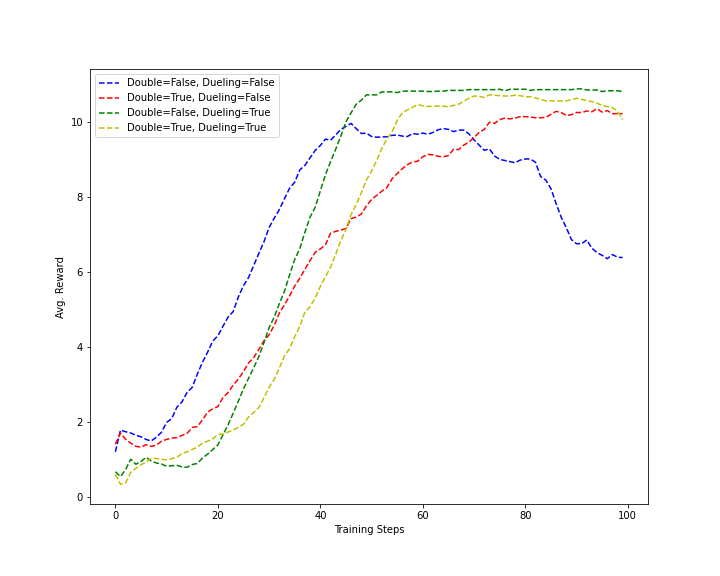

In [ ]:
Image('/content/drive/MyDrive/Colab Notebooks/Breakout_results.png')